In [37]:
file_path = '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/GDP/GDP.csv'

# Read the CSV file with ';' as the delimiter
df = pd.read_csv(file_path  , sep=';')
df['country'] = df['country'].str.lower()
# Print the first 5 rows of the DataFrame
print(df.head())

# Print the last 5 rows of the DataFrame
print(df.tail())

# Print the shape of the DataFrame

                       country iso3          2000          2001          2002  \
0                        aruba  ABW  30199.661277  31169.796914  30662.321715   
1  africa eastern and southern  AFE   1196.895129   1207.197004   1221.239624   
2                  afghanistan  AFG    308.318270    277.118051    338.139974   
3   africa western and central  AFW   1175.774844   1202.423890   1285.712183   
4                       angola  AGO   1932.988479   1947.856730   2139.872597   

           2003          2004          2005          2006          2007  ...  \
0  30651.945756  32192.791947  31249.278037  31038.889867  31759.823202  ...   
1   1224.839257   1259.181138   1301.719234   1350.795881   1402.328173  ...   
2    346.071627    338.637274    363.640141    367.758312    410.757729  ...   
3   1319.360539   1385.009790   1424.638807   1459.328100   1497.188074  ...   
4   2128.195793   2277.866965   2526.410579   2716.253026   2983.041873  ...   

           2014          2015   

DATA    CLEANING


In [39]:
import pandas as pd

# Load the CSV into a DataFrame
file_path = '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/GDP/GDP.csv'

# Read the CSV file with ';' as the delimiter
df = pd.read_csv(file_path  , sep=';')
df['country'] = df['country'].str.lower()
df_melted = df.melt(id_vars=['country', 'iso3'], var_name='year', value_name='value')

# Save the transformed DataFrame to a new CSV
df_melted.to_csv('transformed_file.csv', index=False)  # This saves it as 'transformed_file.csv'


In [52]:

df = pd.read_csv("/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/HDI/HDI.csv", delimiter=';')  # Adjust path as needed

df.columns = df.columns.str.strip()

# Show column names for verification
print(df.columns)

# Ensure the first row contains valid column names (this is based on the example you provided)
df.columns = ['HDI rank', 'country', '1990', 'Unnamed: 3', '2000', 'Unnamed: 5', '2010', 'Unnamed: 7', '2015', 'Unnamed: 9', '2018', 'Unnamed: 11', '2019', 'Unnamed: 13', '2020', 'Unnamed: 15', '2021']

# Remove unnamed columns
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

# Now, the country column is part of the DataFrame, so we can use melt
df = df.melt(id_vars=['HDI rank', 'country'], var_name='year', value_name='HDI')

# Reset the index for a cleaner output
df.reset_index(drop=True, inplace=True)

# Show the cleaned and reshaped DataFrame
df.head()

Index(['HDI rank', 'country', '1990', 'Unnamed: 3', '2000', 'Unnamed: 5',
       '2010', 'Unnamed: 7', '2015', 'Unnamed: 9', '2018', 'Unnamed: 11',
       '2019', 'Unnamed: 13', '2020', 'Unnamed: 15', '2021'],
      dtype='object')


,HDI rank,country,year,HDI
0,1,Switzerland,1990,"0,851"
1,2,Norway,1990,"0,838"
2,3,Iceland,1990,"0,811"
3,4,China,1990,"0,788"
4,5,Australia,1990,"0,865"


In [55]:
import pandas as pd
import pycountry

# Function to get ISO3 code from country name
def get_iso3(country_name):
    try:
        return pycountry.countries.get(name=country_name).alpha_3
    except:
        return None  # In case the country is not found

# Assuming df is the reshaped DataFrame
df['ISO3'] = df['country'].apply(get_iso3)

# Save the DataFrame with the new ISO3 column
df.to_csv('cleaned_data_with_iso3.csv', index=False)

# Show the DataFrame with the new column
print(df)


      HDI rank                   country  year    HDI ISO3
0            1               Switzerland  1990  0,851  CHE
1            2                    Norway  1990  0,838  NOR
2            3                   Iceland  1990  0,811  ISL
3            4                     China  1990  0,788  CHN
4            5                 Australia  1990  0,865  AUS
...        ...                       ...   ...    ...  ...
1523       187                   Burundi  2021  0,426  BDI
1524       188  Central African Republic  2021  0,404  CAF
1525       189                     Niger  2021  0,400  NER
1526       190                      Chad  2021  0,394  TCD
1527       191               South Sudan  2021  0,385  SSD

[1528 rows x 5 columns]


In [203]:
import pandas as pd

file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Salt/Sodium_intake.csv"
df = pd.read_csv(file_path, delimiter=';')  # Specify delimiter correctly

# Display the first few rows
print(df.head())


  continent  iso3  age  female  urban  edu  year  sodium_intake_pd_median  \
0      SAARC  AFG  0.5       0      0    1  1990              1176.778185   
1      SAARC  AFG  0.5       0      0    2  1990              1135.610091   
2      SAARC  AFG  0.5       0      0    3  1990               979.562959   
3      SAARC  AFG  0.5       0      0  999  1990              1171.719752   
4      SAARC  AFG  0.5       0      1    1  1990              1236.216548   

   sodium_intake_upperci_95  sodium_intake_lowerci_95  
0               2539.433977                529.795420  
1               2433.702513                490.793057  
2               2161.543241                455.530116  
3               2408.514299                578.229688  
4               2696.857489                552.498586  


In [204]:
import pandas as pd

# Assuming 'df' is already loaded
df = df.rename(columns={"female": "sex"})

# Convert to binary and add logic for 'Both sexes' as 999
df["sex"] = df["sex"].apply(lambda x: 1 if x in ["Female", "F", 1, "Yes"] else (0 if x in ["Male", "M", 0] else 999))

# Display the first few rows
print(df.head())


  continent  iso3  age  sex  urban  edu  year  sodium_intake_pd_median  \
0      SAARC  AFG  0.5    0      0    1  1990              1176.778185   
1      SAARC  AFG  0.5    0      0    2  1990              1135.610091   
2      SAARC  AFG  0.5    0      0    3  1990               979.562959   
3      SAARC  AFG  0.5    0      0  999  1990              1171.719752   
4      SAARC  AFG  0.5    0      1    1  1990              1236.216548   

   sodium_intake_upperci_95  sodium_intake_lowerci_95  
0               2539.433977                529.795420  
1               2433.702513                490.793057  
2               2161.543241                455.530116  
3               2408.514299                578.229688  
4               2696.857489                552.498586  


In [205]:
# Convert sodium (mg) to salt (g)
df["salt_intake_pd_median"] = df["sodium_intake_pd_median"] * 2.5 / 1000
df["salt_intake_upperci_95"] = df["sodium_intake_upperci_95"] * 2.5 / 1000
df["salt_intake_lowerci_95"] = df["sodium_intake_lowerci_95"] * 2.5 / 1000


# Drop old sodium columns
df.drop(columns=["sodium_intake_pd_median", "sodium_intake_upperci_95", "sodium_intake_lowerci_95", "age","urban","edu"], inplace=True)


In [206]:
df[["salt_intake_pd_median", "salt_intake_upperci_95", "salt_intake_lowerci_95"]] = df[[
    "salt_intake_pd_median", "salt_intake_upperci_95", "salt_intake_lowerci_95"
]].round(2)

print(df.shape)  # Should show the new number of rows
df.head()

(999999, 7)


,continent,iso3,sex,year,salt_intake_pd_median,salt_intake_upperci_95,salt_intake_lowerci_95
0,SAARC,AFG,0,1990,2.94,6.35,1.32
1,SAARC,AFG,0,1990,2.84,6.08,1.23
2,SAARC,AFG,0,1990,2.45,5.40,1.14
3,SAARC,AFG,0,1990,2.93,6.02,1.45
4,SAARC,AFG,0,1990,3.09,6.74,1.38


In [207]:
print(df["year"].dtype)  # Should be int or float
df = df[~df["year"].between(1990, 1999)]
df["year"].value_counts()


int64


year
2000    143244
2005    143019
2010    142416
2015    142416
2018    142416
Name: count, dtype: int64

In [208]:
import pandas as pd

# Assuming 'df' is already loaded
df = df.rename(columns={"female": "sex"})

# Convert to string labels
df["sex"] = df["sex"].apply(lambda x: "Female" if x in ["Female", "F", 1, "Yes"] else ("Male" if x in ["Male", "M", 0] else "Both sexes"))

# Display the first few rows
print(df.head())


     continent  iso3   sex  year  salt_intake_pd_median  \
1656      SAARC  AFG  Male  2000                   2.95   
1657      SAARC  AFG  Male  2000                   2.81   
1658      SAARC  AFG  Male  2000                   2.47   
1659      SAARC  AFG  Male  2000                   2.92   
1660      SAARC  AFG  Male  2000                   3.16   

      salt_intake_upperci_95  salt_intake_lowerci_95  
1656                    6.31                    1.33  
1657                    6.18                    1.30  
1658                    5.43                    1.11  
1659                    5.69                    1.52  
1660                    7.09                    1.39  


In [209]:
df.to_csv("/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Salt/Salt_intake.csv", index=False)


In [129]:
import pandas as pd

file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/Smoking_prevelance.csv"
df = pd.read_csv(file_path, delimiter=';')  # Specify delimiter correctly

# Display the first few rows
print(df.head())

                      continent  2000  2005  2010  2015  2020  2022  2025  \
0                African Region  17.8  15.3  13.2  11.5  10.1   9.5   8.0   
1        Region of the Americas  26.8  23.9  21.3  19.2  17.3  16.6  15.6   
2        South-East Asia Region  51.2  43.6  37.2  32.2  28.0  26.5  24.6   
3              European Region   34.4  31.7  29.5  27.6  25.9  25.3  24.4   
4  Eastern Mediterranean Region  26.9  24.3  22.0  20.1  18.7  17.9  17.5   

   Relative reduction % 2010-2025  
0                            32.0  
1                            27.0  
2                            34.0  
3                            17.0  
4                            15.6  


In [131]:
import pandas as pd

file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/WHO_LE.csv"
df = pd.read_csv(file_path, delimiter=';')  # Specify delimiter correctly

# Display the first few rows
print(df.head())

       country  year  life_expectancy  Life expectancy_male  \
0  Afghanistan  2019             63.2                  63.3   
1  Afghanistan  2015             61.7                  61.0   
2  Afghanistan  2010             59.9                  59.6   
3  Afghanistan  2000             55.0                  54.6   
4      Albania  2019             78.0                  76.3   

   Life expectancy_female  Life expectancy_60  Life expectancy_60_male  \
0                    63.2                15.2                     15.4   
1                    62.3                15.6                     15.7   
2                    60.3                15.1                     15.1   
3                    55.4                13.9                     13.6   
4                    79.9                21.0                     20.2   

   Life expectancy_60_female  
0                       15.1  
1                       15.5  
2                       15.2  
3                       14.2  
4                    

In [133]:
import pycountry

# Function to get ISO3 code from country name
def get_iso3(country_name):
    try:
        return pycountry.countries.lookup(country_name).alpha_3
    except LookupError:
        return None  # Return None if country is not found

# Apply function to create a new 'iso3' column
df["iso3"] = df["country"].apply(get_iso3)

# Check the result
print(df.head())


       country  year  life_expectancy  Life expectancy_male  \
0  Afghanistan  2019             63.2                  63.3   
1  Afghanistan  2015             61.7                  61.0   
2  Afghanistan  2010             59.9                  59.6   
3  Afghanistan  2000             55.0                  54.6   
4      Albania  2019             78.0                  76.3   

   Life expectancy_female  Life expectancy_60  Life expectancy_60_male  \
0                    63.2                15.2                     15.4   
1                    62.3                15.6                     15.7   
2                    60.3                15.1                     15.1   
3                    55.4                13.9                     13.6   
4                    79.9                21.0                     20.2   

   Life expectancy_60_female iso3  
0                       15.1  AFG  
1                       15.5  AFG  
2                       15.2  AFG  
3                       14.2  AF

In [142]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Load dataset
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/WHO_LE.csv"
df = pd.read_csv(file_path)

# Ensure column names have no spaces
df.columns = df.columns.str.strip()

# Check column names
required_columns = {"country", "year", "iso3", 
                    "life_expectancy", "Life expectancy_male", "Life expectancy_female",
                    "Life expectancy_60", "Life expectancy_60_male", "Life expectancy_60_female"}

if not required_columns.issubset(df.columns):
    print("❌ Missing expected columns:", required_columns - set(df.columns))
    exit()

# List of life expectancy columns to predict
columns_to_extrapolate = [
    "life_expectancy", "Life expectancy_male", "Life expectancy_female",
    "Life expectancy_60", "Life expectancy_60_male", "Life expectancy_60_female"
]

# Store extrapolated values
extrapolated_data = []

# Loop through each country
for country in df["country"].unique():
    country_df = df[df["country"] == country].copy()
    
    # Prepare the years as an independent variable
    X = country_df["year"].values.reshape(-1, 1)  
    
    # Train a model for each life expectancy column
    models = {}
    for col in columns_to_extrapolate:
        y = country_df[col].values  
        model = LinearRegression()
        model.fit(X, y)
        models[col] = model  

    # Predict for only 2020 and 2050
    future_years = np.array([2020, 2025]).reshape(-1, 1)

    for year in future_years.flatten():
        prediction = {"country": country, "year": year, "iso3": country_df["iso3"].iloc[0]}  # Include ISO3 code
        
        # Predict each life expectancy value
        for col in columns_to_extrapolate:
            prediction[col] = round(models[col].predict([[year]])[0], 2)
        
        extrapolated_data.append(prediction)

# Convert to DataFrame
df_future = pd.DataFrame(extrapolated_data)

# Merge with original dataset
df_combined = pd.concat([df, df_future])

# Save the new dataset
df_combined.to_csv("/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_Expectancy_Extrapolated.csv", index=False)

print("✅ Extrapolation complete! Data saved for 2020 & 2050 only.")


✅ Extrapolation complete! Data saved for 2020 & 2050 only.


In [146]:
# Laad de dataset met delimiter ";"
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_Expectancy_Extrapolated.csv"
df = pd.read_csv(file_path, delimiter=';')

# Print de kolomnamen om te controleren of 'country' correct is
print(df.columns)

# Verwijder eventueel aanwezige spaties in de kolomnamen
df.columns = df.columns.str.strip()

# Sorteer op 'country' en 'year' als de kolomnamen correct zijn
df_sorted = df.sort_values(by=["country", "year"], ascending=[True, True])

# Opslaan naar een nieuw CSV-bestand
sorted_file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_Expectancy_Sorted.csv"
df_sorted.to_csv(sorted_file_path, index=False)

print("✅ Data gesorteerd! Landen alfabetisch en jaren chronologisch opgeslagen.")


Index(['country', 'year', 'life_expectancy', 'Life expectancy_male',
       'Life expectancy_female', 'Life expectancy_60',
       'Life expectancy_60_male', 'Life expectancy_60_female', 'iso3'],
      dtype='object')
✅ Data gesorteerd! Landen alfabetisch en jaren chronologisch opgeslagen.


In [217]:
df.isna().sum()

country                       0
year                          0
life_expectancy               0
Life expectancy_male          0
Life expectancy_female        0
Life expectancy_60            0
Life expectancy_60_male       0
Life expectancy_60_female     0
iso3                         54
dtype: int64

/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_70302/2975056564.py:34: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


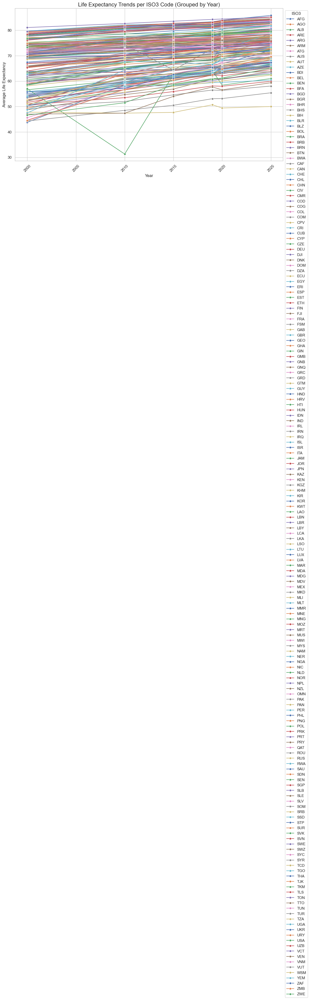

In [219]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset with delimiter ";"
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_Expectancy.csv"
df = pd.read_csv(file_path, delimiter=';')

# Remove extra spaces in column names
df.columns = df.columns.str.strip()

# Group by 'iso3' and 'year', and calculate the mean life expectancy for each group
df_grouped = df.groupby(['iso3', 'year'])['life_expectancy'].mean().reset_index()

# Set up the plot
plt.figure(figsize=(14, 8))

# Set Seaborn style
sns.set(style="whitegrid")

# Loop over unique ISO3 codes and plot life expectancy trends
for iso3 in df_grouped["iso3"].unique():
    iso3_df = df_grouped[df_grouped["iso3"] == iso3]
    
    # Plotting the trend for 'life_expectancy' for each ISO3
    sns.lineplot(x="year", y="life_expectancy", data=iso3_df, label=iso3, marker='o')

# Customize plot appearance
plt.title('Life Expectancy Trends per ISO3 Code (Grouped by Year)', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Life Expectancy', fontsize=12)
plt.legend(title='ISO3', loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


In [220]:
df.columns = df.columns.str.strip()

# Filter data for years 2000 and 2019
df_filtered = df[df['year'].isin([2000, 2020])]

# Group by 'iso3' and 'year', and calculate the mean life expectancy for each group
df_grouped = df_filtered.groupby(['iso3', 'year'])['life_expectancy'].mean().reset_index()

# Pivot the data to get life expectancy for 2000 and 2019 in separate columns
df_pivot = df_grouped.pivot(index='iso3', columns='year', values='life_expectancy').reset_index()

# Filter countries where life expectancy dropped from 2000 to 2019
df_drop = df_pivot[df_pivot[2000] > df_pivot[2020]]

# Show countries where life expectancy dropped
print(df_drop[['iso3', 2000, 2020]])

year iso3  2000   2020
46    DOM  73.2  72.36
157   SYR  71.5  69.76


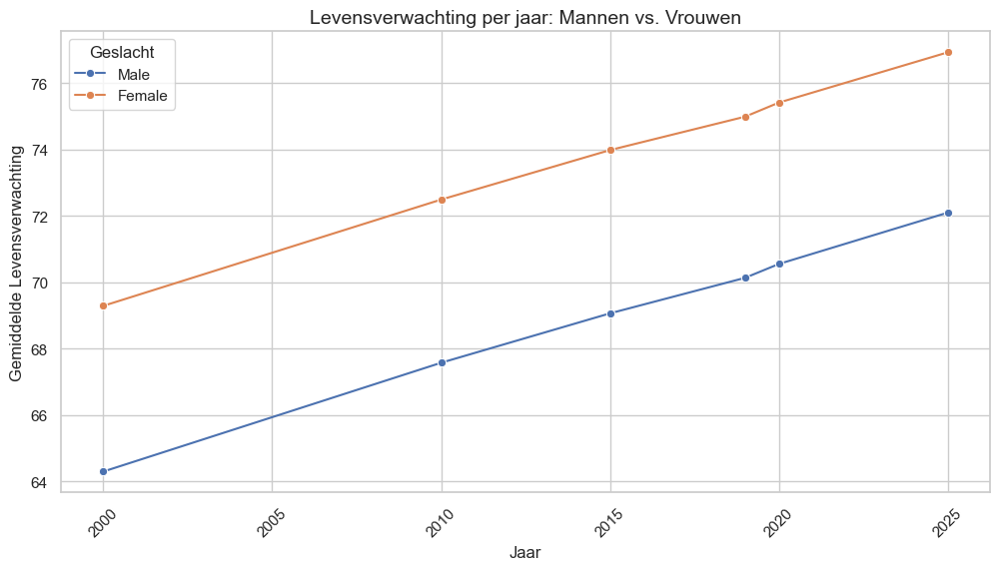

In [227]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_Expectancy.csv"
df = pd.read_csv(file_path, delimiter=';')

# Remove extra spaces in column names
df.columns = df.columns.str.strip()

# Groeperen per jaar en geslacht, gemiddelde berekenen
df_grouped = df.groupby(['year'])[['Life expectancy_male', 'Life expectancy_female']].mean().reset_index()

# Plot
plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='Life expectancy_male', data=df_grouped, label='Male', marker='o')
sns.lineplot(x='year', y='Life expectancy_female', data=df_grouped, label='Female', marker='o')

# Titel en labels
plt.title('Levensverwachting per jaar: Mannen vs. Vrouwen', fontsize=14)
plt.xlabel('Jaar', fontsize=12)
plt.ylabel('Gemiddelde Levensverwachting', fontsize=12)
plt.legend(title='Geslacht')
plt.grid(True)
plt.xticks(rotation=45)

# Show plot
plt.show()


In [10]:
import pandas as pd
import scipy.stats as stats

# Load dataset
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_Expectancy.csv"
df = pd.read_csv(file_path, delimiter=';')

# Remove extra spaces in column names
df.columns = df.columns.str.strip()

# Initialize an empty list to store results
results = []

# Loop through each year and perform t-test
for year in df['year'].unique():
    male_data = df[df['year'] == year]['Life expectancy_male'].dropna()
    female_data = df[df['year'] == year]['Life expectancy_female'].dropna()
    
    # Check if both groups have values before running t-test
    if len(male_data) > 1 and len(female_data) > 1:
        t_stat, p_value = stats.ttest_ind(male_data, female_data, equal_var=False)  # Welch's t-test
        results.append([year, t_stat, p_value])
    else:
        results.append([year, None, None])

# Convert results to DataFrame
results_df = pd.DataFrame(results, columns=['Year', 'T-Statistic', 'P-Value'])

# Display results
print(results_df)

# Mark significance
alpha = 0.05
results_df['Significant'] = results_df['P-Value'] < alpha

# Print significant years
print("\nYears with significant differences in life expectancy between men and women:")
print(results_df[results_df['Significant'] == True])


   Year  T-Statistic       P-Value
0  2000    -4.831687  2.004199e-06
1  2010    -5.347590  1.578739e-07
2  2015    -6.118638  2.439810e-09
3  2019    -6.472843  3.112507e-10
4  2020    -6.479399  2.994244e-10
5  2025    -6.804764  4.190119e-11

Years with significant differences in life expectancy between men and women:
   Year  T-Statistic       P-Value  Significant
0  2000    -4.831687  2.004199e-06         True
1  2010    -5.347590  1.578739e-07         True
2  2015    -6.118638  2.439810e-09         True
3  2019    -6.472843  3.112507e-10         True
4  2020    -6.479399  2.994244e-10         True
5  2025    -6.804764  4.190119e-11         True


In [11]:
print(df.columns)


Index(['country', 'iso3', 'year', 'life_expectancy', 'Life expectancy_male',
       'Life expectancy_female', 'Life expectancy_60',
       'Life expectancy_60_male', 'Life expectancy_60_female'],
      dtype='object')


In [14]:
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Alcohol/total-alcohol-consumption-per-capita-litres-of-pure-alcohol.csv"
df = pd.read_csv(file_path, delimiter=',')
df.isna().sum()




country                          0
iso3                           273
year                             0
alcohol_in_units_per_capita      0
dtype: int64

In [19]:
# Filter rows where iso3 is NaN and display only the country column
empty_countries = df.loc[df["iso3"].isna(), "country"]
empty_countries.head(50)


1050      east asia and pacific (wb)
1051      east asia and pacific (wb)
1052      east asia and pacific (wb)
1053      east asia and pacific (wb)
1054      east asia and pacific (wb)
1055      east asia and pacific (wb)
1056      east asia and pacific (wb)
1057      east asia and pacific (wb)
1058      east asia and pacific (wb)
1059      east asia and pacific (wb)
1060      east asia and pacific (wb)
1061      east asia and pacific (wb)
1062      east asia and pacific (wb)
1063      east asia and pacific (wb)
1064      east asia and pacific (wb)
1065      east asia and pacific (wb)
1066      east asia and pacific (wb)
1067      east asia and pacific (wb)
1068      east asia and pacific (wb)
1069      east asia and pacific (wb)
1070      east asia and pacific (wb)
1260    europe and central asia (wb)
1261    europe and central asia (wb)
1262    europe and central asia (wb)
1263    europe and central asia (wb)
1264    europe and central asia (wb)
1265    europe and central asia (wb)
1

In [21]:
# Count the number of occurrences for each country where iso3 is missing
country_counts = df.loc[df["iso3"].isna(), "country"].value_counts()
print(country_counts)


country
east asia and pacific (wb)           21
europe and central asia (wb)         21
european union (27)                  21
high-income countries                21
latin america and caribbean (wb)     21
low-income countries                 21
lower-middle-income countries        21
middle east and north africa (wb)    21
middle-income countries              21
north america (wb)                   21
south asia (wb)                      21
sub-saharan africa (wb)              21
upper-middle-income countries        21
Name: count, dtype: int64


In [24]:
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/BMI/BMI_cleaned.csv"
df = pd.read_csv(file_path, delimiter=',')
df.isna().sum()

continent_iso3        0
continent             0
iso3                  0
country               0
year                  0
sex                   0
bmi_over_30_%         0
bmi_over_30_%_low     0
bmi_over_30_%_high    0
dtype: int64

In [26]:
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/daily-per-capita-caloric-supply/daily-per-capita-caloric-supply.csv"
df = pd.read_csv(file_path, delimiter=';')
df.isna().sum()

country            0
iso3            2619
year               0
kcal_per_day       0
dtype: int64

In [27]:
# Count the number of occurrences for each country where iso3 is missing
country_counts = df.loc[df["iso3"].isna(), "country"].value_counts()
print(country_counts)


country
Africa                                           61
Small Island Developing States (FAO)             61
Middle Africa (FAO)                              61
Net Food Importing Developing Countries (FAO)    61
North America                                    61
Northern Africa (FAO)                            61
Northern America (FAO)                           61
Northern Europe (FAO)                            61
Oceania                                          61
Oceania (FAO)                                    61
South America                                    61
Africa (FAO)                                     61
South America (FAO)                              61
South-eastern Asia (FAO)                         61
Southern Africa (FAO)                            61
Southern Asia (FAO)                              61
Southern Europe (FAO)                            61
Upper-middle-income countries                    61
Western Africa (FAO)                             61
West

In [29]:
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/daily-per-capita-caloric-supply/daily-per-capita-caloric-supply.csv"
df = pd.read_csv(file_path, delimiter=';')
df.isna().sum()

country            0
iso3            2619
year               0
kcal_per_day       0
dtype: int64

In [30]:
# Count the number of occurrences for each country where iso3 is missing
country_counts = df.loc[df["iso3"].isna(), "country"].value_counts()
print(country_counts)


country
Africa                                           61
Small Island Developing States (FAO)             61
Middle Africa (FAO)                              61
Net Food Importing Developing Countries (FAO)    61
North America                                    61
Northern Africa (FAO)                            61
Northern America (FAO)                           61
Northern Europe (FAO)                            61
Oceania                                          61
Oceania (FAO)                                    61
South America                                    61
Africa (FAO)                                     61
South America (FAO)                              61
South-eastern Asia (FAO)                         61
Southern Africa (FAO)                            61
Southern Asia (FAO)                              61
Southern Europe (FAO)                            61
Upper-middle-income countries                    61
Western Africa (FAO)                             61
West

In [40]:
file_path = r"/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Fruit_vegetable data/vegetable-fruit-consumption-per-capita.csv"
df = pd.read_csv(file_path, delimiter=';')
print(df.isna().sum())
df.shape


country                             0
iso3                             2619
year                                0
vegetables_kilograms_per_year       0
fruits_kilograms_per_year           0
dtype: int64


(12592, 5)

In [103]:
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/HDI/HDI_clean.csv"
df = pd.read_csv(file_path, delimiter=';')
df.isna().sum()



HDI rank     0
country      0
year         0
HDI         69
iso3         0
dtype: int64

In [102]:
df.isna().sum()

HDI rank     0
country      0
year         0
HDI          0
iso3        56
dtype: int64

In [98]:
# Save the sorted DataFrame as a CSV file (no engine needed)
df_sorted.to_csv('/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/HDI/HDI_clean_again.csv', index=False)


In [112]:
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Salt/Salt_intake.csv"
df = pd.read_csv(file_path, delimiter=',')
df.isna().sum()


continent                    0
iso3                         0
sex                          0
year                         0
salt_intake_pd_median     2784
salt_intake_upperci_95    2784
salt_intake_lowerci_95    2784
dtype: int64

In [120]:
import pandas as pd

# Load the dataset with semicolon as the delimiter
file_path = '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/Smoking_prevelance.csv'
df = pd.read_csv(file_path, delimiter=';')

# Use df.melt() to reshape the DataFrame
df_melted = df.melt(id_vars=['continent'],  # Adjust this column if necessary
                    var_name='Year', 
                    value_name='Value')

# Save the melted DataFrame to a new CSV file
output_path = '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/Smoking_prevelance_melted.csv'
df_melted.to_csv(output_path, index=False)

# Confirm the save
print(f"Data saved to {output_path}")


Data saved to /Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/Smoking_prevelance_melted.csv


In [127]:
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_Expectancy.csv"
df = pd.read_csv(file_path, delimiter=';')
df.isna().sum()

df.dtypes

country                       object
iso3                          object
year                           int64
life_expectancy              float64
Life expectancy_male         float64
Life expectancy_female       float64
Life expectancy_60           float64
Life expectancy_60_male      float64
Life expectancy_60_female    float64
dtype: object

import pandas as pd

# Load the dataset
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_Expectancy.csv"
df = pd.read_csv(file_path, delimiter=';')

# Rename columns: lowercase and replace spaces with underscores
df.columns = df.columns.str.lower().str.replace(" ", "_")

# Display new column names
print(df.columns)


In [129]:
import pandas as pd

# Load the dataset
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_Expectancy.csv"
df = pd.read_csv(file_path, delimiter=';')

# Rename columns: lowercase and replace spaces with underscores
df.columns = df.columns.str.lower().str.replace(" ", "_")

# Display new column names
print(df.columns)

output_path = '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/life_expectancy.csv'
df.to_csv(output_path, index=False)


Index(['country', 'iso3', 'year', 'life_expectancy', 'life_expectancy_male',
       'life_expectancy_female', 'life_expectancy_60',
       'life_expectancy_60_male', 'life_expectancy_60_female'],
      dtype='object')


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_23003/1383583373.py:26: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


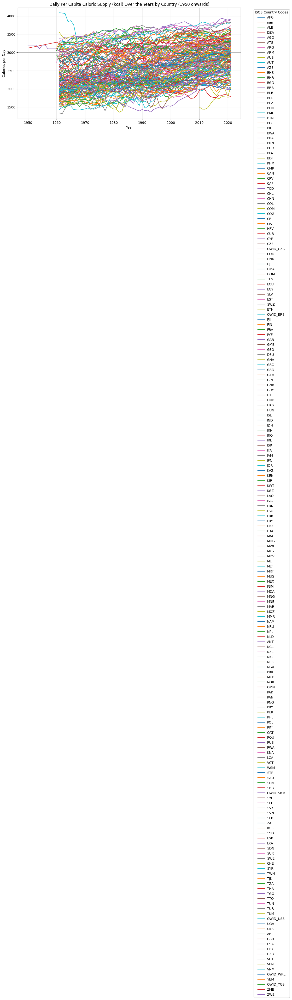

In [ ]:
import pandas as pd

# Load your data into a DataFrame
df = pd.read_csv("your_data.csv")  # Replace with your actual file path

# Pivot the table to get 'male', 'both sexes', and 'female' as separate columns
df_pivot = df.pivot(index=['continent_iso3', 'continent', 'iso3', 'country', 'year'], 
                     columns='sex', 
                     values='bmi_over_30_procent').reset_index()

# Rename columns to lowercase and remove spaces
df_pivot.columns.name = None  # Remove index name
df_pivot.rename(columns={"Male": "bmi_male", "Both sexes": "bmi_both_sexes", "Female": "bmi_female"}, inplace=True)

# Display the reshaped DataFrame
print(df_pivot)


In [144]:
import pandas as pd

# Load the dataset with the correct delimiter
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/BMI/BMI_cleaned.csv"
df = pd.read_csv(file_path, delimiter=";")

# Print column names to check for inconsistencies
print("Original columns:", df.columns)

# Strip whitespace, convert to lowercase, and replace spaces with underscores
df.columns = df.columns.str.strip().str.lower().str.replace(" ", "_")
print("Cleaned columns:", df.columns)  # Verify column names are SQL-friendly

# Pivot the table to reshape the BMI data
df_pivot = df.pivot(index=['continent_iso3', 'continent', 'iso3', 'country', 'year'], 
                     columns='sex', 
                     values='bmi_over_30_procent').reset_index()

# Remove column index name
df_pivot.columns.name = None  

# Rename columns to lowercase and replace spaces with underscores for SQL compatibility
df_pivot.rename(columns={"male": "bmi_male", "both_sexes": "bmi_both_sexes", "female": "bmi_female"}, inplace=True)

# Replace NaN values with 0 (or use another default value if necessary)
df_pivot.fillna(0, inplace=True)

# Save the transformed dataset with a comma as the delimiter and UTF-8 encoding
output_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/BMI/BMI_transformed.csv"
df_pivot.to_csv(output_path, index=False, sep=",", encoding="utf-8")

print(f"Transformed data saved to: {output_path}")


Original columns: Index(['continent_iso3', 'continent', 'iso3', 'country', 'year', 'sex',
       'bmi_over_30_procent', 'bmi_over_30_procent_low',
       'bmi_over_30_procent_high'],
      dtype='object')
Cleaned columns: Index(['continent_iso3', 'continent', 'iso3', 'country', 'year', 'sex',
       'bmi_over_30_procent', 'bmi_over_30_procent_low',
       'bmi_over_30_procent_high'],
      dtype='object')
Transformed data saved to: /Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/BMI/BMI_transformed.csv


In [154]:
import pandas as pd

# Load the dataset with the correct delimiter
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/PAL/Physical_activity.csv"
df = pd.read_csv(file_path, delimiter=";")

# Print column names to check for inconsistencies
print("Original columns:", df.columns)

# Strip whitespace, convert to lowercase, and replace spaces with underscores
df.columns = df.columns.str.strip().str.lower().str.replace(" ", "_").str.replace("%", "_procent")
print("Cleaned columns:", df.columns)  # Verify column names are SQL-friendly

# Pivot the table to reshape the inactivity data
df_pivot = df.pivot(index=['continent_code', 'continent', 'iso3', 'country', 'year'], 
                     columns='sex', 
                     values='inactivity_procent').reset_index()

# Remove column index name
df_pivot.columns.name = None  

# Rename columns to lowercase and replace spaces with underscores for SQL compatibility
df_pivot.rename(columns={"male": "inactivity_male", "female": "inactivity_female", "both_sexes": "inactivity_both_sexes"}, inplace=True)

# Replace NaN values with 0 (or use another default value if necessary)
df_pivot.fillna(0, inplace=True)

# Save the transformed dataset with a comma as the delimiter and UTF-8 encoding
output_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/PAL/Physical_activity_transformed.csv"
df_pivot.to_csv(output_path, index=False, sep=",", encoding="utf-8")

print(f"Transformed data saved to: {output_path}")


Original columns: Index(['continent_code', 'continent', 'iso3', 'country', 'year', 'sex',
       'inactivity_procent', 'inactivity_procent_low',
       'inactivity_procent_high'],
      dtype='object')
Cleaned columns: Index(['continent_code', 'continent', 'iso3', 'country', 'year', 'sex',
       'inactivity_procent', 'inactivity_procent_low',
       'inactivity_procent_high'],
      dtype='object')
Transformed data saved to: /Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/PAL/Physical_activity_cleaned.csv


In [150]:
import pandas as pd

# Load the dataset with the correct delimiter
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/PAL/Physical_activity.csv"
df = pd.read_csv(file_path, delimiter=";")

# Print column names to check for inconsistencies
print("Original columns:", df.columns)

# Strip whitespace, convert to lowercase, and replace spaces with underscores
df.columns = df.columns.str.strip().str.lower().str.replace(" ", "_").str.replace("%", "_procent")
print("Cleaned columns:", df.columns)  # Verify column names are SQL-friendly

# Pivot the table to reshape the inactivity data
df_pivot = df.pivot(index=['continent_code', 'continent', 'iso3', 'country', 'year'], 
                     columns='sex', 
                     values='inactivity_%').reset_index()

# Remove column index name
df_pivot.columns.name = None  

# Rename columns to lowercase and replace spaces with underscores for SQL compatibility
df_pivot.rename(columns={"male": "inactivity_male", "female": "inactivity_female"}, inplace=True)

# Replace NaN values with 0 (or use another default value if necessary)
df_pivot.fillna(0, inplace=True)

# Save the transformed dataset with a comma as the delimiter and UTF-8 encoding
output_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/PAL/Physical_activity_transformed.csv"
df_pivot.to_csv(output_path, index=False, sep=",", encoding="utf-8")

print(f"Transformed data saved to: {output_path}")


Original columns: Index(['continent_code', 'continent', 'iso3', 'country', 'year', 'sex',
       'inactivity_%', 'inactivity_%_low', 'inactivity_%_high'],
      dtype='object')
Cleaned columns: Index(['continent_code', 'continent', 'iso3', 'country', 'year', 'sex',
       'inactivity__procent', 'inactivity__procent_low',
       'inactivity__procent_high'],
      dtype='object')


KeyError: 'inactivity_%'

Original columns: Index(['continent ', 'iso3', 'sex', 'year', 'salt_intake_pd_median',
       'salt_intake_upperci_95', 'salt_intake_lowerci_95'],
      dtype='object')
Cleaned columns: Index(['continent', 'iso3', 'sex', 'year', 'salt_intake_pd_median',
       'salt_intake_upperci_95', 'salt_intake_lowerci_95'],
      dtype='object')


ValueError: Index contains duplicate entries, cannot reshape

In [157]:
import pandas as pd

# Bestandspad instellen
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Salt/Salt_intake.csv"

# Dataset inladen
df = pd.read_csv(file_path, delimiter=",")

# Kolomnamen opschonen
df.columns = df.columns.str.strip().str.lower().str.replace(" ", "_")

# Zoek naar duplicaten (exclusief de eerste keer dat een waarde voorkomt)
duplicates = df[df.duplicated(subset=['iso3', 'year', 'sex'], keep=False)]

# Duplicaten tonen
if not duplicates.empty:
    print("🚨 Dubbele waarden gevonden:")
    print(duplicates)
else:
    print("✅ Geen duplicaten gevonden!")


🚨 Dubbele waarden gevonden:
       continent iso3         sex  year  salt_intake_pd_median  \
0          SAARC  AFG        Male  2000                   2.95   
1          SAARC  AFG        Male  2000                   2.81   
2          SAARC  AFG        Male  2000                   2.47   
3          SAARC  AFG        Male  2000                   2.92   
4          SAARC  AFG        Male  2000                   3.16   
...          ...  ...         ...   ...                    ...   
713506       FSU  UKR      Female  2005                   5.38   
713507       FSU  UKR      Female  2005                   5.59   
713508       FSU  UKR  Both sexes  2005                   6.55   
713509       FSU  UKR  Both sexes  2005                   6.10   
713510       FSU  UKR  Both sexes  2005                   5.37   

        salt_intake_upperci_95  salt_intake_lowerci_95  
0                         6.31                    1.33  
1                         6.18                    1.30  
2       

In [158]:
full_duplicates = df[df.duplicated(keep=False)]
print("🚨 Volledig dubbele rijen:")
print(full_duplicates)


🚨 Volledig dubbele rijen:
       continent iso3         sex  year  salt_intake_pd_median  \
4249         SSA  AGO        Male  2000                   4.83   
4250         SSA  AGO        Male  2000                   4.83   
5028         SSA  AGO  Both sexes  2005                   2.82   
5030         SSA  AGO  Both sexes  2005                   2.82   
8059         SSA  AGO  Both sexes  2018                   4.19   
...          ...  ...         ...   ...                    ...   
711976       SSA  UGA        Male  2018                   2.91   
711987       SSA  UGA      Female  2018                   2.80   
711993       SSA  UGA      Female  2018                   2.80   
712681       FSU  UKR  Both sexes  2000                   5.76   
712721       FSU  UKR  Both sexes  2000                   5.76   

        salt_intake_upperci_95  salt_intake_lowerci_95  
4249                      9.75                    2.43  
4250                      9.75                    2.43  
5028      

In [161]:
import pandas as pd

# Bestandspad instellen
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Salt/Salt_intake.csv"

# Dataset inladen
df = pd.read_csv(file_path, delimiter=",")

# Kolomnamen opschonen
df.columns = df.columns.str.strip().str.lower().str.replace(" ", "_")

# Verwijder dubbele rijen (gebaseerd op 'iso3', 'year', 'sex')
df_clean = df.drop_duplicates(subset=['iso3', 'year', 'sex'], keep='first')

# Controleer of er nog dubbele rijen zijn
print(f"Na het verwijderen van dubbele rijen: {len(df) - len(df_clean)} rijen verwijderd.")


Na het verwijderen van dubbele rijen: 710925 rijen verwijderd.


In [ ]:
geopandas

In [163]:
# Pivot om 'Male' en 'Female' als aparte kolommen te krijgen
df_pivot = df_clean.pivot(index=['iso3', 'year'], 
                          columns='sex', 
                          values='salt_intake_pd_median').reset_index()

# Kolomnamen aanpassen voor SQL-compatibiliteit
df_pivot.rename(columns={"male": "salt_intake_male", "female": "salt_intake_female"}, inplace=True)

# Missende waarden vervangen door 0 (of een andere logische standaardwaarde)
df_pivot.fillna(0, inplace=True)

# Nieuw bestandspad instellen voor het getransformeerde bestand
output_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Salt/Salt_intake_Transformed.csv"

# Dataframe opslaan als CSV met een komma als delimiter en UTF-8 encoding
df_pivot.to_csv(output_path, index=False, sep=",", encoding="utf-8")

print(f"Getransformeerde data opgeslagen naar: {output_path}")


Getransformeerde data opgeslagen naar: /Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Salt/Salt_intake_Transformed.csv


In [172]:
pip install iso3166


Note: you may need to restart the kernel to use updated packages.


In [238]:
import pandas as pd
import pycountry

# Load the data with the correct delimiter
iso3_df = pd.read_csv('/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/Smoking_data.csv', delimiter=';')

# Keep only the relevant column (iso3)
iso3_df = iso3_df[['iso3']]

# Function to get country name from iso3 code
def get_country_name_from_iso3(iso3):
    try:
        country = pycountry.countries.get(alpha_3=iso3)
        return country.name
    except AttributeError:
        return None  # If no country is found for that ISO3 code

# Add a new column with country names based on iso3 codes
iso3_df['country'] = iso3_df['iso3'].apply(get_country_name_from_iso3)

# Check the updated data
print(iso3_df.head())

# Save the cleaned dataset with the added country name information
iso3_df.to_csv('/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/Smoking_data_with_country_name.csv', index=False)


  iso3   country
0  ZWE  Zimbabwe
1  ZWE  Zimbabwe
2  ZWE  Zimbabwe
3  ZWE  Zimbabwe
4  ZWE  Zimbabwe


In [240]:
import pandas as pd

# List of years and ISO3 country codes
years = [2000, 2005, 2010, 2015, 2020, 2022, 2025]
iso3_codes = ['ZWE', 'ZMB', 'ZAF', 'YEM', 'WSM', 'VUT', 'VNM', 'VCT', 'UZB', 'USA', 'URY', 'UKR',
              'UGA', 'TZA', 'TUN', 'TTO', 'TON', 'TLS', 'TKM', 'TJK', 'THA', 'TGO', 'TCD', 'SYR',
              'SYC', 'SWZ', 'SWE', 'SVN', 'SVK', 'SUR', 'STP', 'SSD', 'SRB', 'SOM', 'SLV', 'SLE',
              'SLB', 'SGP', 'SEN', 'SDN', 'SAU', 'RWA', 'RUS', 'ROU', 'QAT', 'PRY', 'PRT', 'PRK',
              'POL', 'PNG', 'PHL', 'PER', 'PAN', 'PAK', 'OMN', 'NZL', 'NPL', 'NOR', 'NIC', 'NGA',
              'NER', 'NAM', 'MYS', 'MWI', 'MUS', 'MRT', 'MOZ', 'MNG', 'MNE', 'MMR', 'MLT', 'MLI',
              'MKD', 'MEX', 'MDV', 'MDG', 'MDA', 'MAR', 'LVA', 'LUX', 'LTU', 'LSO', 'LKA', 'LCA',
              'LBY', 'LBR', 'LBN', 'LAO', 'KWT', 'KIR', 'KHM', 'KGZ', 'KEN', 'KAZ', 'JPN', 'JOR',
              'JAM', 'ITA', 'ISR', 'ISL', 'IRQ', 'IRL', 'IND', 'IDN', 'HUN', 'HTI', 'HRV', 'HND',
              'GUY', 'GTM', 'GRD', 'GRC', 'GNQ', 'GNB', 'GMB', 'GIN', 'GHA', 'GEO', 'GBR', 'GAB',
              'FRA', 'FJI', 'FIN', 'ETH', 'EST', 'ESP', 'ERI', 'EGY', 'ECU', 'DZA', 'DOM', 'DNK',
              'DJI', 'DEU', 'CZE', 'CYP', 'CUB', 'CRI', 'CPV', 'COM', 'COL', 'COG', 'CMR', 'CHN',
              'CHL', 'CHE', 'CAN', 'CAF', 'BWA', 'BTN', 'BRN', 'BRB', 'BRA', 'BLZ', 'BLR', 'BIH',
              'BHS', 'BHR', 'BGR', 'BGD', 'BFA', 'BEN', 'BEL', 'BDI', 'AZE', 'AUT', 'AUS', 'ATG',
              'ARM', 'ARG', 'ARE', 'ALB', 'AGO', 'AFG', 'BOL', 'CIV', 'COD', 'IRN', 'FSM', 'NLD',
              'KOR', 'TUR', 'VEN']

# Create a DataFrame with all combinations of ISO3 codes and years
iso3_df = pd.DataFrame([(iso3, year) for iso3 in iso3_codes for year in years], columns=['iso3', 'year'])

# If you have existing data, merge it with iso3_df
# For example, if 'data' is your existing DataFrame:
# data = pd.DataFrame({'iso3': [...], 'year': [...], 'value': [...]})
# merged_data = pd.merge(iso3_df, data, on=['iso3', 'year'], how='left')

# Display the resulting DataFrame
print(iso3_df)
iso3_df.head(10)  

     iso3  year
0     ZWE  2000
1     ZWE  2005
2     ZWE  2010
3     ZWE  2015
4     ZWE  2020
...   ...   ...
1276  VEN  2010
1277  VEN  2015
1278  VEN  2020
1279  VEN  2022
1280  VEN  2025

[1281 rows x 2 columns]


,iso3,year
0,ZWE,2000
1,ZWE,2005
2,ZWE,2010
3,ZWE,2015
4,ZWE,2020
5,ZWE,2022
6,ZWE,2025
7,ZMB,2000
8,ZMB,2005
9,ZMB,2010


In [241]:


# Get all unique iso3 codes
unique_iso3 = iso3_df['iso3'].unique()

# Display the unique iso3 codes
print(unique_iso3)


['ZWE' 'ZMB' 'ZAF' 'YEM' 'WSM' 'VUT' 'VNM' 'VCT' 'UZB' 'USA' 'URY' 'UKR'
 'UGA' 'TZA' 'TUN' 'TTO' 'TON' 'TLS' 'TKM' 'TJK' 'THA' 'TGO' 'TCD' 'SYR'
 'SYC' 'SWZ' 'SWE' 'SVN' 'SVK' 'SUR' 'STP' 'SSD' 'SRB' 'SOM' 'SLV' 'SLE'
 'SLB' 'SGP' 'SEN' 'SDN' 'SAU' 'RWA' 'RUS' 'ROU' 'QAT' 'PRY' 'PRT' 'PRK'
 'POL' 'PNG' 'PHL' 'PER' 'PAN' 'PAK' 'OMN' 'NZL' 'NPL' 'NOR' 'NIC' 'NGA'
 'NER' 'NAM' 'MYS' 'MWI' 'MUS' 'MRT' 'MOZ' 'MNG' 'MNE' 'MMR' 'MLT' 'MLI'
 'MKD' 'MEX' 'MDV' 'MDG' 'MDA' 'MAR' 'LVA' 'LUX' 'LTU' 'LSO' 'LKA' 'LCA'
 'LBY' 'LBR' 'LBN' 'LAO' 'KWT' 'KIR' 'KHM' 'KGZ' 'KEN' 'KAZ' 'JPN' 'JOR'
 'JAM' 'ITA' 'ISR' 'ISL' 'IRQ' 'IRL' 'IND' 'IDN' 'HUN' 'HTI' 'HRV' 'HND'
 'GUY' 'GTM' 'GRD' 'GRC' 'GNQ' 'GNB' 'GMB' 'GIN' 'GHA' 'GEO' 'GBR' 'GAB'
 'FRA' 'FJI' 'FIN' 'ETH' 'EST' 'ESP' 'ERI' 'EGY' 'ECU' 'DZA' 'DOM' 'DNK'
 'DJI' 'DEU' 'CZE' 'CYP' 'CUB' 'CRI' 'CPV' 'COM' 'COL' 'COG' 'CMR' 'CHN'
 'CHL' 'CHE' 'CAN' 'CAF' 'BWA' 'BTN' 'BRN' 'BRB' 'BRA' 'BLZ' 'BLR' 'BIH'
 'BHS' 'BHR' 'BGR' 'BGD' 'BFA' 'BEN' 'BEL' 'BDI' 'A

In [242]:
import pandas as pd


# Define a dictionary mapping iso3 codes to regions
iso3_to_region = {
    'ZWE': 'African Region', 'ZMB': 'African Region', 'ZAF': 'African Region',
    'YEM': 'Eastern Mediterranean Region', 'WSM': 'Western Pacific Region', 'VUT': 'Pacific Region',
    'VNM': 'South-East Asia Region', 'VCT': 'Caribbean Region', 'UZB': 'Central Asia Region',
    'USA': 'Region of the Americas', 'URY': 'Region of the Americas', 'UKR': 'European Region',
    'UGA': 'African Region', 'TZA': 'African Region', 'TUN': 'African Region', 'TTO': 'Region of the Americas',
    'TON': 'Western Pacific Region', 'TLS': 'South-East Asia Region', 'TKM': 'Central Asia Region',
    'TJK': 'Central Asia Region', 'THA': 'South-East Asia Region', 'TGO': 'African Region',
    'TCD': 'African Region', 'SYR': 'Eastern Mediterranean Region', 'SYC': 'African Region',
    'SWZ': 'African Region', 'SWE': 'European Region', 'SVN': 'European Region', 'SVK': 'European Region',
    'SUR': 'Region of the Americas', 'STP': 'African Region', 'SSD': 'African Region', 'SRB': 'European Region',
    'SOM': 'African Region', 'SLV': 'Region of the Americas', 'SLE': 'African Region', 'SLB': 'Pacific Region',
    'SGP': 'South-East Asia Region', 'SEN': 'African Region', 'SDN': 'African Region', 'SAU': 'Eastern Mediterranean Region',
    'RWA': 'African Region', 'RUS': 'European Region', 'ROU': 'European Region', 'QAT': 'Eastern Mediterranean Region',
    'PRY': 'Region of the Americas', 'PRT': 'European Region', 'PRK': 'Eastern Mediterranean Region',
    'POL': 'European Region', 'PNG': 'Western Pacific Region', 'PHL': 'South-East Asia Region', 'PER': 'Region of the Americas',
    'PAN': 'Region of the Americas', 'PAK': 'South-East Asia Region', 'OMN': 'Eastern Mediterranean Region',
    'NZL': 'Western Pacific Region', 'NPL': 'South-East Asia Region', 'NOR': 'European Region', 'NIC': 'Region of the Americas',
    'NGA': 'African Region', 'NER': 'African Region', 'NAM': 'African Region', 'MYS': 'South-East Asia Region',
    'MWI': 'African Region', 'MUS': 'African Region', 'MRT': 'African Region', 'MOZ': 'African Region',
    'MNG': 'Eastern Mediterranean Region', 'MNE': 'European Region', 'MMR': 'South-East Asia Region',
    'MLT': 'European Region', 'MLI': 'African Region', 'MKD': 'European Region', 'MEX': 'Region of the Americas',
    'MDV': 'South-East Asia Region', 'MDG': 'African Region', 'MDA': 'Eastern Mediterranean Region', 'MAR': 'African Region',
    'LVA': 'European Region', 'LUX': 'European Region', 'LTU': 'European Region', 'LSO': 'African Region',
    'LKA': 'South-East Asia Region', 'LCA': 'Region of the Americas', 'LBY': 'Eastern Mediterranean Region',
    'LBR': 'African Region', 'LBN': 'Eastern Mediterranean Region', 'LAO': 'South-East Asia Region',
    'KWT': 'Eastern Mediterranean Region', 'KIR': 'Pacific Region', 'KHM': 'South-East Asia Region', 'KGZ': 'Central Asia Region',
    'KEN': 'African Region', 'KAZ': 'Central Asia Region', 'JPN': 'Western Pacific Region', 'JOR': 'Eastern Mediterranean Region',
    'JAM': 'Region of the Americas', 'ITA': 'European Region', 'ISR': 'Eastern Mediterranean Region', 'ISL': 'European Region',
    'IRQ': 'Eastern Mediterranean Region', 'IRL': 'European Region', 'IND': 'South-East Asia Region', 'IDN': 'South-East Asia Region',
    'HUN': 'European Region', 'HTI': 'Region of the Americas', 'HRV': 'European Region', 'HND': 'Region of the Americas',
    'GUY': 'Region of the Americas', 'GTM': 'Region of the Americas', 'GRD': 'Region of the Americas', 'GRC': 'European Region',
    'GNQ': 'African Region', 'GNB': 'African Region', 'GMB': 'African Region', 'GIN': 'African Region', 'GHA': 'African Region',
    'GEO': 'Central Asia Region', 'GBR': 'European Region', 'GAB': 'African Region', 'FRA': 'European Region', 'FJI': 'Pacific Region',
    'FIN': 'European Region', 'ETH': 'African Region', 'EST': 'European Region', 'ESP': 'European Region', 'ERI': 'African Region',
    'EGY': 'Eastern Mediterranean Region', 'ECU': 'Region of the Americas', 'DZA': 'African Region', 'DOM': 'Region of the Americas',
    'DNK': 'European Region', 'DJI': 'African Region', 'DEU': 'European Region', 'CZE': 'European Region', 'CYP': 'European Region',
    'CUB': 'Region of the Americas', 'CRI': 'Region of the Americas', 'CPV': 'African Region', 'COM': 'African Region', 'COL': 'Region of the Americas',
    'COG': 'African Region', 'CMR': 'African Region', 'CHN': 'Eastern Mediterranean Region', 'CHL': 'Region of the Americas',
    'CHE': 'European Region', 'CAN': 'Region of the Americas', 'CAF': 'African Region', 'BWA': 'African Region', 'BTN': 'South-East Asia Region',
    'BRN': 'South-East Asia Region', 'BRB': 'Region of the Americas', 'BRA': 'Region of the Americas', 'BLZ': 'Region of the Americas',
    'BLR': 'Eastern Mediterranean Region', 'BIH': 'European Region', 'BHS': 'Region of the Americas', 'BHR': 'Middle East Region',
    'BGR': 'Eastern Mediterranean Region', 'BGD': 'South-East Asia Region', 'BFA': 'African Region', 'BEN': 'African Region', 'BEL': 'European Region',
    'BDI': 'African Region', 'AZE': 'Central Asia Region', 'AUT': 'European Region', 'AUS': 'Western Pacific Region', 'ATG': 'Region of the Americas',
    'ARM': 'Eastern Mediterranean Region', 'ARG': 'Region of the Americas', 'ARE': 'Western Pacific Region', 'ALB': 'European Region',
    'AGO': 'African Region', 'AFG': 'South-East Asia Region', 'BOL': 'Region of the Americas', 'CIV': 'African Region', 'COD': 'African Region',
    'IRN': 'Eastern Mediterranean Region', 'FSM': 'Pacific Region', 'NLD': 'Western Europe Region', 'KOR': 'Eastern Asia Region', 'TUR': 'Eastern Mediterranean Region',
    'VEN': 'Region of the Americas'
}

# Function to map iso3 to regions
iso3_df['continent'] = iso3_df['iso3'].map(iso3_to_region)

# Check the updated data
print(iso3_df.head())

# Save the cleaned dataset with the added region information
iso3_df.to_csv('/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/Smoking_data_with_region.csv', index=False)


  iso3  year       continent
0  ZWE  2000  African Region
1  ZWE  2005  African Region
2  ZWE  2010  African Region
3  ZWE  2015  African Region
4  ZWE  2020  African Region


In [244]:
region_year_value = {
    ('African Region', 2000): 17.8,
    ('Region of the Americas', 2000): 26.8,
    ('South-East Asia Region', 2000): 51.2,
    ('European Region', 2000): 34.4,
    ('Eastern Mediterranean Region', 2000): 26.9,
    ('Western Pacific Region', 2000): 28.0,
    ('Global', 2000): 32.7,
    
    ('African Region', 2005): 15.3,
    ('Region of the Americas', 2005): 23.9,
    ('South-East Asia Region', 2005): 43.6,
    ('European Region', 2005): 31.7,
    ('Eastern Mediterranean Region', 2005): 24.3,
    ('Western Pacific Region', 2005): 26.4,
    ('Global', 2005): 29.3,
    
    ('African Region', 2010): 13.2,
    ('Region of the Americas', 2010): 21.3,
    ('South-East Asia Region', 2010): 37.2,
    ('European Region', 2010): 29.5,
    ('Eastern Mediterranean Region', 2010): 22.0,
    ('Western Pacific Region', 2010): 25.1,
    ('Global', 2010): 26.4,
    
    ('African Region', 2015): 11.5,
    ('Region of the Americas', 2015): 19.2,
    ('South-East Asia Region', 2015): 32.2,
    ('European Region', 2015): 27.6,
    ('Eastern Mediterranean Region', 2015): 20.1,
    ('Western Pacific Region', 2015): 24.0,
    ('Global', 2015): 23.9,
    
    ('African Region', 2020): 10.1,
    ('Region of the Americas', 2020): 17.3,
    ('South-East Asia Region', 2020): 28.0,
    ('European Region', 2020): 25.9,
    ('Eastern Mediterranean Region', 2020): 18.7,
    ('Western Pacific Region', 2020): 22.9,
    ('Global', 2020): 21.7,
    
    ('African Region', 2022): 9.5,
    ('Region of the Americas', 2022): 16.6,
    ('South-East Asia Region', 2022): 26.5,
    ('European Region', 2022): 25.3,
    ('Eastern Mediterranean Region', 2022): 17.9,
    ('Western Pacific Region', 2022): 22.5,
    ('Global', 2022): 20.9,
    
    ('African Region', 2025): 8.0,
    ('Region of the Americas', 2025): 15.6,
    ('South-East Asia Region', 2025): 24.6,
    ('European Region', 2025): 24.4,
    ('Eastern Mediterranean Region', 2025): 17.5,
    ('Western Pacific Region', 2025): 21.8,
    ('Global', 2025): 19.8
}

# Create a new column "value" based on the region and year
iso3_df['value'] = iso3_df.apply(lambda row: region_year_value.get((row['continent'], row['year']), None), axis=1)

# Check the updated data
print(iso3_df.head())

# Save the updated dataset with values based on region and year
iso3_df.to_csv('/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/Smoking_data_with_values.csv', index=False)

  iso3  year       continent  value
0  ZWE  2000  African Region   17.8
1  ZWE  2005  African Region   15.3
2  ZWE  2010  African Region   13.2
3  ZWE  2015  African Region   11.5
4  ZWE  2020  African Region   10.1


In [252]:
import pandas as pd
import pycountry

# Load your CSV file into a DataFrame with the correct delimiter
df = pd.read_csv('/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/Smoking_data_clean.csv', delimiter=';')

# Function to get country name from ISO3 code
def get_country_name(iso3):
    try:
        country = pycountry.countries.get(alpha_3=iso3)
        return country.name if country else None
    except KeyError:
        return None

# Add a new 'Country' column based on the 'iso3' column
df['country'] = df['iso3'].apply(get_country_name)

# Define the Excel file path
output_path = '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/Smoking_data_clean_with_country.xlsx'

# Save the updated DataFrame to an Excel file
df.to_excel(output_path, index=False, engine='openpyxl')

# Check if the file was saved successfully
import os
if os.path.exists(output_path):
    print(f"File saved successfully at {output_path}")
else:
    print("File not saved. Please check the path or permissions.")

# Print the first few rows of the updated DataFrame
print(df.head())


File saved successfully at /Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/Smoking_data_clean_with_country.xlsx
        continent iso3  year  smoking_procent   country
0  African Region  ZWE  2000             17.8  Zimbabwe
1  African Region  ZWE  2005             15.3  Zimbabwe
2  African Region  ZWE  2010             13.2  Zimbabwe
3  African Region  ZWE  2015             11.5  Zimbabwe
4  African Region  ZWE  2020             10.1  Zimbabwe


In [249]:
# Save the updated DataFrame to a new CSV file
df.to_csv('/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/Smoking_data_clean', index=False, sep=';')


In [255]:
import pandas as pd
import pycountry

# Load your CSV file into a DataFrame with the correct delimiter
df = pd.read_csv('/Users/noachmeged/Documents/test.csv', delimiter=',')

# Print the first few rows of the updated DataFrame
print(df.head())


  life_expectancy_country life_expectancy_iso3  year  life_expectancy  \
0                Bulgaria                  BGR  2000             71.6   
1                Bulgaria                  BGR  2010             73.6   
2                Bulgaria                  BGR  2015             74.6   
3                 Bahamas                  BHS  2000             70.9   
4                 Bahamas                  BHS  2010             73.0   

   life_expectancy_male  life_expectancy_female  life_expectancy_60  \
0                  68.4                    75.0                17.6   
1                  70.2                    77.2                18.9   
2                  71.2                    78.0                19.4   
3                  67.6                    74.2                19.9   
4                  69.6                    76.3                20.7   

   life_expectancy_60_male  life_expectancy_60_female  \
0                     15.9                       19.2   
1                   

In [3]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Load dataset
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_expectancy.csv"
df = pd.read_csv(file_path)

# Ensure 'year' is treated as a number
df["year"] = df["year"].astype(int)

# Function to apply Linear Regression for missing values
def impute_life_expectancy(group):
    # Get available years and life expectancy values
    years = group["year"].values.reshape(-1, 1)
    
    # Columns to predict
    target_columns = [
        "life_expectancy", 
        "life_expectancy_male", 
        "life_expectancy_female", 
        "life_expectancy_60", 
        "life_expectancy_60_male", 
        "life_expectancy_60_female"
    ]
    
    for col in target_columns:
        if group[col].isnull().any():
            # Get known values
            known_values = group[col].dropna().values
            known_years = group.loc[group[col].notnull(), "year"].values.reshape(-1, 1)

            # Train Linear Regression model
            model = LinearRegression()
            model.fit(known_years, known_values)

            # Predict missing values
            missing_mask = group[col].isnull()
            group.loc[missing_mask, col] = model.predict(group.loc[missing_mask, "year"].values.reshape(-1, 1))
    
    return group

# Apply the function per country (ISO3)
df_imputed = df.groupby("iso3", group_keys=False).apply(impute_life_expectancy)

# Save the updated dataset
output_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_expectancy_imputed.csv"
df_imputed.to_csv(output_path, index=False)

print("Missing values imputed using linear regression and saved to:", output_path)


Missing values imputed using linear regression and saved to: /Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_expectancy_imputed.csv


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_3098/2908407055.py:44: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_imputed = df.groupby("iso3", group_keys=False).apply(impute_life_expectancy)


In [8]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Load dataset
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_expectancy.csv"
df = pd.read_csv(file_path)

# Ensure 'year' is an integer
df["year"] = df["year"].astype(int)

# Define the full range of years
full_years = np.arange(2000, 2026)  # From 2000 to 2025

# Function to fill in missing years and apply Linear Regression
def fill_and_predict(group):
    iso = group["iso3"].iloc[0]  # Get the country ISO
    country_name = group["country"].iloc[0]  # Get the country name

    # Create a DataFrame with all years
    full_years_df = pd.DataFrame({"year": full_years})
    full_group = pd.merge(full_years_df, group, on="year", how="left")

    # Columns to predict
    target_columns = [
        "life_expectancy", 
        "life_expectancy_male", 
        "life_expectancy_female", 
        "life_expectancy_60", 
        "life_expectancy_60_male", 
        "life_expectancy_60_female"
    ]

    for col in target_columns:
        if full_group[col].isnull().any():  # Only process if there are missing values
            known_values = full_group[col].dropna().values
            known_years = full_group.loc[full_group[col].notnull(), "year"].values.reshape(-1, 1)

            if len(known_values) > 1:  # Ensure at least two data points exist
                model = LinearRegression()
                model.fit(known_years, known_values)

                # Predict missing values
                missing_mask = full_group[col].isnull()
                full_group.loc[missing_mask, col] = model.predict(full_group.loc[missing_mask, "year"].values.reshape(-1, 1))

    # Round values to 1 decimal place
    full_group[target_columns] = full_group[target_columns].round(1)

    # Add back the ISO3 and country name
    full_group["iso3"] = iso
    full_group["country"] = country_name
    return full_group

# Apply the function to each country (ISO3)
df_filled = df.groupby("iso3", group_keys=False).apply(fill_and_predict)

# Save the updated dataset
output_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_expectancy_filled.csv"
df_filled.to_csv(output_path, index=False)

print("All years added (2000-2025) and missing values imputed using linear regression. Values rounded to 1 decimal place. Saved to:", output_path)


All years added (2000-2025) and missing values imputed using linear regression. Values rounded to 1 decimal place. Saved to: /Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_expectancy_filled.csv


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_3098/2749407303.py:56: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_filled = df.groupby("iso3", group_keys=False).apply(fill_and_predict)


/Users/noachmeged/Documents/Ironhack/Project-Amazon/Flask/.venv/lib/python3.9/site-packages/seaborn/regression.py:261: RankWarning: Polyfit may be poorly conditioned
  return np.polyval(np.polyfit(_x, _y, order), grid)
/Users/noachmeged/Documents/Ironhack/Project-Amazon/Flask/.venv/lib/python3.9/site-packages/seaborn/regression.py:261: RankWarning: Polyfit may be poorly conditioned
  return np.polyval(np.polyfit(_x, _y, order), grid)
/Users/noachmeged/Documents/Ironhack/Project-Amazon/Flask/.venv/lib/python3.9/site-packages/seaborn/regression.py:261: RankWarning: Polyfit may be poorly conditioned
  return np.polyval(np.polyfit(_x, _y, order), grid)
/Users/noachmeged/Documents/Ironhack/Project-Amazon/Flask/.venv/lib/python3.9/site-packages/seaborn/regression.py:261: RankWarning: Polyfit may be poorly conditioned
  return np.polyval(np.polyfit(_x, _y, order), grid)
/Users/noachmeged/Documents/Ironhack/Project-Amazon/Flask/.venv/lib/python3.9/site-packages/seaborn/regression.py:261: RankW

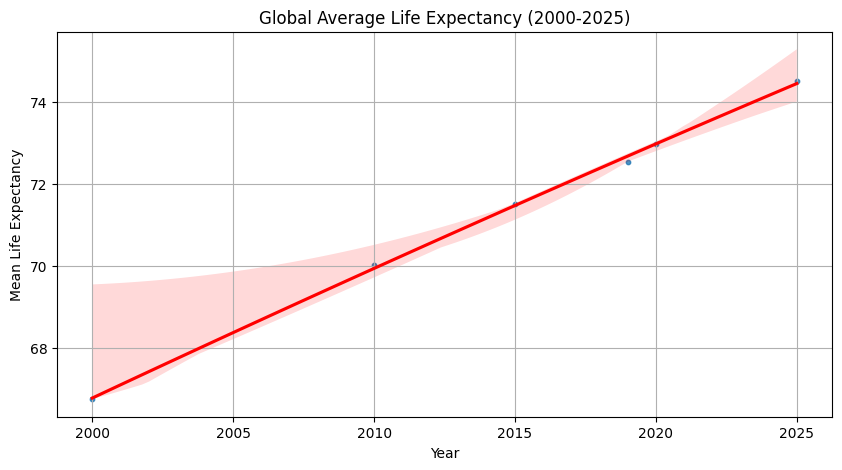

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Life_expectancy.csv"
df = pd.read_csv(file_path)

# Compute the mean life expectancy per year
df_mean = df.groupby("year")["life_expectancy"].mean().reset_index()

# Plot the trendline
plt.figure(figsize=(10, 5))
sns.regplot(x=df_mean["year"], y=df_mean["life_expectancy"], order=2, scatter_kws={'s': 10}, line_kws={'color': 'red'})

# Formatting
plt.title("Global Average Life Expectancy (2000-2025)")
plt.xlabel("Year")
plt.ylabel("Mean Life Expectancy")
plt.grid(True)

# Show the plot
plt.show()


In [17]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Load dataset
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Alcohol/total-alcohol-consumption-per-capita-litres-of-pure-alcohol.csv"
df = pd.read_csv(file_path)

# Ensure 'year' is an integer
df["year"] = df["year"].astype(int)

# Define the full range of years
full_years = np.arange(2000, 2026)  # From 2000 to 2025

# Function to fill missing years and apply Linear Regression
def fill_and_predict(group):
    iso = group["iso3"].iloc[0]  # Get the country ISO
    country_name = group["country"].iloc[0]  # Get the country name

    # Create a DataFrame with all years
    full_years_df = pd.DataFrame({"year": full_years})
    full_group = pd.merge(full_years_df, group, on="year", how="left")

    # Target column to predict
    col = "alcohol_in_units_per_capita"

    if full_group[col].isnull().any():  # Only process if there are missing values
        known_values = full_group[col].dropna().values
        known_years = full_group.loc[full_group[col].notnull(), "year"].values.reshape(-1, 1)

        if len(known_values) > 1:  # Ensure at least two data points exist
            model = LinearRegression()
            model.fit(known_years, known_values)

            # Predict missing values
            missing_mask = full_group[col].isnull()
            full_group.loc[missing_mask, col] = model.predict(full_group.loc[missing_mask, "year"].values.reshape(-1, 1))

    # Round values to 1 decimal place
    full_group[col] = full_group[col].round(1)

    # Add back the ISO3 and country name
    full_group["iso3"] = iso
    full_group["country"] = country_name
    return full_group

# Apply the function to each country (ISO3)
df_filled = df.groupby("iso3", group_keys=False).apply(fill_and_predict)

# Save the updated dataset
output_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Alcohol_consumption_filled.csv"
df_filled.to_csv(output_path, index=False)

print("All years added (2000-2025) and missing values imputed using linear regression. Values rounded to 1 decimal place. Saved to:", output_path)


All years added (2000-2025) and missing values imputed using linear regression. Values rounded to 1 decimal place. Saved to: /Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Alcohol_consumption_filled.csv


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_3098/2622283035.py:48: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_filled = df.groupby("iso3", group_keys=False).apply(fill_and_predict)


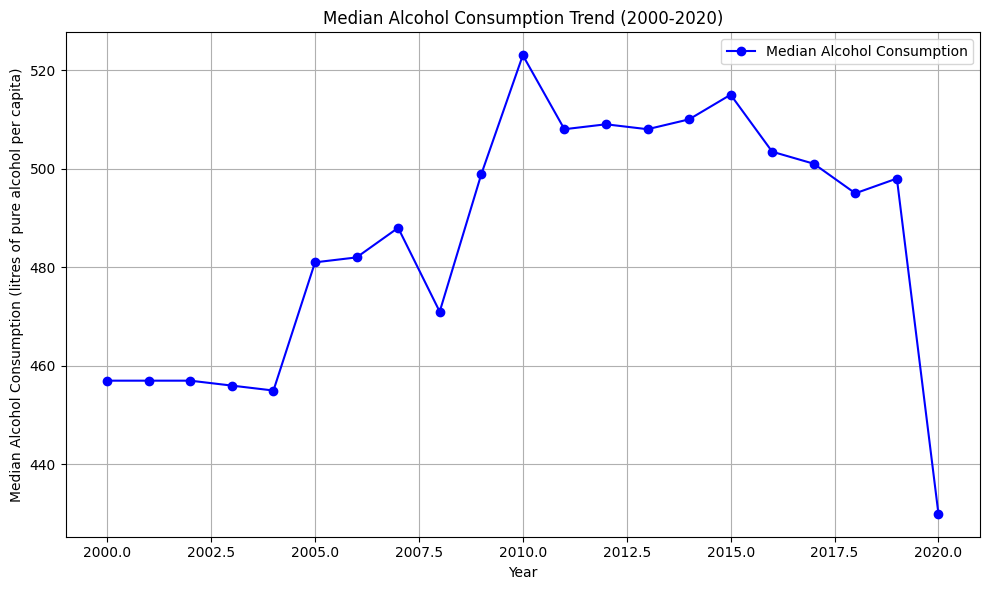

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset (replace this with your actual file path)
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Alcohol/total-alcohol-consumption-per-capita-litres-of-pure-alcohol.csv"
df = pd.read_csv(file_path)

# Ensure 'year' is an integer and 'alcohol_consumption' is a float
df['year'] = df['year'].astype(int)

# Group by year and calculate the median alcohol consumption across all countries
median_trend = df.groupby('year')['alcohol_in_units_per_capita'].median()

# Plot the median trendline
plt.figure(figsize=(10, 6))
plt.plot(median_trend.index, median_trend.values, marker='o', color='b', label='Median Alcohol Consumption')

# Add labels and title
plt.xlabel("Year")
plt.ylabel("Median Alcohol Consumption (litres of pure alcohol per capita)")
plt.title("Median Alcohol Consumption Trend (2000-2020)")
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()  # Ensure everything fits
plt.show()


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_3098/1880547228.py:31: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()  # Ensure everything fits


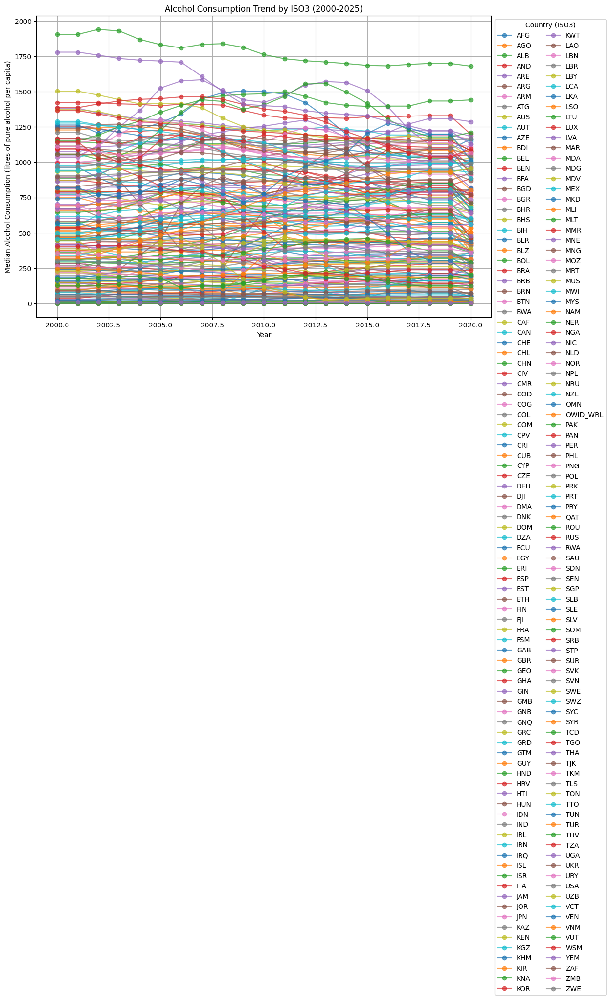

In [20]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset (replace this with your actual file path)
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Alcohol/total-alcohol-consumption-per-capita-litres-of-pure-alcohol.csv"
df = pd.read_csv(file_path)

# Ensure 'year' is an integer and 'alcohol_in_units_per_capita' is a float
df['year'] = df['year'].astype(int)

# Group by ISO3 and year, then calculate the median alcohol consumption
median_trend_by_iso = df.groupby(['iso3', 'year'])['alcohol_in_units_per_capita'].median().reset_index()

# Plot the trendline for each ISO country
plt.figure(figsize=(12, 8))

iso_countries = median_trend_by_iso['iso3'].unique()

for iso in iso_countries:
    country_data = median_trend_by_iso[median_trend_by_iso['iso3'] == iso]
    plt.plot(country_data['year'], country_data['alcohol_in_units_per_capita'], marker='o', label=iso, alpha=0.7)

# Add labels and title
plt.xlabel("Year")
plt.ylabel("Median Alcohol Consumption (litres of pure alcohol per capita)")
plt.title("Alcohol Consumption Trend by ISO3 (2000-2025)")
plt.legend(title='Country (ISO3)', loc="upper left", bbox_to_anchor=(1, 1), ncol=2)  # Legend outside the plot
plt.grid(True)

# Show the plot
plt.tight_layout()  # Ensure everything fits
plt.show()


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_3098/3067608096.py:50: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_filled = df.groupby('iso3', group_keys=False).apply(fill_missing_years)
/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_3098/3067608096.py:69: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()  # Ensure everything fits


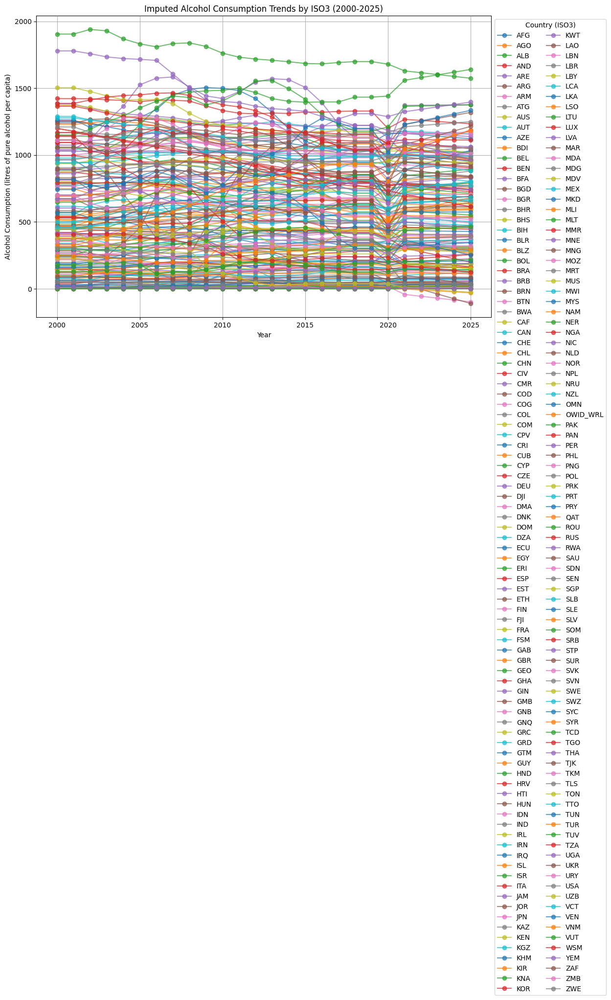

Missing years imputed until 2025 based on the ISO3 trend. Saved to: /Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Alcohol_consumption_filled_missing.csv


In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Ensure 'year' is an integer and 'alcohol_in_units_per_capita' is a float
df['year'] = df['year'].astype(int)

# Define the full range of years (2000-2025)
full_years = np.arange(2000, 2026)

# Function to apply Linear Regression and only impute missing years
def fill_missing_years(group):
    iso = group['iso3'].iloc[0]  # Get the country ISO

    # Identify the missing years for each country
    existing_years = group['year'].values
    missing_years = np.setdiff1d(full_years, existing_years)

    # If there are missing years, apply Linear Regression
    if len(missing_years) > 0:
        # Only use the years with known alcohol consumption values
        known_values = group['alcohol_in_units_per_capita'].dropna().values
        known_years = group.loc[group['alcohol_in_units_per_capita'].notna(), 'year'].values.reshape(-1, 1)

        # Apply Linear Regression if there are at least two known values
        if len(known_values) > 1:
            model = LinearRegression()
            model.fit(known_years, known_values)

            # Predict the alcohol consumption for the missing years
            predicted_values = model.predict(missing_years.reshape(-1, 1))

            # Create a DataFrame for the missing years with predicted values
            predicted_df = pd.DataFrame({
                'iso3': iso,
                'year': missing_years,
                'alcohol_in_units_per_capita': predicted_values
            })

            # Round the predicted values to 1 decimal place
            predicted_df['alcohol_in_units_per_capita'] = predicted_df['alcohol_in_units_per_capita'].round(1)

            # Append the predicted values to the original group (keeping the existing data intact)
            group = pd.concat([group, predicted_df], ignore_index=True)

    return group

# Apply the function to each ISO3 group
df_filled = df.groupby('iso3', group_keys=False).apply(fill_missing_years)

# Plot the trendlines for each ISO country with imputed values for the missing years
plt.figure(figsize=(12, 8))

iso_countries = df_filled['iso3'].unique()

for iso in iso_countries:
    country_data = df_filled[df_filled['iso3'] == iso]
    plt.plot(country_data['year'], country_data['alcohol_in_units_per_capita'], marker='o', label=iso, alpha=0.7)

# Add labels and title
plt.xlabel("Year")
plt.ylabel("Alcohol Consumption (litres of pure alcohol per capita)")
plt.title("Imputed Alcohol Consumption Trends by ISO3 (2000-2025)")
plt.legend(title='Country (ISO3)', loc="upper left", bbox_to_anchor=(1, 1), ncol=2)  # Legend outside the plot
plt.grid(True)

# Show the plot
plt.tight_layout()  # Ensure everything fits
plt.show()

# Save the updated dataset
output_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Alcohol_consumption_filled_missing.csv"
df_filled.to_csv(output_path, index=False)

print("Missing years imputed until 2025 based on the ISO3 trend. Saved to:", output_path)


In [29]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Load the obesity data
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/BMI/BMI_transformed_1.csv"
df = pd.read_csv(file_path, delimiter=';')

# Ensure 'year' is an integer
df['year'] = df['year'].astype(int)

# Define the full range of years (2000-2025)
full_years = np.arange(2000, 2026)

# Function to apply Linear Regression and only impute missing years for all columns
def fill_missing_years(group):
    iso = group['iso3'].iloc[0]  # Get the country ISO

    # Identify the missing years for each country
    existing_years = group['year'].values
    missing_years = np.setdiff1d(full_years, existing_years)

    # Columns to predict
    target_columns = [
        'obesity_procent', 
        'obesity_procent_female', 
        'obesity_procent_male'
    ]
    
    # Apply Linear Regression for each column
    for col in target_columns:
        if group[col].isnull().any():  # If there are missing values in the column
            known_values = group[col].dropna().values
            known_years = group.loc[group[col].notna(), 'year'].values.reshape(-1, 1)

            # Apply Linear Regression if there are at least two known values
            if len(known_values) > 1:
                model = LinearRegression()
                model.fit(known_years, known_values)

                # Predict the values for the missing years
                predicted_values = model.predict(missing_years.reshape(-1, 1))

                # Create a DataFrame for the missing years with predicted values
                predicted_df = pd.DataFrame({
                    'iso3': iso,
                    'year': missing_years,
                    col: predicted_values
                })

                # Round the predicted values to 0 decimal places
                predicted_df[col] = predicted_df[col].round(0)

                # Append the predicted values to the original group (keeping the existing data intact)
                group = pd.concat([group, predicted_df], ignore_index=True)

    return group

# Apply the function to each ISO3 group
df_filled = df.groupby('iso3', group_keys=False).apply(fill_missing_years)

# Save the updated dataset with the imputed values
output_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/BMI/BMI_filled_missing_years_0_decimal.csv"
df_filled.to_csv(output_path, index=False)

print("Missing years imputed until 2025 based on the ISO3 trend for all columns, rounded to 0 decimal places. Saved to:", output_path)


Missing years imputed until 2025 based on the ISO3 trend for all columns, rounded to 0 decimal places. Saved to: /Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/BMI/BMI_filled_missing_years_0_decimal.csv


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_3098/2241397387.py:60: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_filled = df.groupby('iso3', group_keys=False).apply(fill_missing_years)


In [37]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Load the dataset
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/BMI/BMI_transformed_1.csv"
df = pd.read_csv(file_path, delimiter=';')

# Ensure 'year' is an integer
df['year'] = df['year'].astype(int)

# Define the full range of years (2000-2025)
full_years = np.arange(2000, 2026)

# Step 1: Create New Rows for Missing Years
def create_new_rows(group):
    iso = group['iso3'].iloc[0]  # Get the country ISO
    country_name = group['country'].iloc[0]  # Get the country name
    continent = group['continent'].iloc[0]  # Get the continent

    # Identify the existing years for the country
    existing_years = group['year'].values
    missing_years = np.setdiff1d(full_years, existing_years)  # Find missing years

    # Create new rows for the missing years
    new_rows = []
    for missing_year in missing_years:
        new_row = {
            'continent_iso3': group['continent_iso3'].iloc[0],
            'continent': continent,
            'iso3': iso,
            'country': country_name,
            'year': missing_year,
            'obesity_procent': np.nan,  # Placeholder for missing data
            'obesity_procent_female': np.nan,  # Placeholder for missing data
            'obesity_procent_male': np.nan   # Placeholder for missing data
        }
        new_rows.append(new_row)

    # Create a DataFrame for the new rows
    missing_df = pd.DataFrame(new_rows)

    return missing_df

# Apply the function to each ISO3 group and get the new rows
new_rows_df = df.groupby('iso3', group_keys=False).apply(create_new_rows)

# Step 2: Impute Missing Values Using Linear Regression
def impute_using_lr(group):
    iso = group['iso3'].iloc[0]  # Get the country ISO
    country_name = group['country'].iloc[0]  # Get the country name

    # Columns to predict
    target_columns = ['obesity_procent', 'obesity_procent_female', 'obesity_procent_male']

    # Perform linear regression for each column
    for col in target_columns:
        # Extract rows where the column is not NaN
        known_values = group[col].dropna()
        known_years = group.loc[group[col].notnull(), 'year'].values.reshape(-1, 1)

        if len(known_values) > 1:  # Ensure we have at least 2 data points
            model = LinearRegression()
            model.fit(known_years, known_values)

            # Predict missing values
            missing_mask = group[col].isnull()
            group.loc[missing_mask, col] = model.predict(group.loc[missing_mask, 'year'].values.reshape(-1, 1))

    # Round values to 2 decimal places
    group[target_columns] = group[target_columns].round(2)

    return group

# Step 3: Combine Original Data with New Rows and Apply Linear Regression
# Concatenate the original data with the new rows and apply imputation
df_combined = pd.concat([df, new_rows_df])

# Apply linear regression to fill missing values
df_filled = df_combined.groupby('iso3', group_keys=False).apply(impute_using_lr)

# Save the final dataset with imputed values
output_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/BMI/BMI_filled_2000_2025.csv"
df_filled.to_csv(output_path, index=False)

print(f"New rows created, missing values imputed, and saved to: {output_path}")


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_3098/373978069.py:46: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  new_rows_df = df.groupby('iso3', group_keys=False).apply(create_new_rows)


New rows created, missing values imputed, and saved to: /Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/BMI/BMI_filled_2000_2025.csv


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_3098/373978069.py:80: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_filled = df_combined.groupby('iso3', group_keys=False).apply(impute_using_lr)


/Users/noachmeged/Documents/Ironhack/Project-Amazon/Flask/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


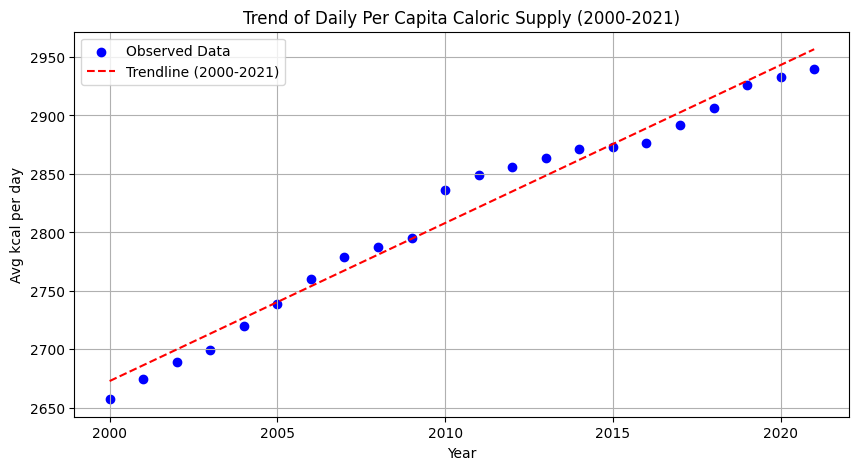

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Load the dataset
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/daily-per-capita-caloric-supply/daily-per-capita-caloric-supply.csv"
df = pd.read_csv(file_path, delimiter=";")

# Filter data for years 2000-2021
df_filtered = df[(df['year'] >= 2000) & (df['year'] <= 2021)]

# Calculate average kcal_per_day per year
avg_kcal_per_year = df_filtered.groupby('year')['kcal_per_day'].mean().reset_index()

# Linear Regression Model
X = avg_kcal_per_year[['year']]
y = avg_kcal_per_year['kcal_per_day']
model = LinearRegression()
model.fit(X, y)

# Predictions for the trendline
X_pred = np.array(range(2000, 2022)).reshape(-1, 1)
y_pred = model.predict(X_pred)

# Plot the data and trendline
plt.figure(figsize=(10, 5))
plt.scatter(avg_kcal_per_year['year'], avg_kcal_per_year['kcal_per_day'], color='blue', label="Observed Data")
plt.plot(X_pred.flatten(), y_pred, color='red', linestyle="--", label="Trendline (2000-2021)")

# Labels and title
plt.xlabel("Year")
plt.ylabel("Avg kcal per day")
plt.title("Trend of Daily Per Capita Caloric Supply (2000-2021)")
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


In [13]:
# Compute year-over-year percentage change per country
df_filtered['pct_change'] = df_filtered.groupby('iso3')['kcal_per_day'].pct_change() * 100

# Separate increases and decreases
increase_rates = df_filtered[df_filtered['pct_change'] > 0]['pct_change']
decrease_rates = df_filtered[df_filtered['pct_change'] < 0]['pct_change']

# Compute medians
median_increase = increase_rates.median()
median_decrease = decrease_rates.median()

median_increase, median_decrease


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_1265/3593753678.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['pct_change'] = df_filtered.groupby('iso3')['kcal_per_day'].pct_change() * 100


(np.float64(1.1839527770433511), np.float64(-0.7893843251900456))

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

def forecast_kcal_by_trend(df):
    df_filtered = df[df['year'] <= 2021].copy()
    df_filtered.loc[:, 'pct_change'] = df_filtered.groupby('iso3')['kcal_per_day'].pct_change() * 100
    
    predictions = []
    for iso3, country_data in df_filtered.groupby('iso3'):
        country_data = country_data.dropna(subset=['pct_change'])
        if not country_data[country_data['year'] == 2021].empty:
            last_kcal = country_data[country_data['year'] == 2021]['kcal_per_day'].values[0]
            last_year = 2021
            years_to_predict = [2022, 2023, 2024, 2025]
            
            model = LinearRegression()
            X_train = country_data[['year']]
            y_train = country_data['pct_change']
            model.fit(X_train, y_train)
            
            X_pred = pd.DataFrame({'year': years_to_predict})
            pct_change_predictions = model.predict(X_pred)
            
            for year, pct_change in zip(years_to_predict, pct_change_predictions):
                last_kcal *= (1 + pct_change / 100)
                predictions.append({'iso3': iso3, 'year': year, 'kcal_per_day': last_kcal})
    
    df = pd.concat([df, pd.DataFrame(predictions)], ignore_index=True)
    return df

def create_new_rows(group):
    last_row = group[group['year'] == 2021]
    if not last_row.empty:
        new_rows = []
        last_kcal = last_row['kcal_per_day'].values[0]
        for year in range(2022, 2026):
            last_kcal *= 1.01  # Assuming a 1% annual increase
            new_rows.append({'iso3': group['iso3'].iloc[0], 'year': year, 'kcal_per_day': last_kcal})
        return pd.DataFrame(new_rows)
    return pd.DataFrame()

def process_data(df):
    df = forecast_kcal_by_trend(df)
    df = pd.concat([df, df.groupby('iso3', group_keys=False).apply(create_new_rows)], ignore_index=True)
    return df
  

# Assuming df_forecasted is your final DataFrame
df_forecasted.to_csv("/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/daily-per-capita-caloric-supply/daily-per-capita-caloric-supply_imputed.csv", index=False)

print("CSV file successfully saved!")
df.head

CSV file successfully saved!


,iso3,year,HDI,HDI_rank,country
0,AFG,1990,0.273000,138.0,Afghanistan
1,AFG,1991,0.284071,NaN,NaN
2,AFG,1992,0.291304,NaN,NaN
3,AFG,1993,0.298537,NaN,NaN
4,AFG,1994,0.305770,NaN,NaN


In [137]:
import pandas as pd

# Load the CSV file with the correct delimiter
df = pd.read_csv('/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/HDI/HDI_clean.csv', delimiter=';')

# Display the first few rows (default is 5)
print(df.head())


   HDI_rank        country  year    HDI iso3
0         1  United States  1990  0,872  USA
1         2      Australia  1990  0,865  AUS
2         3         Canada  1990  0,860  CAN
3         4    Switzerland  1990  0,851  CHE
4         5    Netherlands  1990  0,847  NLD


In [138]:
# Remove the 'HDI_rank' column
df = df.drop('HDI_rank', axis=1)

# Display the first few rows to confirm
print(df.head())


         country  year    HDI iso3
0  United States  1990  0,872  USA
1      Australia  1990  0,865  AUS
2         Canada  1990  0,860  CAN
3    Switzerland  1990  0,851  CHE
4    Netherlands  1990  0,847  NLD


In [139]:
df['HDI'] = df['HDI'].str.replace(',', '.')

# Zet de 'HDI' kolom om naar numerieke waarden
df['HDI'] = pd.to_numeric(df['HDI'], errors='coerce')

# Vermenigvuldig met 1000 om de getallen naar 1000e eenheden om te zetten en zet het om naar integer
df['HDI'] = (df['HDI'] * 1000).astype('Int64')  # 'Int64' voor behoud van NA's

# Laat de eerste paar regels zien
print(df.head())

df.to_csv('/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/HDI/HDI_updated.csv', index=False)


         country  year  HDI iso3
0  United States  1990  872  USA
1      Australia  1990  865  AUS
2         Canada  1990  860  CAN
3    Switzerland  1990  851  CHE
4    Netherlands  1990  847  NLD


In [141]:
import pandas as pd
from sklearn.linear_model import LinearRegression
import numpy as np

# Laad de dataset
file_path = '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/HDI/HDI_with_imputed_values.csv'
df = pd.read_csv(file_path, delimiter=',')

# Converteer HDI naar numeriek (vervang komma's door punten)
df['HDI'] = df['HDI'].astype(str).str.replace(',', '.')
df['HDI'] = pd.to_numeric(df['HDI'], errors='coerce')

# Zorg ervoor dat er geen 0's of NaN's in de HDI-kolom staan
df = df[df['HDI'].notna() & (df['HDI'] != 0)]

# Maak een lijst van jaren die we willen voorspellen
years_to_predict = list(range(1990, 2021))

# Lijst om voorspelde waarden op te slaan
new_rows = []

# Voor elke iso3 (landcode), passen we de lineaire regressie toe om de ontbrekende jaren in te vullen
for iso in df['iso3'].unique():
    country_data = df[df['iso3'] == iso]
    
    # Zorg ervoor dat we de juiste landnaam kiezen
    country_name = country_data['country'].mode()[0]  # Kies de meest voorkomende naam
    
    # Gegevens die niet missen voor HDI
    known_data = country_data.dropna(subset=['HDI'])
    
    if len(known_data) > 1:  # Zorg ervoor dat er genoeg gegevens zijn voor regressie
        X = known_data['year'].values.reshape(-1, 1)  # Jaren als feature
        y = known_data['HDI'].values  # HDI als target
        
        # Fit het model op de beschikbare gegevens
        model = LinearRegression()
        model.fit(X, y)
        
        # Voorspel de HDI voor de ontbrekende jaren tussen 1990 en 2020
        for year in years_to_predict:
            if year not in country_data['year'].values:
                # Voorspel voor de ontbrekende jaren
                predicted_value = model.predict(np.array([[year]]))[0]
                
                # **Round to integer**
                predicted_value = round(predicted_value)  # Round to the nearest integer
                
                # Maak een nieuwe rij met het voorspelde waarde
                new_rows.append({
                    'country': country_name,  # Correcte landnaam
                    'year': year,
                    'HDI': predicted_value,  # **No decimals**
                    'iso3': iso
                })

# Voeg de voorspelde rijen toe aan de DataFrame
predicted_df = pd.concat([df, pd.DataFrame(new_rows)], ignore_index=True)

# **Convert HDI to integer**
predicted_df['HDI'] = predicted_df['HDI'].astype(int)

# Sorteer op iso3 en jaar om de volgorde te behouden
predicted_df = predicted_df.sort_values(by=['iso3', 'year'])

# Sla de bijgewerkte DataFrame op in een nieuwe CSV-bestand
output_path = '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/HDI/HDI_final.csv'
predicted_df.to_csv(output_path, index=False)

print(f"Bestand succesvol opgeslagen als '{output_path}'")


Bestand succesvol opgeslagen als '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/HDI/HDI_final.csv'


In [142]:
import pandas as pd
from sklearn.linear_model import LinearRegression
import numpy as np

# Laad de dataset
file_path = '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/HDI/HDI_final.csv'
df = pd.read_csv(file_path)

# Rank HDI per jaar (1 = hoogste HDI, oplopende ranking)
df['HDI_rank'] = df.groupby('year')['HDI'].rank(method='dense', ascending=False).astype(int)

# Sorteer op jaar en HDI-rank om de volgorde te behouden
df = df.sort_values(by=['year', 'HDI_rank'])

# Sla de bijgewerkte DataFrame op in een nieuwe CSV-bestand
output_path = '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/HDI/HDI_ranked.csv'
df.to_csv(output_path, index=False)

print(f"Bestand succesvol opgeslagen als '{output_path}'")


Bestand succesvol opgeslagen als '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/HDI/HDI_ranked.csv'


In [146]:
import pandas as pd
from sklearn.linear_model import LinearRegression
import numpy as np

# Laad de dataset
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Salt/salt_intake_clean.csv"
df = pd.read_csv(file_path, delimiter=';')

# Lijst met de jaren die we willen invullen
years_to_predict = list(range(2000, 2021))

# Nieuwe DataFrame om voorspelde waarden op te slaan
predicted_df = df.copy()

# Voorspel per land (iso3) voor elk type zoutinname
for iso in df['iso3'].unique():
    country_data = df[df['iso3'] == iso]
    
    known_data = country_data.dropna(subset=['salt_intake_pd_median'])

    if len(known_data) > 1:  # Alleen voorspellen als er genoeg data is
        X = known_data['year'].values.reshape(-1, 1)
        
        # Maak modellen voor elke zoutkolom
        y_median = known_data['salt_intake_pd_median'].values
        y_female = known_data['salt_intake_pd_median_female'].values
        y_male = known_data['salt_intake_pd_median_male'].values
        
        model_median = LinearRegression().fit(X, y_median)
        model_female = LinearRegression().fit(X, y_female)
        model_male = LinearRegression().fit(X, y_male)
        
        # Voorspel de ontbrekende jaren
        for year in years_to_predict:
            if year not in country_data['year'].values:
                predicted_row = pd.DataFrame({
                    'iso3': [iso],
                    'year': [year],
                    'salt_intake_pd_median': round(model_median.predict(np.array([[year]]))[0], 2),
                    'salt_intake_pd_median_female': round(model_female.predict(np.array([[year]]))[0], 2),
                    'salt_intake_pd_median_male': round(model_male.predict(np.array([[year]]))[0], 2)
                })
                
                predicted_df = pd.concat([predicted_df, predicted_row], ignore_index=True)

# Sorteer de gegevens per iso3 en jaar
predicted_df = predicted_df.sort_values(by=['iso3', 'year'])

# Sla het nieuwe bestand op
output_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Salt/salt_intake_filled.csv"
predicted_df.to_csv(output_path, index=False)

print(f"Bestand succesvol opgeslagen als '{output_path}'")


Bestand succesvol opgeslagen als '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Salt/salt_intake_filled.csv'


In [161]:
import pandas as pd

file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/smoking_data_clean.csv"

# Load the data
df = pd.read_csv(file_path, delimiter=';')

# Replace commas with dots and convert to float
df['smoking_procent'] = df['smoking_procent'].str.replace(',', '.').astype(float)

print(df.dtypes)  # Check that the column is now a float
print(df.head())  # Display the first rows to confirm


continent           object
country             object
iso3                object
year                 int64
smoking_procent    float64
dtype: object
        continent   country iso3  year  smoking_procent
0  African Region  Zimbabwe  ZWE  2000             17.8
1  African Region  Zimbabwe  ZWE  2005             15.3
2  African Region  Zimbabwe  ZWE  2010             13.2
3  African Region  Zimbabwe  ZWE  2015             11.5
4  African Region  Zimbabwe  ZWE  2020             10.1


In [2]:
import pandas as pd
from sklearn.linear_model import LinearRegression
import numpy as np

# Load the dataset
file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/smoking_data_clean.csv"
df = pd.read_csv(file_path, delimiter=';')

# Replace commas with periods in the 'smoking_procent' column
df['smoking_procent'] = df['smoking_procent'].str.replace(',', '.')
df['smoking_procent'] = pd.to_numeric(df['smoking_procent'], errors='coerce')

# Define the range of years to predict
years_to_predict = list(range(2000, 2026))

# Create a copy to store predictions
predicted_df = df.copy()

# Loop through each country (iso3) and apply linear regression
for iso in df['iso3'].unique():
    country_data = df[df['iso3'] == iso]
    
    # Keep only known data
    known_data = country_data.dropna(subset=['smoking_procent'])

    if len(known_data) > 1:  # Ensure there is enough data for regression
        X = known_data['year'].values.reshape(-1, 1)
        y = known_data['smoking_procent'].values
        
        # Train the model
        model = LinearRegression().fit(X, y)
        
        # Predict for missing years
        for year in years_to_predict:
            if year not in country_data['year'].values:
                predicted_value = model.predict(np.array([[year]]))[0]
                
                # Create a new row with predicted value
                predicted_row = pd.DataFrame({
                    'continent': [country_data['continent'].iloc[0]],  
                    'country': [country_data['country'].iloc[0]],  
                    'iso3': [iso],
                    'year': [year],
                    'smoking_procent': [round(predicted_value, 1)]  # Round to 1 decimal place
                })
                
                # Add predicted row to the dataset
                predicted_df = pd.concat([predicted_df, predicted_row], ignore_index=True)

# Sort data by iso3 and year
predicted_df = predicted_df.sort_values(by=['iso3', 'year'])

# Save to CSV
output_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/smoking_data_filled.csv"
predicted_df.to_csv(output_path, index=False)

print(f"Bestand succesvol opgeslagen als '{output_path}' ✅")


Bestand succesvol opgeslagen als '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/smoking_data_filled.csv' ✅


In [152]:
import csv

file_path = "/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/Smoking/smoking_data_clean.csv"

with open(file_path, 'r', newline='', encoding='utf-8') as file:
    sample = file.read(1024)  # Read a small sample of the file
    sniffer = csv.Sniffer()
    delimiter = sniffer.sniff(sample).delimiter

print(f"The detected delimiter is: '{delimiter}'")


The detected delimiter is: ';'


In [53]:
import pandas as pd

# Load your dataset
file_path = '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/HDI/HDI_imputed.csv'  # Change this to the actual file path
df = pd.read_csv(file_path, delimiter=';')

# Check if HDI is greater than 1 and divide by 1000 if it is
df['HDI'] = df['HDI'].apply(lambda x: x / 1000 if x > 1 else x)

# Fill missing values in the 'HDI_rank' column by forward filling

# Round HDI to 6 decimal places
df['HDI'] = df['HDI'].round(3)

# Save the modified DataFrame back to a CSV with a semicolon delimiter
df.to_csv('/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/HDI/HDI_imputed.csv', sep=';', index=False)

# Check the first few rows to confirm
print(df.head())


  iso3  year    HDI  HDI_rank      country
0  AFG  1990  0.273     138.0  Afghanistan
1  AFG  1991  0.284     138.0          NaN
2  AFG  1992  0.291     138.0          NaN
3  AFG  1993  0.299     138.0          NaN
4  AFG  1994  0.306     138.0          NaN


In [2]:
import mysql.connector
import getpass  # Hides password input

# Get user input for password
db_password = getpass.getpass("Enter MySQL password: ")

# Connect to MySQL
conn = mysql.connector.connect(
    
    host="localhost",
    user="root",
    password=db_password,  # Use the inputted password
    database="final_project",
    port=3306
)

# Create a cursor object to interact with the database
cursor = conn.cursor()

# Test connection by listing tables
cursor.execute("SHOW TABLES;")
for table in cursor.fetchall():
    print(table)

# Close the connection
cursor.close()
conn.close()


('alcohol_consumption',)
('calories_per_day',)
('gdp_per_year',)
('hdi',)
('life_expectancy',)
('obesity',)
('physical_inactivity',)
('salt_intake_clean',)
('smoking_data',)
('vegetable_fruit_consumption',)


In [4]:
import mysql.connector
import pandas as pd
import getpass
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

# Function to create a connection to MySQL
def create_connection():
    db_password = getpass.getpass("Enter MySQL password: ")
    try:
        conn = mysql.connector.connect(
            host="localhost",
            user="root",
            password=db_password,
            database="final_project",  # Replace with your database name
            port=3306  # Default MySQL port
        )
        return conn
    except mysql.connector.Error as err:
        print(f"Error: {err}")
        return None

# Function to execute queries and fetch data into a pandas DataFrame
def run_query(query):
    try:
        conn = create_connection()
        if conn is None:
            return None
        
        cursor = conn.cursor()
        cursor.execute(query)
        columns = [column[0] for column in cursor.description]  # Get column names
        rows = cursor.fetchall()
        
        df = pd.DataFrame(rows, columns=columns)
        
        cursor.close()  # Close cursor after usage
        conn.close()  # Close connection after usage
        
        return df
    except mysql.connector.Error as err:
        print(f"Error executing query: {err}")
        return None

# SQL query to fetch the data
query = """
SELECT 
    le.life_expectancy_primary_key, 
    le.country AS life_expectancy_country,
    le.iso3 AS life_expectancy_iso3, 
    le.year, 
    le.life_expectancy, 
    le.life_expectancy_male, 
    le.life_expectancy_female, 
    le.life_expectancy_60, 
    le.life_expectancy_60_male, 
    le.life_expectancy_60_female, 
    ac.alcohol_in_units_per_capita,
    c.kcal_per_day,
    o.obesity_procent,
    o.obesity_procent_female,
    o.obesity_procent_male,
    vfc.vegetables_kilograms_per_year,
    vfc.fruits_kilograms_per_year,
    gdp.gdp_usd_p_year,
    hdi.HDI_rank,
    hdi.HDI,
    pi.inactivity_procent,
    pi.inactivity_procent_female,
    pi.inactivity_procent_male,
    sic.salt_intake_pd_median,
    sic.salt_intake_pd_median_female,
    sic.salt_intake_pd_median_male,
    sm.smoking_procent
FROM life_expectancy AS le
JOIN alcohol_consumption AS ac
    ON le.iso3 = ac.iso3 
    AND le.year = ac.year
JOIN calories_per_day AS c
    ON le.iso3 = c.iso3
    AND le.year = c.year
JOIN obesity AS o
    ON le.iso3 = o.iso3
    AND le.year = o.year
JOIN vegetable_fruit_consumption AS vfc
    ON le.iso3 = vfc.iso3
    AND le.year = vfc.year
JOIN gdp_per_year AS gdp
    ON le.iso3 = gdp.iso3
    AND le.year = gdp.year
JOIN hdi AS hdi
    ON le.iso3 = hdi.iso3
    AND le.year = hdi.year
JOIN physical_inactivity AS pi
    ON le.iso3 = pi.iso3
    AND le.year = pi.year
JOIN salt_intake_clean AS sic
    ON le.iso3 = sic.iso3
    AND le.year = sic.year
JOIN smoking_data AS sm
    ON le.iso3 = sm.iso3
    AND le.year = sm.year
ORDER BY le.iso3 ASC, le.year ASC;
"""

# Fetch the data into a DataFrame
df = run_query(query)

# Check if data is fetched correctly
if df is not None:
    print(df.head())  # Show the first few rows to check the data
else:
    print("Failed to fetch data")


  life_expectancy_primary_key life_expectancy_country life_expectancy_iso3  \
0                    AFG_2000             Afghanistan                  AFG   
1                    AFG_2001             Afghanistan                  AFG   
2                    AFG_2002             Afghanistan                  AFG   
3                    AFG_2003             Afghanistan                  AFG   
4                    AFG_2004             Afghanistan                  AFG   

   year  life_expectancy  life_expectancy_male  life_expectancy_female  \
0  2000             55.0                  54.6                    55.4   
1  2001             55.6                  55.2                    56.1   
2  2002             56.1                  55.6                    56.5   
3  2003             56.5                  56.1                    56.9   
4  2004             56.9                  56.5                    57.4   

   life_expectancy_60  life_expectancy_60_male  life_expectancy_60_female  \
0        

In [8]:
conn = create_connection()

cursor = conn.cursor()


query = """
SELECT 
    le.life_expectancy_primary_key,   -- Added life_expectancy_primary_key
    le.country AS life_expectancy_country,
    le.iso3 AS life_expectancy_iso3, 
    le.year, 
    le.life_expectancy, 
    le.life_expectancy_male, 
    le.life_expectancy_female, 
    le.life_expectancy_60, 
    le.life_expectancy_60_male, 
    le.life_expectancy_60_female, 
    ac.alcohol_in_units_per_capita,   -- Alcohol consumption per capita (units)
    c.kcal_per_day,                   -- Calories consumed per day
    o.obesity_procent,                -- Obesity percentage
    o.obesity_procent_female,         -- Obesity percentage for females
    o.obesity_procent_male,           -- Obesity percentage for males
    vfc.vegetables_kilograms_per_year,-- Vegetable consumption in kilograms per year
    vfc.fruits_kilograms_per_year,    -- Fruit consumption in kilograms per year
    gdp.gdp_usd_p_year,               -- GDP in USD per year
    hdi.HDI_rank,                     -- HDI rank of the country
    hdi.HDI,                          -- HDI value
    pi.inactivity_procent,            -- Physical inactivity percentage
    pi.inactivity_procent_female,     -- Physical inactivity percentage for females
    pi.inactivity_procent_male,       -- Physical inactivity percentage for males
    sic.salt_intake_pd_median,        -- Salt intake per day median
    sic.salt_intake_pd_median_female, -- Salt intake per day median for females
    sic.salt_intake_pd_median_male,   -- Salt intake per day median for males
    sm.smoking_procent                -- Smoking percentage
FROM life_expectancy AS le
-- Joining with alcohol_consumption to get alcohol consumption data per capita
JOIN alcohol_consumption AS ac
    ON le.iso3 = ac.iso3 
    AND le.year = ac.year
-- Joining with calories_per_day to get daily calorie consumption data
JOIN calories_per_day AS c
    ON le.iso3 = c.iso3
    AND le.year = c.year
-- Joining with obesity to get obesity percentage
JOIN obesity AS o
    ON le.iso3 = o.iso3
    AND le.year = o.year
-- Joining with vegetable_fruit_consumption to get vegetable and fruit consumption data
JOIN vegetable_fruit_consumption AS vfc
    ON le.iso3 = vfc.iso3
    AND le.year = vfc.year
-- Joining with gdp_per_year to get GDP data
JOIN gdp_per_year AS gdp
    ON le.iso3 = gdp.iso3
    AND le.year = gdp.year
-- Joining with hdi to get HDI data
JOIN hdi AS hdi
    ON le.iso3 = hdi.iso3
    AND le.year = hdi.year
-- Joining with physical_inactivity to get inactivity data
JOIN physical_inactivity AS pi
    ON le.iso3 = pi.iso3
    AND le.year = pi.year
-- Joining with salt_intake_clean to get salt intake data
JOIN salt_intake_clean AS sic
    ON le.iso3 = sic.iso3
    AND le.year = sic.year
-- Joining with smoking_data to get smoking percentage data
JOIN smoking_data AS sm
    ON le.iso3 = sm.iso3
    AND le.year = sm.year
ORDER BY le.iso3 ASC, le.year ASC;
"""

# Function to execute queries
def run_query(query):
    cursor.execute(query)
    rows = cursor.fetchall()
    return rows

# Run the query
result = run_query(query)

# Print the results
for row in result:
    print(row)

('AFG_2000', 'Afghanistan', 'AFG', 2000, 55.0, 54.6, 55.4, 13.9, 13.6, 14.2, 0.3, 1886.357, 4.25, 4.72, 3.75, 30.919395, 26.071774, 308.318269746638, 155, 335, 22.21, 28.87, 15.11, 2.97, 2.86, 2.95, 51.2)
('AFG_2001', 'Afghanistan', 'AFG', 2001, 55.6, 55.2, 56.1, 14.2, 13.9, 14.4, 0.3, 1883.395, 4.6, 5.12, 4.04, 36.73542, 30.24058, 277.118051443941, 160, 356, 22.55, 29.4, 15.25, 2.98, 2.86, 2.97, 48.3)
('AFG_2002', 'Afghanistan', 'AFG', 2002, 56.1, 55.6, 56.5, 14.2, 14.0, 14.5, 0.7000000000000001, 1930.58, 4.97, 5.54, 4.35, 28.535791, 27.161337, 338.139973643387, 154, 364, 22.91, 29.97, 15.4, 2.98, 2.86, 2.97, 47.2)
('AFG_2003', 'Afghanistan', 'AFG', 2003, 56.5, 56.1, 56.9, 14.3, 14.1, 14.5, 1.6, 1931.3407, 5.37, 6.0, 4.69, 35.554226, 21.293747, 346.071627096223, 154, 371, 23.29, 30.56, 15.55, 2.99, 2.86, 2.97, 46.2)
('AFG_2004', 'Afghanistan', 'AFG', 2004, 56.9, 56.5, 57.4, 14.4, 14.2, 14.6, 2.1, 2005.8702, 5.79, 6.49, 5.04, 26.86051, 22.037039, 338.637273888197, 149, 378, 23.68, 31.1

In [193]:
import pandas as pd

# Load the CSV file
file_path = '/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/LE_join.csv'
df = pd.read_csv(file_path, delimiter=';')

# Define kcal_per_day values for Africa (2000-2025)
africa_kcal_map = {
    2000: 2405.397, 2001: 2426.624, 2002: 2438.8184, 2003: 2443.792, 2004: 2455.2612,
    2005: 2485.3298, 2006: 2503.2144, 2007: 2504.659, 2008: 2519.8955, 2009: 2526.4946,
    2010: 2570.7744, 2011: 2575.3567, 2012: 2581.1523, 2013: 2580.6047, 2014: 2585.195,
    2015: 2578.2583, 2016: 2564.28, 2017: 2572.1155, 2018: 2575.0974, 2019: 2578.2585,
    2020: 2579.5566, 2021: 2573.0354, 2022: 2624.851883, 2023: 2633.245443, 
    2024: 2641.639004, 2025: 2650.032564
}

# Define kcal_per_day values for Asia (2000-2021)
asia_kcal_map = {
    2000: 2578.5212, 2001: 2562.0452, 2002: 2552.1987, 2003: 2556.279, 2004: 2564.4426,
    2005: 2576.0498, 2006: 2597.5198, 2007: 2638.34, 2008: 2662.4165, 2009: 2668.6836,
    2010: 2699.5613, 2011: 2728.6948, 2012: 2741.9146, 2013: 2752.8438, 2014: 2804.5361,
    2015: 2808.2153, 2016: 2825.0793, 2017: 2858.633, 2018: 2869.2327, 2019: 2880.7468,
    2020: 2895.3328, 2021: 2926.7107
}

# Define kcal_per_day values for Europe (2000-2021)
europe_kcal_map = {
    2000: 3233.5466, 2001: 3272.4287, 2002: 3309.1333, 2003: 3298.0537, 2004: 3327.045,
    2005: 3346.813, 2006: 3378.5698, 2007: 3393.4067, 2008: 3400.9634, 2009: 3383.6335,
    2010: 3368.6047, 2011: 3387.0574, 2012: 3375.3315, 2013: 3376.5605, 2014: 3367.8406,
    2015: 3361.0784, 2016: 3376.1008, 2017: 3391.672, 2018: 3400.7842, 2019: 3426.458,
    2020: 3442.6985, 2021: 3455.5237
}

# Define kcal_per_day values for Pacific region (2000-2021)
pacific_kcal_map = {
    2000: 3014.333, 2001: 3051.3618, 2002: 3074.9106, 2003: 3094.7944, 2004: 3064.4404,
    2005: 3112.725, 2006: 3157.933, 2007: 3196.2942, 2008: 3200.8416, 2009: 3192.6868,
    2010: 3136.7693, 2011: 3142.6282, 2012: 3171.636, 2013: 3170.883, 2014: 3161.459,
    2015: 3138.4602, 2016: 3146.944, 2017: 3120.72, 2018: 3104.937, 2019: 3117.5703,
    2020: 3112.649, 2021: 3086.5422
}

# List of ISO3 codes to impute for each region
african_iso3_to_impute = ['BDI', 'COM', 'COD', 'GNQ', 'ERI', 'LBY', 'SOM', 'SSD', 'SDN']
asian_iso3_to_impute = ['BHR', 'BTN', 'BRN', 'QAT', 'SGP', 'SYR']
european_iso3_to_impute = ['MNE', 'SRB']
pacific_iso3_to_impute = ['FSM', 'PNG', 'SYC', 'TON']

# Create masks and impute values for each region
mask_africa = df['iso3'].isin(african_iso3_to_impute) & df['year'].isin(africa_kcal_map.keys()) & df['kcal_per_day'].isna()
df.loc[mask_africa, 'kcal_per_day'] = df.loc[mask_africa, 'year'].map(africa_kcal_map)

mask_asia = df['iso3'].isin(asian_iso3_to_impute) & df['year'].isin(asia_kcal_map.keys()) & df['kcal_per_day'].isna()
df.loc[mask_asia, 'kcal_per_day'] = df.loc[mask_asia, 'year'].map(asia_kcal_map)

mask_europe = df['iso3'].isin(european_iso3_to_impute) & df['year'].isin(europe_kcal_map.keys()) & df['kcal_per_day'].isna()
df.loc[mask_europe, 'kcal_per_day'] = df.loc[mask_europe, 'year'].map(europe_kcal_map)

mask_pacific = df['iso3'].isin(pacific_iso3_to_impute) & df['year'].isin(pacific_kcal_map.keys()) & df['kcal_per_day'].isna()
df.loc[mask_pacific, 'kcal_per_day'] = df.loc[mask_pacific, 'year'].map(pacific_kcal_map)

# Save the updated CSV file
df.to_csv(file_path, index=False)

print("Missing kcal_per_day values for Africa, Asia, Europe, and the Pacific region have been successfully added to the CSV file.")


Missing kcal_per_day values for Africa, Asia, Europe, and the Pacific region have been successfully added to the CSV file.


START OF THE EDA


I did linear regression on the data and for the years and lifestyle factors. For salt intake I took countries that had simulair dietary and cultural similarities and did linear regression to imputate the remaining years. 

In [194]:
df.isna().sum() 

year                               0
country                            0
iso3                               0
alcohol_in_units_per_capita        0
smoking_procent                    0
vegetables_kilograms_per_year      0
fruits_kilograms_per_year          0
salt_intake_pd_median              0
salt_intake_pd_median_female       0
salt_intake_pd_median_male         0
inactivity_procent                 0
inactivity_procent_female          0
inactivity_procent_male            0
obesity_procent                    0
obesity_procent_female             0
obesity_procent_male               0
life_expectancy                    0
life_expectancy_male               0
life_expectancy_female             0
life_expectancy_60                 0
life_expectancy_60_male            0
life_expectancy_60_female          0
life_expectancy_primary_key        0
kcal_per_day                       0
gdp_usd_p_year                     0
row_num                            0
continent                        546
d

In [195]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Ensure correct data types
df['year'] = df['year'].astype(int)

# Columns to apply linear regression on
columns_to_fill = [
    "obesity_procent", "gdp_usd_p_year", "obesity_procent_female", "obesity_procent_male",
    "inactivity_procent", "inactivity_procent_female", "inactivity_procent_male",
    "salt_intake_pd_median", "salt_intake_pd_median_female", "salt_intake_pd_median_male",
    "vegetables_kilograms_per_year", "fruits_kilograms_per_year",
    "smoking_procent", "alcohol_in_units_per_capita"
]

# Store means and medians before imputation
stats_before = {col: {"mean": df[col].mean(), "median": df[col].median()} for col in columns_to_fill}

# Function to apply linear regression per country (`iso3`) for multiple columns
def predict_values_for_country(group):
    for col in columns_to_fill:
        known_data = group.dropna(subset=[col])
        unknown_data = group[group[col].isna()]
        
        if known_data.shape[0] < 2:
            continue  # Skip if not enough data to predict
        
        # Train Linear Regression model
        model = LinearRegression()
        model.fit(known_data[['year']], known_data[col])
        
        # Predict missing values
        if not unknown_data.empty:
            group.loc[group[col].isna(), col] = model.predict(unknown_data[['year']])
    
    return group

# Apply function to each country (`iso3`) and update df
df = df.groupby('iso3').apply(predict_values_for_country)

# Save cleaned dataset
df.to_csv('health_filled.csv', index=False)

# Show mean & median before and after for each column
for col in columns_to_fill:
    mean_before = stats_before[col]["mean"]
    median_before = stats_before[col]["median"]
    mean_after = df[col].mean()
    median_after = df[col].median()
    
    print(f"{col}:")
    print(f"  Mean before: {mean_before}, Median before: {median_before}")
    print(f"  Mean after:  {mean_after}, Median after:  {median_after}\n")


obesity_procent:
  Mean before: 18.130530754445466, Median before: 17.655
  Mean after:  18.13053075444547, Median after:  17.655

gdp_usd_p_year:
  Mean before: 12340.558072969789, Median before: 4562.572461927225
  Mean after:  12340.558072969789, Median after:  4562.572461927225

obesity_procent_female:
  Mean before: 21.53278415475644, Median before: 20.075
  Mean after:  21.532784154756435, Median after:  20.075

obesity_procent_male:
  Mean before: 14.574150176040835, Median before: 14.105
  Mean after:  14.574150176040835, Median after:  14.105

inactivity_procent:
  Mean before: 26.209648281396717, Median before: 23.76
  Mean after:  26.20964828139672, Median after:  23.76

inactivity_procent_female:
  Mean before: 29.67770711134889, Median before: 26.63
  Mean after:  29.677707111348898, Median after:  26.63

inactivity_procent_male:
  Mean before: 22.685684624287553, Median before: 20.814999999999998
  Mean after:  22.685684624287553, Median after:  20.814999999999998

salt_i

/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/3294755136.py:40: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('iso3').apply(predict_values_for_country)


In [196]:
import pycountry_convert as pc

def get_continent(iso3):
    try:
        country_code = pc.country_alpha3_to_country_alpha2(iso3)
        continent_code = pc.country_alpha2_to_continent_code(country_code)
        return continent_code
    except:
        return None  # Return None if there's no match

# Create the 'continent' column based on the iso3 codes
df["continent"] = df["iso3"].apply(get_continent)


In [92]:
import pandas as pd

# Replace 'your_file.csv' with your actual file path
df = pd.read_csv("/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/LE_join.csv", delimiter=';')

# Display the first few rows
print(df.head())


   year country iso3  alcohol_in_units_per_capita  smoking_procent  \
0  2000  Angola  AGO                        519.0             17.8   
1  2001  Angola  AGO                        519.0             17.0   
2  2002  Angola  AGO                        543.0             16.6   
3  2003  Angola  AGO                        558.0             16.2   
4  2004  Angola  AGO                        608.0             15.9   

   vegetables_kilograms_per_year  fruits_kilograms_per_year  \
0                      17.030321                  23.986849   
1                      17.083775                  25.999264   
2                      17.856438                  31.735336   
3                      17.765633                  38.075290   
4                      19.993456                  41.816880   

   salt_intake_pd_median  salt_intake_pd_median_female  \
0                   1.93                          1.83   
1                   1.95                          1.85   
2                   1.94  

In [93]:
# Define the conversion factor
sodium_to_salt = 2.54  

# Convert the columns from sodium to salt
df["salt_intake_pd_median"] = df["salt_intake_pd_median"] * sodium_to_salt
df["salt_intake_pd_median_female"] = df["salt_intake_pd_median_female"] * sodium_to_salt
df["salt_intake_pd_median_male"] = df["salt_intake_pd_median_male"] * sodium_to_salt


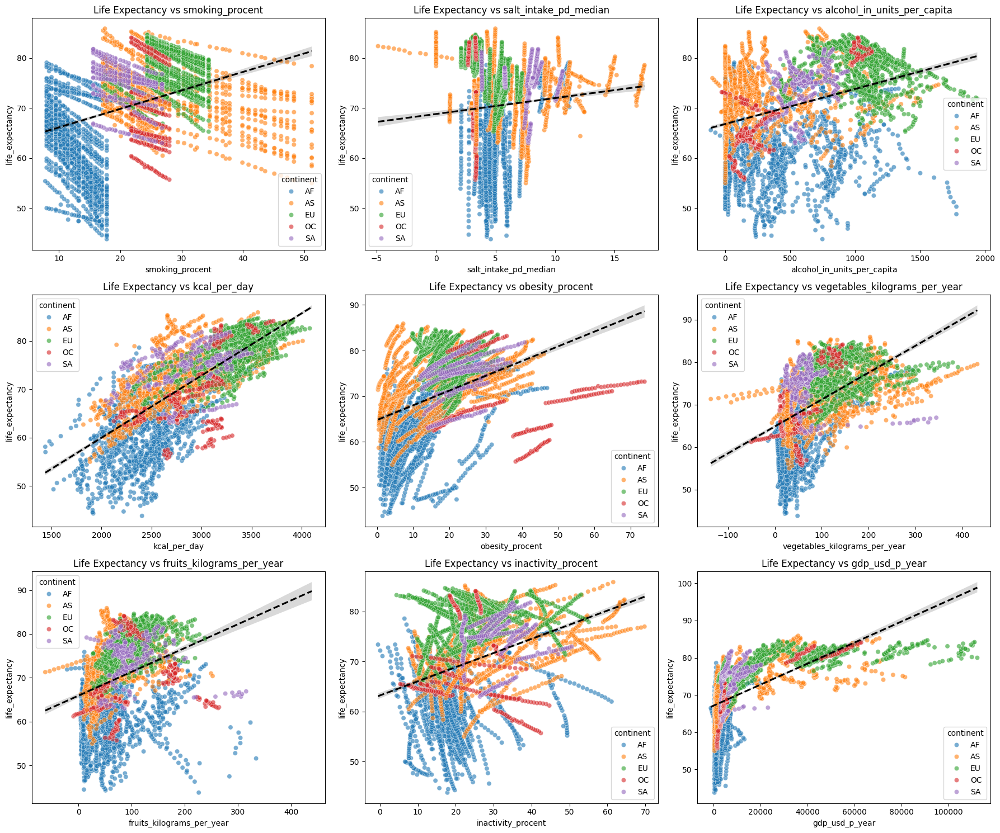

In [94]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pda

# Stap 1: Scatterplots met regressielijnen per continent
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
axes = axes.flatten()

scatter_features = ['smoking_procent', 'salt_intake_pd_median', 'alcohol_in_units_per_capita',
                    'kcal_per_day', 'obesity_procent', 'vegetables_kilograms_per_year',
                    'fruits_kilograms_per_year', 'inactivity_procent', 'gdp_usd_p_year']

for i, feature in enumerate(scatter_features):
    if i >= len(axes):
        break
    sns.scatterplot(data=df, x=feature, y='life_expectancy', hue='continent', alpha=0.6, ax=axes[i])
    sns.regplot(data=df, x=feature, y='life_expectancy', scatter=False, ax=axes[i], color='black', line_kws={"linestyle": "dashed"})
    axes[i].set_title(f'Life Expectancy vs {feature}')

plt.tight_layout()
plt.show()

/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_85428/3514657546.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='continent', y='life_expectancy', palette='Set2')


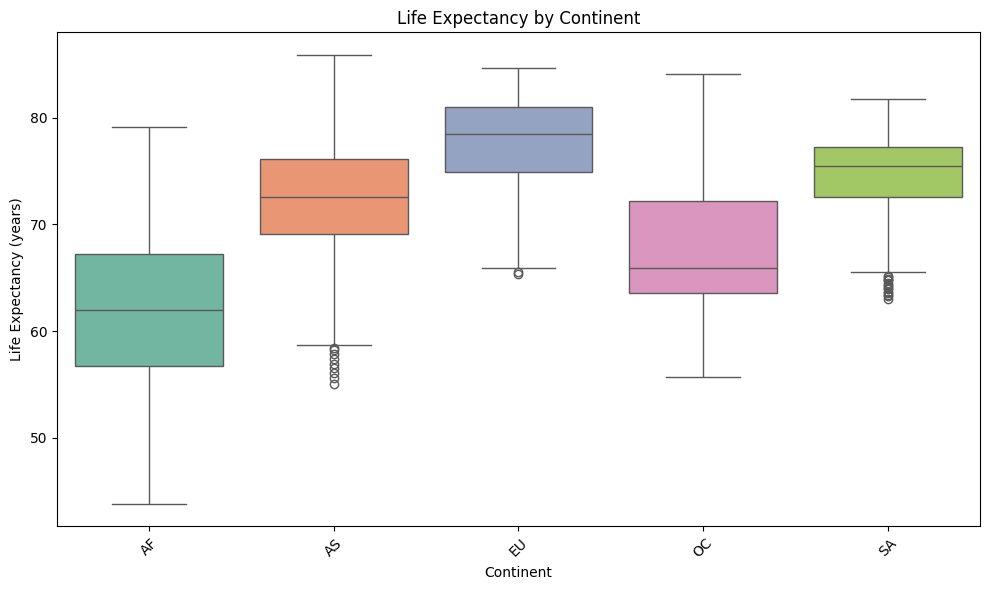

In [95]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='continent', y='life_expectancy', palette='Set2')
plt.title('Life Expectancy by Continent')
plt.ylabel('Life Expectancy (years)')
plt.xlabel('Continent')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [96]:
df['continent'] = df['continent'].fillna('NA')


In [97]:
print(df['continent'].value_counts(dropna=False))


continent
AF    1404
AS    1196
EU    1014
NA     546
SA     286
OC     260
Name: count, dtype: int64


In [98]:
continent_mapping = {
    'AF': 'Africa',
    'AS': 'Asia',
    'EU': 'Europe',
    'NA': 'North America',
    'SA': 'South America',
    'OC': 'Oceania'
}

df['continent_full'] = df['continent'].map(continent_mapping)


In [132]:
df.to_csv('/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/LE_join_1.csv', index=False)


In [151]:
import pandas as pd

# Replace 'your_file.csv' with your actual file path
df = pd.read_csv("/Users/noachmeged/Documents/Ironhack/Final_Project/Combing_data/LE_join_1.csv", delimiter=';')

# Display the first few rows
print(df.head())

   year country iso3  alcohol_in_units_per_capita  smoking_procent  \
0  2000  Angola  AGO                        519.0             17.8   
1  2001  Angola  AGO                        519.0             17.0   
2  2002  Angola  AGO                        543.0             16.6   
3  2003  Angola  AGO                        558.0             16.2   
4  2004  Angola  AGO                        608.0             15.9   

   vegetables_kilograms_per_year  fruits_kilograms_per_year  \
0                      17.030321                  23.986849   
1                      17.083775                  25.999264   
2                      17.856438                  31.735336   
3                      17.765633                  38.075290   
4                      19.993456                  41.816880   

   salt_intake_pd_median  salt_intake_pd_median_female  \
0                 4.9022                        4.6482   
1                 4.9530                        4.6990   
2                 4.9276  

In [152]:
# Filter for the years between 2000 and 2025
df_filtered = df[df['year'].isin(range(2000, 2026))]

# Pivot the data to get life expectancy for all years for each country
df_pivot = df_filtered.pivot(index='country', columns='year', values='life_expectancy')

# Calculate the life expectancy difference for each year compared to 2000
df_diff = df_pivot.apply(lambda row: row - row[2000], axis=1)

# Convert the differences into a long format (stacking all year differences into one column)
df_diff_long = df_diff.reset_index().melt(id_vars='country', var_name='year', value_name='life_expectancy_diff')

# Merge the differences back into the original DataFrame
df = df.merge(df_diff_long[['country', 'year', 'life_expectancy_diff']], on=['country', 'year'], how='left')

# Save the updated DataFrame to CSV (optional)
df.to_csv('updated_life_expectancy_data.csv', index=False)


In [123]:
import pandas as pd

# Filter data for the year 2025
df_2025 = df[df['year'] == 2025]

# Group by continent and country, then sort within each group by life expectancy
top_10_per_continent = df_2025.groupby('continent_full').apply(
    lambda x: x.nlargest(10, 'life_expectancy')).reset_index(drop=True)

# Display the top 10 countries per continent
print(top_10_per_continent[['continent_full', 'country', 'iso3', 'life_expectancy']])


   continent_full                           country iso3  life_expectancy
0          Africa                           Algeria  DZA             79.1
1          Africa                            Rwanda  RWA             78.6
2          Africa                           Tunisia  TUN             78.2
3          Africa                        Cabo Verde  CPV             76.0
4          Africa                          Ethiopia  ETH             75.9
5          Africa                             Libya  LBY             75.9
6          Africa                         Mauritius  MUS             75.4
7          Africa                           Morocco  MAR             74.4
8          Africa                        Seychelles  SYC             73.9
9          Africa                            Malawi  MWI             73.4
10           Asia                 Republic of Korea  KOR             85.9
11           Asia                             Japan  JPN             85.3
12           Asia                     

/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_85428/2363075341.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_10_per_continent = df_2025.groupby('continent_full').apply(


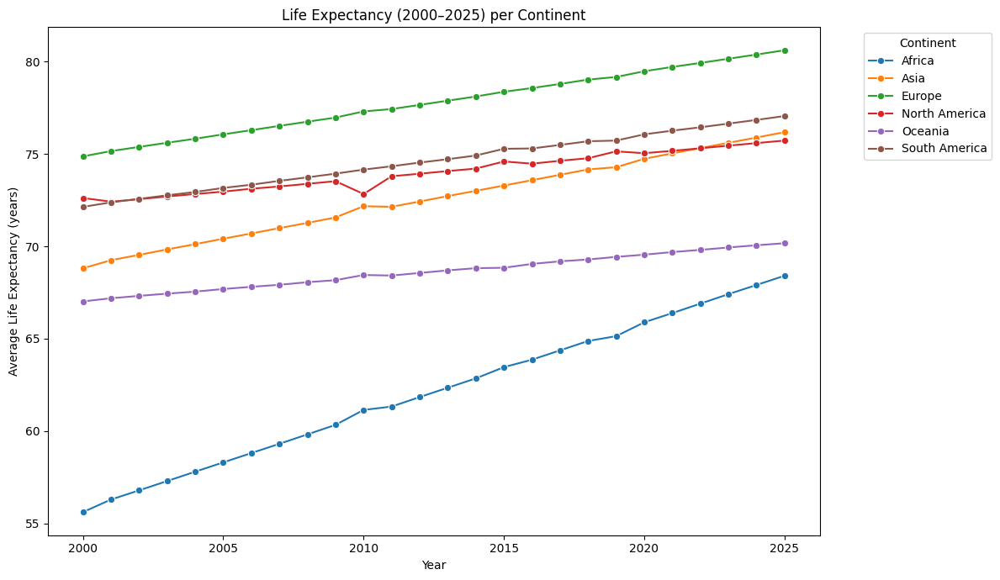

In [124]:
# Make sure 'continent_full' exists (if not, run the mapping step again)
# Group by year and continent, and calculate average life expectancy
df_life_trend = df.groupby(['year', 'continent_full'])['life_expectancy'].mean().reset_index()

# Plot it
plt.figure(figsize=(12, 7))
sns.lineplot(data=df_life_trend, x='year', y='life_expectancy', hue='continent_full', marker='o')
plt.title('Life Expectancy (2000–2025) per Continent')
plt.ylabel('Average Life Expectancy (years)')
plt.xlabel('Year')
plt.legend(title='Continent', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_85428/2742971931.py:42: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/noachmeged/Documents/Ironhack/Project-Amazon/Flask/.venv/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


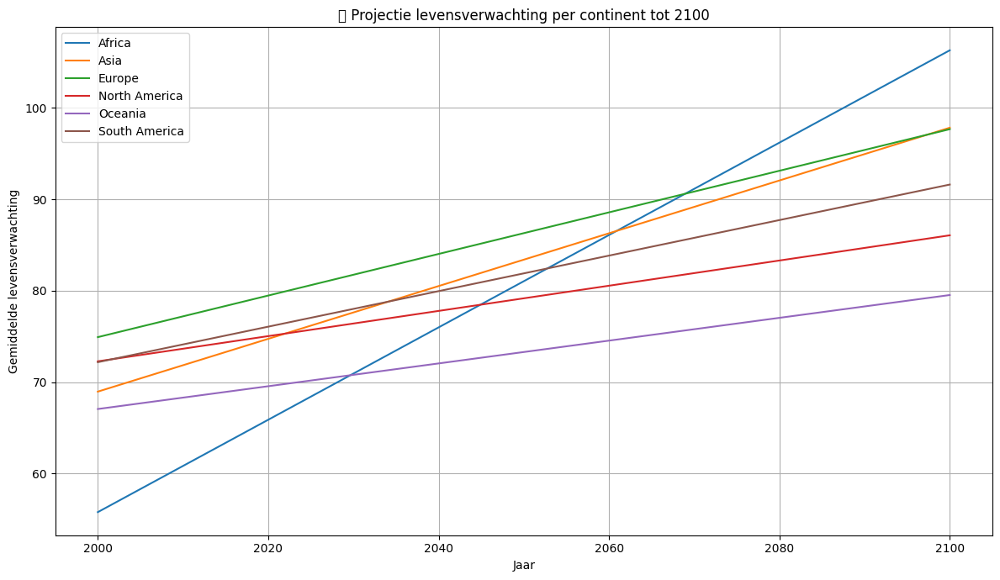

In [125]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Zorg dat df is geladen en bevat: ['year', 'continent_full', 'life_expectancy']
# Filter alleen vanaf 2000
df_future = df[df['year'] >= 2000].copy()

# Maak lege dict om regressiemodellen op te slaan
models = {}
future_years = np.arange(2000, 2101).reshape(-1, 1)

plt.figure(figsize=(12, 7))

for continent in df_future['continent_full'].unique():
    # Data voor elk continent
    df_cont = df_future[df_future['continent_full'] == continent]
    
    # Gemiddelde levensverwachting per jaar
    grouped = df_cont.groupby('year')['life_expectancy'].mean().reset_index()

    # Fit lineaire regressie
    model = LinearRegression()
    X = grouped['year'].values.reshape(-1, 1)
    y = grouped['life_expectancy'].values
    model.fit(X, y)
    models[continent] = model
    
    # Voorspel tot 2100
    future_pred = model.predict(future_years)

    # Plot
    plt.plot(future_years, future_pred, label=continent)

# Plot instellingen
plt.title("📈 Projectie levensverwachting per continent tot 2100")
plt.xlabel("Jaar")
plt.ylabel("Gemiddelde levensverwachting")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


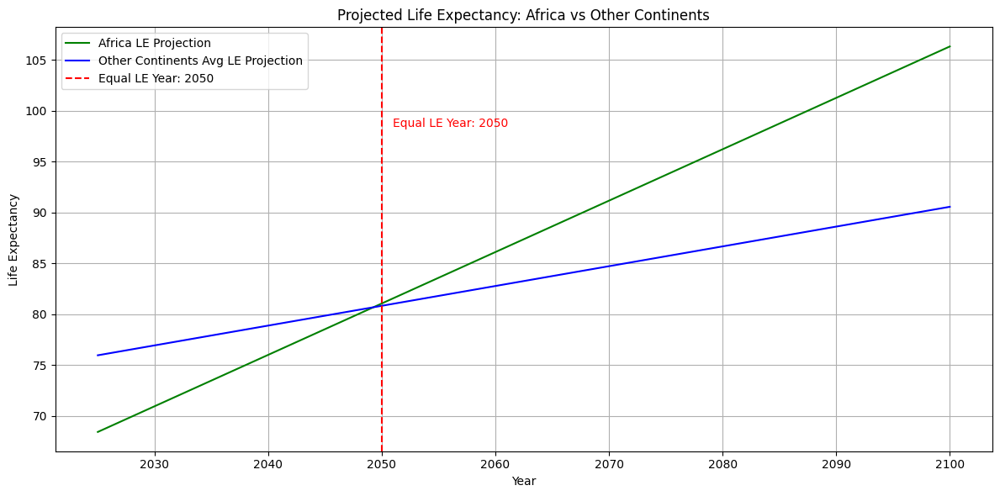

In [126]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np

# Assuming df is already loaded and contains the necessary columns
# Step 1: Prepare the data
df_future = df[df['year'] >= 2000].copy()

# Step 2: Calculate mean life expectancy per continent per year
mean_le_by_continent = df_future.groupby(['year', 'continent_full'])['life_expectancy'].mean().reset_index()

# Step 3: Separate Africa and Other Continents
africa_le = mean_le_by_continent[mean_le_by_continent['continent_full'] == 'Africa']
other_le = mean_le_by_continent[mean_le_by_continent['continent_full'] != 'Africa']

# Calculate global average excluding Africa
global_other_avg = other_le.groupby('year')['life_expectancy'].mean().reset_index()

# Step 4: Fit linear regression models
X_africa = africa_le['year'].values.reshape(-1, 1)
y_africa = africa_le['life_expectancy'].values
model_africa = LinearRegression().fit(X_africa, y_africa)

X_other = global_other_avg['year'].values.reshape(-1, 1)
y_other = global_other_avg['life_expectancy'].values
model_other = LinearRegression().fit(X_other, y_other)

# Step 5: Project into the future
future_years = np.arange(2025, 2101).reshape(-1, 1)
africa_pred = model_africa.predict(future_years)
other_pred = model_other.predict(future_years)

# Step 6: Find intersection
year_match = None
for year, a_pred, o_pred in zip(future_years.flatten(), africa_pred, other_pred):
    if a_pred >= o_pred:
        year_match = year
        break

# Step 7: Plot the projection
plt.figure(figsize=(12, 6))
plt.plot(future_years, africa_pred, label='Africa LE Projection', color='green')
plt.plot(future_years, other_pred, label='Other Continents Avg LE Projection', color='blue')
if year_match:
    plt.axvline(x=year_match, color='red', linestyle='--', label=f'Equal LE Year: {year_match}')
    plt.text(year_match + 1, (africa_pred[-1] + other_pred[-1]) / 2,
             f"Equal LE Year: {year_match}", color='red')
plt.xlabel('Year')
plt.ylabel('Life Expectancy')
plt.title('Projected Life Expectancy: Africa vs Other Continents')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Levensverwachting = 0.01 * kcal_per_day + 31.31


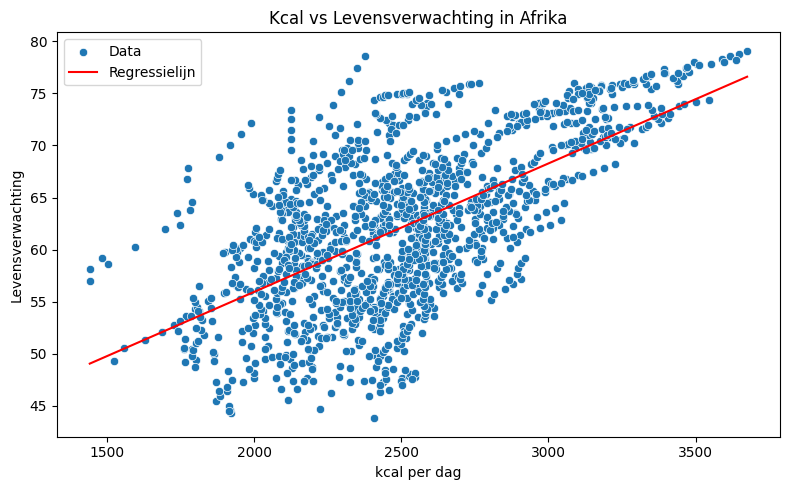

In [129]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression

# Filter de data voor Afrika en verwijder NaN
df_africa = df[df['continent_full'] == 'Africa']
df_africa = df_africa.dropna(subset=['kcal_per_day', 'life_expectancy'])

# Definieer X en y
X = df_africa[['kcal_per_day']]
y = df_africa['life_expectancy']

# Bouw en train het model
model = LinearRegression()
model.fit(X, y)

# Maak voorspellingen
df_africa['life_expectancy_pred'] = model.predict(X)

# Print resultaat
print(f"Levensverwachting = {model.coef_[0]:.2f} * kcal_per_day + {model.intercept_:.2f}")

# Plot
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df_africa, x='kcal_per_day', y='life_expectancy', label='Data')
sns.lineplot(data=df_africa, x='kcal_per_day', y='life_expectancy_pred', color='red', label='Regressielijn')
plt.title('Kcal vs Levensverwachting in Afrika')
plt.xlabel('kcal per dag')
plt.ylabel('Levensverwachting')
plt.legend()
plt.tight_layout()
plt.show()


In [64]:
print(df.head())  # To check the first few rows
print(df.columns)  # To list all the columns


   index  year country iso3  alcohol_in_units_per_capita  smoking_procent  \
0      0  2000  Angola  AGO                        519.0             17.8   
1      1  2001  Angola  AGO                        519.0             17.0   
2      2  2002  Angola  AGO                        543.0             16.6   
3      3  2003  Angola  AGO                        558.0             16.2   
4      4  2004  Angola  AGO                        608.0             15.9   

   vegetables_kilograms_per_year  fruits_kilograms_per_year  \
0                      17.030321                  23.986849   
1                      17.083775                  25.999264   
2                      17.856438                  31.735336   
3                      17.765633                  38.075290   
4                      19.993456                  41.816880   

   salt_intake_pd_median  salt_intake_pd_median_female  ...  \
0                 4.9022                        4.6482  ...   
1                 4.9530        

/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_85428/794967433.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df_pivot['life_expectancy_diff'], y=df_pivot.index, palette='coolwarm')


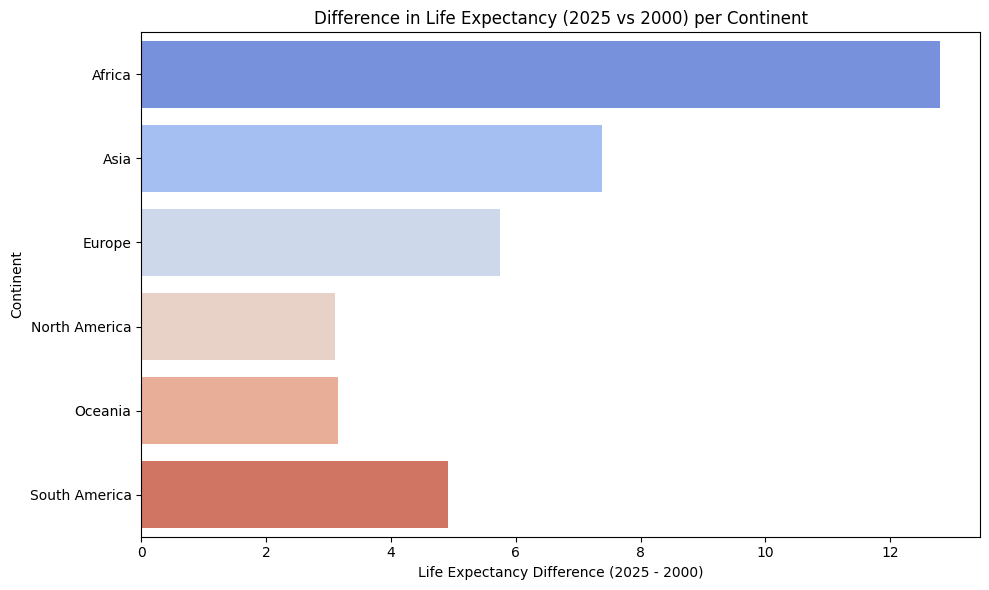

In [130]:
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Group by year and continent to calculate the average life expectancy
df_life_trend = df.groupby(['year', 'continent_full'])['life_expectancy'].mean().reset_index()

# Step 2: Filter for the years 2000 and 2025
df_filtered = df_life_trend[df_life_trend['year'].isin([2000, 2025])]

# Step 3: Pivot the data to get life expectancy for 2000 and 2025
df_pivot = df_filtered.pivot(index='continent_full', columns='year', values='life_expectancy')

# Step 4: Calculate the difference between 2025 and 2000
df_pivot['life_expectancy_diff'] = df_pivot[2025] - df_pivot[2000]

# Step 5: Create a horizontal bar plot to visualize the difference
plt.figure(figsize=(10, 6))
sns.barplot(x=df_pivot['life_expectancy_diff'], y=df_pivot.index, palette='coolwarm')

# Adding titles and labels
plt.title('Difference in Life Expectancy (2025 vs 2000) per Continent')
plt.xlabel('Life Expectancy Difference (2025 - 2000)')
plt.ylabel('Continent')
plt.tight_layout()
plt.show()





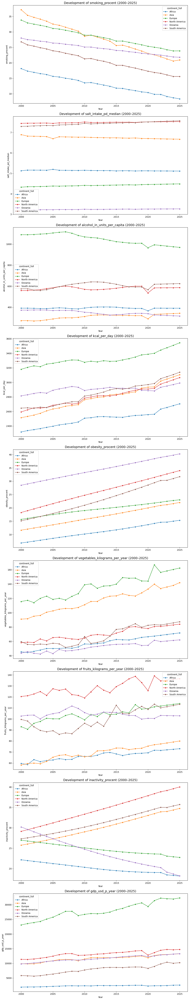

In [153]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of features to track over the years
features = ['smoking_procent', 'salt_intake_pd_median', 'alcohol_in_units_per_capita',
            'kcal_per_day', 'obesity_procent', 'vegetables_kilograms_per_year',
            'fruits_kilograms_per_year', 'inactivity_procent', 'gdp_usd_p_year']

# Step 1: Create subplots for each feature
fig, axes = plt.subplots(len(features), 1, figsize=(12, 7 * len(features)))

# Step 2: Loop through each feature to create a plot
for i, feature in enumerate(features):
    # Group by year and continent to calculate the mean of each feature
    df_feature = df.groupby(['year', 'continent_full'])[feature].mean().reset_index()

    # Plot the development over time for the current feature
    sns.lineplot(data=df_feature, x='year', y=feature, hue='continent_full', marker='o', ax=axes[i])

    # Set title and labels for each plot
    axes[i].set_title(f'Development of {feature} (2000–2025)', fontsize=14)
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel(feature)

# Improve layout and add a tight layout for better spacing
plt.tight_layout()
plt.show()


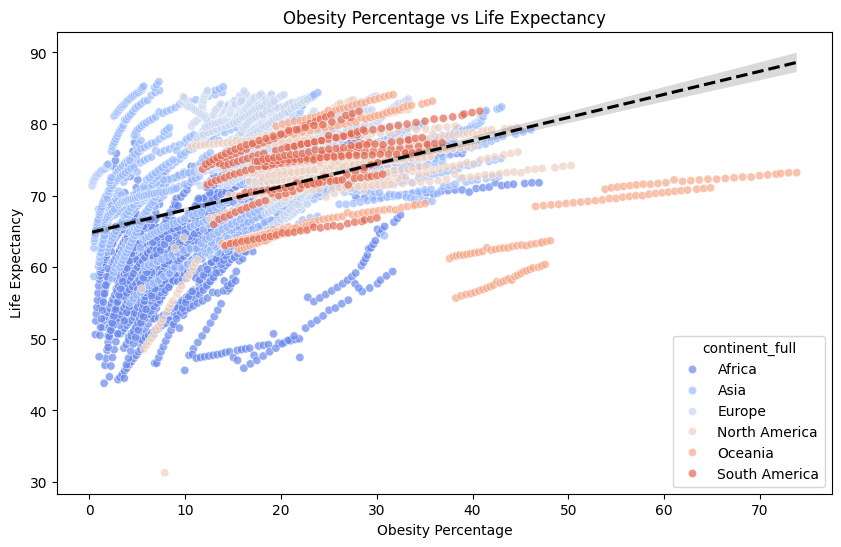

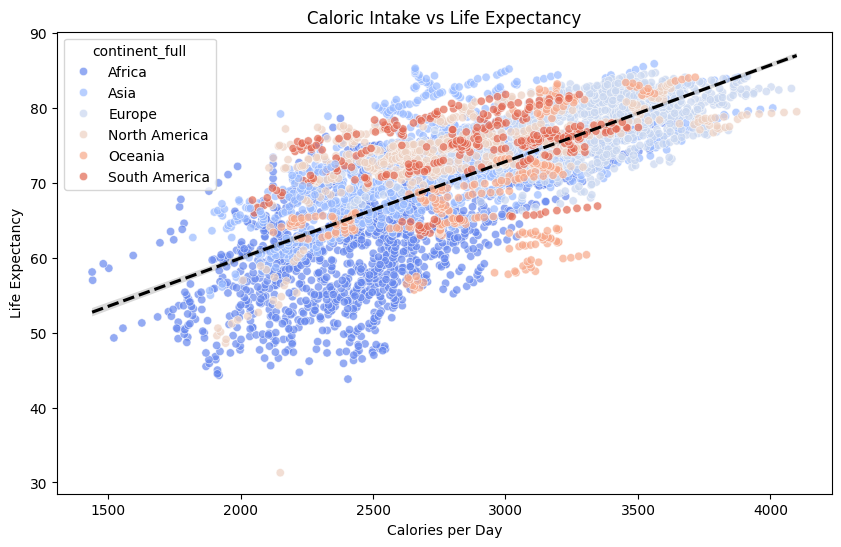

Correlation between Obesity Percentage and Life Expectancy: 0.4192549536908462
Correlation between Caloric Intake and Life Expectancy: 0.7236031913388203


In [41]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Plotting Obesity vs Life Expectancy
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='obesity_procent', y='life_expectancy', hue='continent_full', palette='coolwarm', alpha=0.7)
sns.regplot(data=df, x='obesity_procent', y='life_expectancy', scatter=False, color='black', line_kws={"linestyle": "dashed"})
plt.title('Obesity Percentage vs Life Expectancy')
plt.xlabel('Obesity Percentage')
plt.ylabel('Life Expectancy')
plt.show()

# Plotting Caloric Intake vs Life Expectancy
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='kcal_per_day', y='life_expectancy', hue='continent_full', palette='coolwarm', alpha=0.7)
sns.regplot(data=df, x='kcal_per_day', y='life_expectancy', scatter=False, color='black', line_kws={"linestyle": "dashed"})
plt.title('Caloric Intake vs Life Expectancy')
plt.xlabel('Calories per Day')
plt.ylabel('Life Expectancy')
plt.show()

# Correlations to see the relationship
obesity_corr = df['obesity_procent'].corr(df['life_expectancy'])
calories_corr = df['kcal_per_day'].corr(df['life_expectancy'])

print(f'Correlation between Obesity Percentage and Life Expectancy: {obesity_corr}')
print(f'Correlation between Caloric Intake and Life Expectancy: {calories_corr}')


In [51]:
# Filter de data voor Afrika en de relevante jaren
df_africa = df[(df['continent_full'] == 'Africa') & (df['year'].isin([2000, 2025]))]

# Functie om landen in quintielen in te delen per jaar
def assign_quintiles(data, year):
    # Filter voor specifiek jaar
    data_year = data[data['year'] == year].copy()
    
    # Verdeel landen in 5 quintielen op basis van kcal_per_day
    data_year['kcal_quintile'] = pd.qcut(data_year['kcal_per_day'], 5, labels=['Q1', 'Q2', 'Q3', 'Q4', 'Q5'])
    
    return data_year[['country', 'kcal_per_day', 'kcal_quintile']].sort_values(by='kcal_quintile')

# Pas de functie toe op 2000 en 2025
quintiles_2000 = assign_quintiles(df_africa, 2000)
quintiles_2025 = assign_quintiles(df_africa, 2025)

# Toon de resultaten
print("📅 Quintielen voor 2000:")
print(quintiles_2000)

print("\n📅 Quintielen voor 2025:")
print(quintiles_2025)


📅 Quintielen voor 2000:
                               country  kcal_per_day kcal_quintile
0                               Angola     1522.1116            Q1
1274       United Republic of Tanzania     1979.2448            Q1
1196                              Chad     1956.8671            Q1
1040                      Sierra Leone     1797.2223            Q1
130           Central African Republic     1919.0796            Q1
962                             Rwanda     1922.4888            Q1
416                           Ethiopia     1759.1462            Q1
1352                            Zambia     1912.7394            Q1
780                         Mozambique     2046.8368            Q1
728                         Madagascar     1947.6831            Q1
312                           Djibouti     1941.8460            Q1
598                              Kenya     2077.7840            Q2
624                            Liberia     2119.6333            Q2
910                              Niger

In [43]:
df.columns

Index(['year', 'country', 'iso3', 'alcohol_in_units_per_capita',
       'smoking_procent', 'vegetables_kilograms_per_year',
       'fruits_kilograms_per_year', 'salt_intake_pd_median',
       'salt_intake_pd_median_female', 'salt_intake_pd_median_male',
       'inactivity_procent', 'inactivity_procent_female',
       'inactivity_procent_male', 'obesity_procent', 'obesity_procent_female',
       'obesity_procent_male', 'life_expectancy', 'life_expectancy_male',
       'life_expectancy_female', 'life_expectancy_60',
       'life_expectancy_60_male', 'life_expectancy_60_female',
       'life_expectancy_primary_key', 'kcal_per_day', 'gdp_usd_p_year',
       'row_num', 'continent', 'continent_full'],
      dtype='object')

In [48]:
import pandas as pd

# Gemiddelde levensverwachting per quintiel per jaar
mean_life_exp_2000 = quintiles_2000.groupby('kcal_quintile')['life_expectancy'].mean()
mean_life_exp_2025 = quintiles_2025.groupby('kcal_quintile')['life_expectancy'].mean()

# Combineer in één DataFrame
life_exp_df = pd.DataFrame({
    '2000': mean_life_exp_2000,
    '2025': mean_life_exp_2025
})

# Zorg dat de kolommen netjes zijn
life_exp_df.index.name = 'Calorie Quintile'
life_exp_df = life_exp_df.reset_index()
life_exp_df.columns.name = None

# Toon de tabel
print("📊 Gemiddelde levensverwachting per caloriequintiel:")
print(life_exp_df)


📊 Gemiddelde levensverwachting per caloriequintiel:
  Calorie Quintile       2000       2025
0               Q1  50.709091  64.490909
1               Q2  52.490909  67.961538
2               Q3  55.090000  68.337500
3               Q4  55.336364  68.436364
4               Q5  64.390909  72.890909


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_85428/911605424.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_life_exp_2000 = quintiles_2000.groupby('kcal_quintile')['life_expectancy'].mean()
/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_85428/911605424.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_life_exp_2025 = quintiles_2025.groupby('kcal_quintile')['life_expectancy'].mean()


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/851067962.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_obesity_diff = df_obesity_first_last.groupby('obesity_quintile')['life_expectancy'].mean().reset_index()
/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/851067962.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_calories_diff = df_calories_first_last.groupby('calories_quintile')['life_expectancy'].mean().reset_index()
/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/851067962.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is d

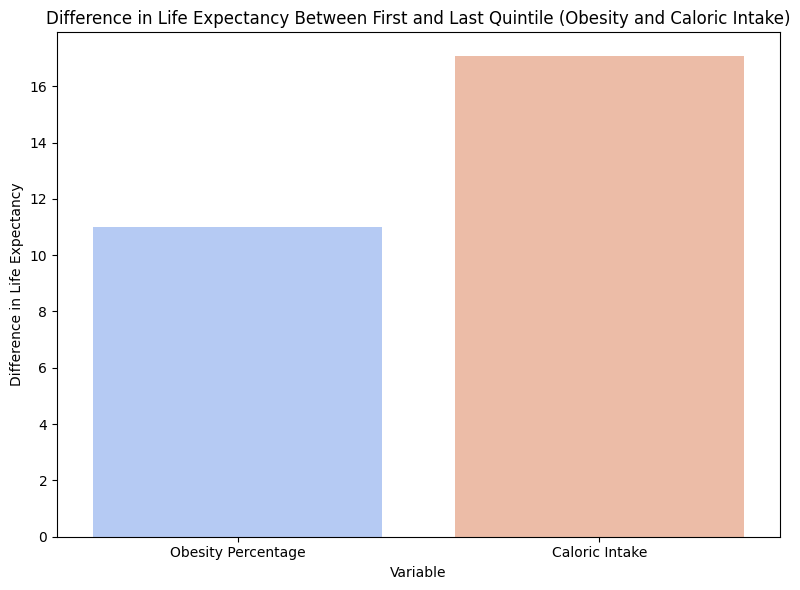

Difference in Life Expectancy (Obesity): 10.99
Difference in Life Expectancy (Caloric Intake): 17.06


In [317]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter data for the first and last quintiles of obesity and caloric intake
df_obesity_first_last = df[df['obesity_quintile'].isin(['Q1', 'Q5'])]
df_calories_first_last = df[df['calories_quintile'].isin(['Q1', 'Q5'])]

# Group by the quintiles and calculate the average life expectancy
df_obesity_diff = df_obesity_first_last.groupby('obesity_quintile')['life_expectancy'].mean().reset_index()
df_calories_diff = df_calories_first_last.groupby('calories_quintile')['life_expectancy'].mean().reset_index()

# Calculate the differences between the first and last quintiles
obesity_diff = df_obesity_diff.loc[df_obesity_diff['obesity_quintile'] == 'Q5', 'life_expectancy'].values[0] - \
               df_obesity_diff.loc[df_obesity_diff['obesity_quintile'] == 'Q1', 'life_expectancy'].values[0]

calories_diff = df_calories_diff.loc[df_calories_diff['calories_quintile'] == 'Q5', 'life_expectancy'].values[0] - \
                df_calories_diff.loc[df_calories_diff['calories_quintile'] == 'Q1', 'life_expectancy'].values[0]

# Create a DataFrame to display the differences
difference_df = pd.DataFrame({
    'Variable': ['Obesity Percentage', 'Caloric Intake'],
    'Difference in Life Expectancy': [obesity_diff, calories_diff]
})

# Plot the differences using a bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x='Variable', y='Difference in Life Expectancy', data=difference_df, palette='coolwarm')
plt.title('Difference in Life Expectancy Between First and Last Quintile (Obesity and Caloric Intake)')
plt.ylabel('Difference in Life Expectancy')
plt.tight_layout()
plt.show()

# Print the difference values
print(f"Difference in Life Expectancy (Obesity): {obesity_diff:.2f}")
print(f"Difference in Life Expectancy (Caloric Intake): {calories_diff:.2f}")


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/1918514087.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_grouped_yearly = df.groupby(['year', 'obesity_quintile', 'calories_quintile'])['life_expectancy'].mean().reset_index()
/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/1918514087.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_obesity_pivot = df_obesity_first_last_yearly.pivot_table(index='year', columns='obesity_quintile', values='life_expectancy')
/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/1918514087.py:13: FutureWarning: The default value of observed=False is dep

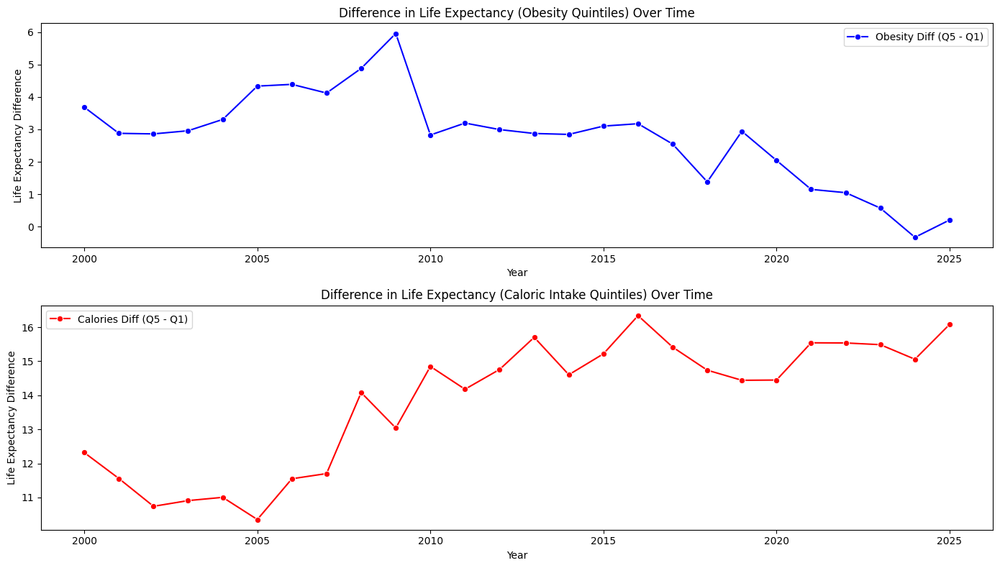

In [323]:
import seaborn as sns
import matplotlib.pyplot as plt

# Group by year, obesity quintile, and caloric intake quintile to calculate the average life expectancy
df_grouped_yearly = df.groupby(['year', 'obesity_quintile', 'calories_quintile'])['life_expectancy'].mean().reset_index()

# Filter data for the first and last quintiles of obesity and caloric intake
df_obesity_first_last_yearly = df_grouped_yearly[df_grouped_yearly['obesity_quintile'].isin(['Q1', 'Q5'])]
df_calories_first_last_yearly = df_grouped_yearly[df_grouped_yearly['calories_quintile'].isin(['Q1', 'Q5'])]

# Pivot the data to have a clearer view of the differences per year
df_obesity_pivot = df_obesity_first_last_yearly.pivot_table(index='year', columns='obesity_quintile', values='life_expectancy')
df_calories_pivot = df_calories_first_last_yearly.pivot_table(index='year', columns='calories_quintile', values='life_expectancy')

# Calculate the difference in life expectancy between Q5 and Q1 for both obesity and calories per year
df_obesity_pivot['obesity_diff'] = df_obesity_pivot['Q5'] - df_obesity_pivot['Q1']
df_calories_pivot['calories_diff'] = df_calories_pivot['Q5'] - df_calories_pivot['Q1']

# Plot the trends over time
plt.figure(figsize=(14, 8))

# Obesity trend
plt.subplot(2, 1, 1)
sns.lineplot(x=df_obesity_pivot.index, y=df_obesity_pivot['obesity_diff'], marker='o', color='blue', label='Obesity Diff (Q5 - Q1)')
plt.title('Difference in Life Expectancy (Obesity Quintiles) Over Time')
plt.xlabel('Year')
plt.ylabel('Life Expectancy Difference')
plt.legend()

# Caloric intake trend
plt.subplot(2, 1, 2)
sns.lineplot(x=df_calories_pivot.index, y=df_calories_pivot['calories_diff'], marker='o', color='red', label='Calories Diff (Q5 - Q1)')
plt.title('Difference in Life Expectancy (Caloric Intake Quintiles) Over Time')
plt.xlabel('Year')
plt.ylabel('Life Expectancy Difference')
plt.legend()

plt.tight_layout()
plt.show()


In [313]:
# Calculate the mean and median of obesity percentage and caloric intake within each quintile
obesity_stats = df.groupby('obesity_quintile')['obesity_procent'].agg(['mean', 'median']).reset_index()
calories_stats = df.groupby('calories_quintile')['kcal_per_day'].agg(['mean', 'median']).reset_index()

# Print the results
print("Obesity Percentage Mean and Median by Quintile:")
print(obesity_stats)

print("\nCaloric Intake Mean and Median by Quintile:")
print(calories_stats)


Obesity Percentage Mean and Median by Quintile:
  obesity_quintile       mean     median
0               Q1   4.330135   4.435000
1               Q2  11.186433  11.380000
2               Q3  17.598625  17.660613
3               Q4  23.081537  22.895889
4               Q5  34.513850  32.000000

Caloric Intake Mean and Median by Quintile:
  calories_quintile         mean     median
0                Q1  2172.940490  2198.0000
1                Q2  2534.683570  2540.9490
2                Q3  2806.625689  2804.6462
3                Q4  3126.678104  3131.5200
4                Q5  3506.785732  3477.9995


/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/126274107.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obesity_stats = df.groupby('obesity_quintile')['obesity_procent'].agg(['mean', 'median']).reset_index()
/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/126274107.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  calories_stats = df.groupby('calories_quintile')['kcal_per_day'].agg(['mean', 'median']).reset_index()


In [326]:
import statsmodels.api as sm
import pandas as pd

# Define the independent variables (all factors you mentioned) and the dependent variable
independent_vars = ['alcohol_in_units_per_capita', 'smoking_procent', 'vegetables_kilograms_per_year', 
                    'fruits_kilograms_per_year', 'salt_intake_pd_median', 'inactivity_procent', 
                    'obesity_procent', 'year', 'kcal_per_day', 'gdp_usd_p_year']
X = df[independent_vars]  # Independent variables
y = df['life_expectancy']  # Dependent variable

# Add a constant to the model (intercept term)
X = sm.add_constant(X)

# Fit the regression model
model = sm.OLS(y, X).fit()

# Display the regression results
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:        life_expectancy   R-squared:                       0.707
Model:                            OLS   Adj. R-squared:                  0.707
Method:                 Least Squares   F-statistic:                     1134.
Date:                Fri, 04 Apr 2025   Prob (F-statistic):               0.00
Time:                        12:59:06   Log-Likelihood:                -13860.
No. Observations:                4706   AIC:                         2.774e+04
Df Residuals:                    4695   BIC:                         2.781e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

In [135]:
import statsmodels.api as sm
import pandas as pd

# Define independent and dependent variables
independent_vars = ['alcohol_in_units_per_capita', 'smoking_procent', 'vegetables_kilograms_per_year', 
                    'fruits_kilograms_per_year', 'salt_intake_pd_median', 'inactivity_procent', 
                    'obesity_procent', 'year', 'kcal_per_day', 'gdp_usd_p_year']

# Loop through each continent and run separate regressions
for continent, data in df.groupby('continent_full'):
    print(f"\n📍 Regression results for {continent}:\n" + "-"*50)
    
    X = data[independent_vars]
    y = data['life_expectancy']
    
    # Add constant for intercept
    X = sm.add_constant(X)
    
    # Fit and summarize the model
    model = sm.OLS(y, X).fit()
    print(model.summary())



📍 Regression results for Africa:
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:        life_expectancy   R-squared:                       0.623
Model:                            OLS   Adj. R-squared:                  0.621
Method:                 Least Squares   F-statistic:                     230.6
Date:                Sun, 06 Apr 2025   Prob (F-statistic):          6.12e-287
Time:                        12:58:53   Log-Likelihood:                -4143.7
No. Observations:                1404   AIC:                             8309.
Df Residuals:                    1393   BIC:                             8367.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------

In [136]:
import statsmodels.api as sm
import pandas as pd

# Define independent and dependent variables
independent_vars = ['alcohol_in_units_per_capita', 'smoking_procent', 'vegetables_kilograms_per_year', 
                    'fruits_kilograms_per_year', 'salt_intake_pd_median', 'inactivity_procent', 
                    'obesity_procent', 'year', 'kcal_per_day', 'gdp_usd_p_year']

# Loop through each continent and run separate regressions
for continent, data in df.groupby('continent_full'):
    print(f"\n📍 Regression results for {continent}:\n" + "-"*50)
    
    X = data[independent_vars]
    y = data['life_expectancy']
    
    # Add constant for intercept
    X = sm.add_constant(X)
    
    # Fit and summarize the model
    model = sm.OLS(y, X).fit()
    print(model.summary())



📍 Regression results for Africa:
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:        life_expectancy   R-squared:                       0.623
Model:                            OLS   Adj. R-squared:                  0.621
Method:                 Least Squares   F-statistic:                     230.6
Date:                Sun, 06 Apr 2025   Prob (F-statistic):          6.12e-287
Time:                        12:59:10   Log-Likelihood:                -4143.7
No. Observations:                1404   AIC:                             8309.
Df Residuals:                    1393   BIC:                             8367.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------

In [324]:
# Group by obesity and caloric intake quintiles and calculate mean and median life expectancy
obesity_life_expectancy_stats = df.groupby('obesity_quintile')['life_expectancy'].agg(['mean', 'median']).reset_index()
calories_life_expectancy_stats = df.groupby('calories_quintile')['life_expectancy'].agg(['mean', 'median']).reset_index()

# Combine obesity and caloric intake stats with life expectancy stats
obesity_stats_combined = pd.merge(obesity_stats, obesity_life_expectancy_stats, on='obesity_quintile', suffixes=('_obesity', '_life_expectancy'))
calories_stats_combined = pd.merge(calories_stats, calories_life_expectancy_stats, on='calories_quintile', suffixes=('_calories', '_life_expectancy'))

# Print the results
print("Obesity Percentage with Life Expectancy by Quintile:")
print(obesity_stats_combined)

print("\nCaloric Intake with Life Expectancy by Quintile:")
print(calories_stats_combined)


Obesity Percentage with Life Expectancy by Quintile:
  obesity_quintile  mean_obesity  median_obesity  mean_life_expectancy  \
0               Q1      4.330135        4.435000             63.241083   
1               Q2     11.186433       11.380000             67.875265   
2               Q3     17.598625       17.660613             73.187447   
3               Q4     23.081537       22.895889             74.676165   
4               Q5     34.513850       32.000000             74.231237   

   median_life_expectancy  
0                   62.40  
1                   66.50  
2                   74.15  
3                   75.00  
4                   75.10  

Caloric Intake with Life Expectancy by Quintile:
  calories_quintile  mean_calories  median_calories  mean_life_expectancy  \
0                Q1    2172.940490        2198.0000             61.841932   
1                Q2    2534.683570        2540.9490             66.502976   
2                Q3    2806.625689        2804.6462  

/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/2793252361.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obesity_life_expectancy_stats = df.groupby('obesity_quintile')['life_expectancy'].agg(['mean', 'median']).reset_index()
/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/2793252361.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  calories_life_expectancy_stats = df.groupby('calories_quintile')['life_expectancy'].agg(['mean', 'median']).reset_index()


In [316]:
# Add quintile columns for obesity percentage and caloric intake
df['obesity_quintile'] = pd.qcut(df['obesity_procent'], q=5, labels=['Q1', 'Q2', 'Q3', 'Q4', 'Q5'])
df['calories_quintile'] = pd.qcut(df['kcal_per_day'], q=5, labels=['Q1', 'Q2', 'Q3', 'Q4', 'Q5'])

# Get the list of countries in each obesity quintile
obesity_countries_by_quintile = df.groupby('obesity_quintile')['iso3'].unique()

# Get the list of countries in each caloric intake quintile
calories_countries_by_quintile = df.groupby('calories_quintile')['iso3'].unique()

# Print the results
print("Countries by Obesity Quintile:")
for quintile, countries in obesity_countries_by_quintile.items():
    print(f"Obesity Quintile {quintile}: {countries}")

print("\nCountries by Caloric Intake Quintile:")
for quintile, countries in calories_countries_by_quintile.items():
    print(f"Caloric Intake Quintile {quintile}: {countries}")


Countries by Obesity Quintile:
Obesity Quintile Q1: ['AGO' 'BDI' 'BEN' 'BFA' 'CAF' 'CIV' 'CMR' 'COD' 'COG' 'COM' 'CPV' 'DJI'
 'ERI' 'ETH' 'GHA' 'GIN' 'GMB' 'GNB' 'KEN' 'LBR' 'MDG' 'MLI' 'MOZ' 'MWI'
 'NER' 'NGA' 'RWA' 'SDN' 'SEN' 'SLE' 'SOM' 'SSD' 'STP' 'TCD' 'TGO' 'TZA'
 'UGA' 'ZMB' 'ZWE' 'AFG' 'BGD' 'BTN' 'CHN' 'IDN' 'IND' 'JPN' 'KHM' 'KOR'
 'LAO' 'LKA' 'MDV' 'MMR' 'NPL' 'PAK' 'PHL' 'SGP' 'THA' 'VNM' 'YEM' 'HTI'
 'TLS']
Obesity Quintile Q2: ['AGO' 'BEN' 'BWA' 'CAF' 'CIV' 'CMR' 'COG' 'COM' 'CPV' 'DJI' 'DZA' 'GAB'
 'GHA' 'GIN' 'GMB' 'GNB' 'GNQ' 'KEN' 'LBR' 'LSO' 'MAR' 'MLI' 'MOZ' 'MRT'
 'MUS' 'MWI' 'NAM' 'NGA' 'SDN' 'SEN' 'SLE' 'SOM' 'SSD' 'STP' 'TGO' 'TZA'
 'UGA' 'ZMB' 'ZWE' 'AFG' 'BRN' 'BTN' 'CHN' 'IDN' 'IND' 'KAZ' 'KGZ' 'LAO'
 'LKA' 'MDV' 'MMR' 'MNG' 'MYS' 'PAK' 'PHL' 'SGP' 'THA' 'TJK' 'TKM' 'UZB'
 'YEM' 'ALB' 'AUT' 'BEL' 'BGR' 'BIH' 'CHE' 'DNK' 'FRA' 'ISL' 'ITA' 'MNE'
 'NLD' 'NOR' 'PRT' 'ROU' 'SRB' 'SVN' 'SWE' 'CUB' 'DOM' 'GTM' 'HND' 'HTI'
 'PNG' 'BOL' 'BRA' 'COL' 'ECU' 'GUY' 'PER']

/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/1176853535.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obesity_countries_by_quintile = df.groupby('obesity_quintile')['iso3'].unique()
/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/1176853535.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  calories_countries_by_quintile = df.groupby('calories_quintile')['iso3'].unique()


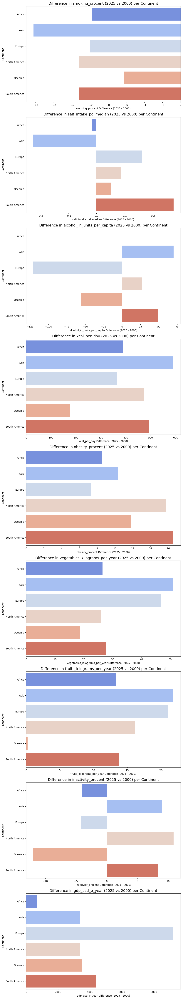

In [309]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of features to track over the years
features = ['smoking_procent', 'salt_intake_pd_median', 'alcohol_in_units_per_capita',
            'kcal_per_day', 'obesity_procent', 'vegetables_kilograms_per_year',
            'fruits_kilograms_per_year', 'inactivity_procent', 'gdp_usd_p_year']

# Step 1: Create subplots for each feature
fig, axes = plt.subplots(len(features), 1, figsize=(10, 6 * len(features)))

# Step 2: Loop through each feature to create a plot
for i, feature in enumerate(features):
    # Group by year and continent to calculate the mean of each feature
    df_feature = df.groupby(['year', 'continent_full'])[feature].mean().reset_index()

    # Step 3: Filter for the years 2000 and 2025
    df_filtered = df_feature[df_feature['year'].isin([2000, 2025])]

    # Step 4: Pivot the data to get feature values for 2000 and 2025
    df_pivot = df_filtered.pivot(index='continent_full', columns='year', values=feature)

    # Step 5: Calculate the difference between 2025 and 2000
    df_pivot['feature_diff'] = df_pivot[2025] - df_pivot[2000]

    # Step 6: Create a horizontal bar plot to visualize the difference
    sns.barplot(x=df_pivot['feature_diff'], y=df_pivot.index, hue=df_pivot.index, palette='coolwarm', ax=axes[i], legend=False)

    # Adding titles and labels for each plot
    axes[i].set_title(f'Difference in {feature} (2025 vs 2000) per Continent', fontsize=14)
    axes[i].set_xlabel(f'{feature} Difference (2025 - 2000)')
    axes[i].set_ylabel('Continent')

# Improve layout and add tight layout for better spacing
plt.tight_layout()
plt.show()


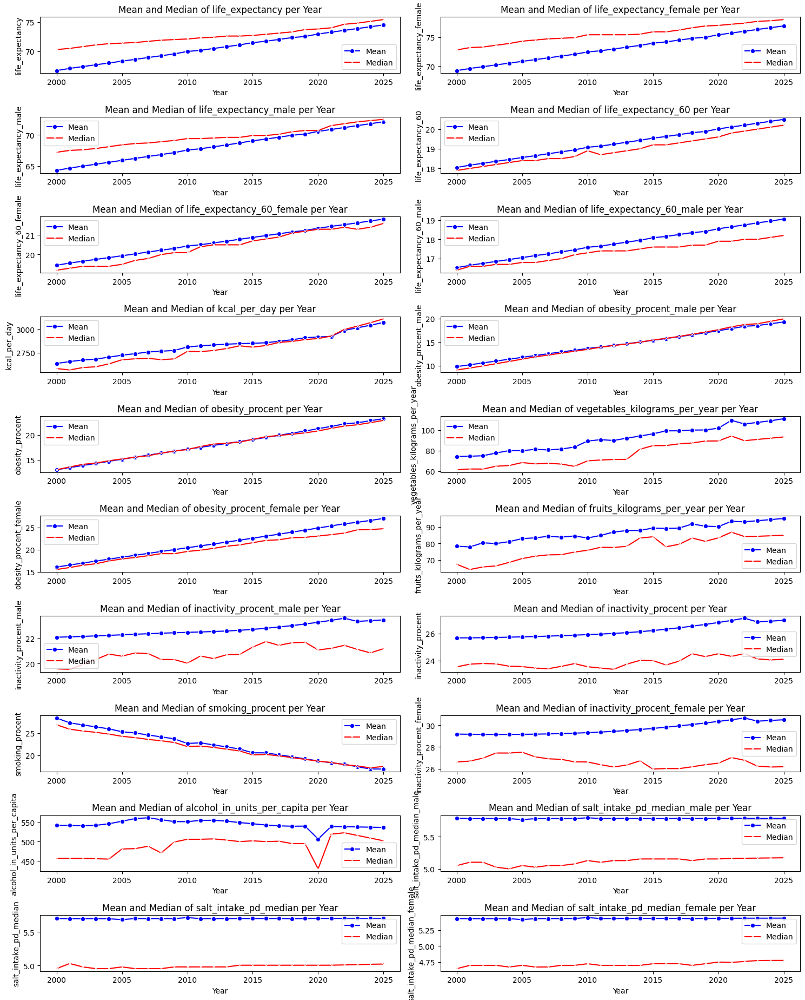

In [237]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of columns to analyze
columns = [
    "life_expectancy",
    "life_expectancy_female",
    "life_expectancy_male",
    "life_expectancy_60",
    "life_expectancy_60_female",
    "life_expectancy_60_male",
    'kcal_per_day',
    'obesity_procent_male',
    'obesity_procent',
    'vegetables_kilograms_per_year',
    'obesity_procent_female',
    'fruits_kilograms_per_year',
    'inactivity_procent_male',
    'inactivity_procent',
    'smoking_procent',
    'inactivity_procent_female',
    'alcohol_in_units_per_capita',
    'salt_intake_pd_median_male',
    'salt_intake_pd_median',
    'salt_intake_pd_median_female'
]

# Create a figure for the plots
plt.figure(figsize=(15, 20))

# Loop through the columns and plot mean and median
for i, col in enumerate(columns, 1):
    # Group by year and calculate mean and median for each column
    mean_per_year = df.groupby('year')[col].mean()
    median_per_year = df.groupby('year')[col].median()

    # Create a subplot for each factor
    plt.subplot(len(columns) // 2 + 1, 2, i)
    sns.lineplot(x=mean_per_year.index, y=mean_per_year.values, label='Mean', color='b', marker='o')
    sns.lineplot(x=median_per_year.index, y=median_per_year.values, label='Median', color='r', marker='x')

    # Add labels and title
    plt.xlabel('Year')
    plt.ylabel(col)
    plt.title(f'Mean and Median of {col} per Year')
    plt.legend()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


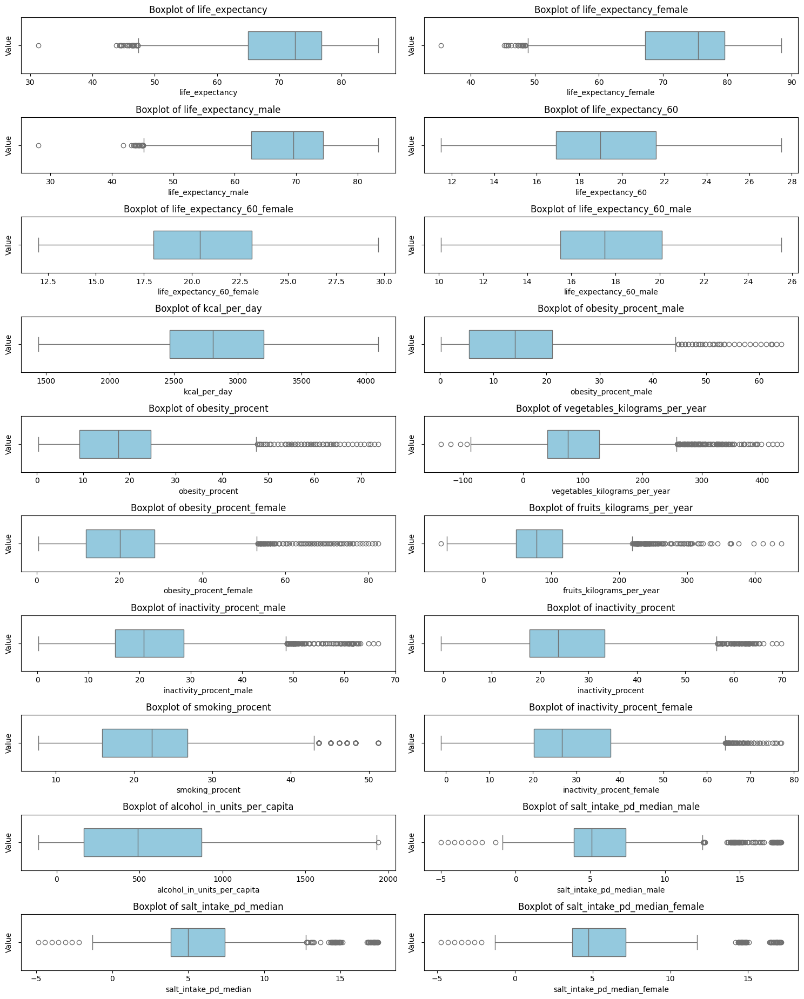

In [249]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure for the plots
plt.figure(figsize=(15, 20))

# Loop through the columns and create boxplots
for i, col in enumerate(columns, 1):
    plt.subplot(len(columns) // 2 + 1, 2, i)
    
    # Plot boxplot (if data is not entirely NaN)
    if df[col].dropna().size > 0:
        sns.boxplot(x=df[col], color="skyblue", width=0.5)
    
    plt.xlabel(col)
    plt.ylabel("Value")
    plt.title(f"Boxplot of {col}")

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


In [244]:
import pandas as pd

# Define life expectancy columns
life_expectancy_columns = [
    "life_expectancy", "life_expectancy_female", "life_expectancy_male",
    "life_expectancy_60", "life_expectancy_60_female", "life_expectancy_60_male"
]

# Function to assign countries to quartiles based on their life expectancy value
def assign_quartiles(df, column):
    # Calculate quartiles for the life expectancy column
    quartiles = df[column].quantile([0.25, 0.5, 0.75])
    
    # Assign each country to a quartile
    df[f'{column}_quartile'] = pd.cut(df[column], 
                                      bins=[-float('inf'), quartiles[0.25], quartiles[0.5], quartiles[0.75], float('inf')], 
                                      labels=['Q1', 'Q2', 'Q3', 'Q4'])
    return df

# Apply the function to the DataFrame for each life expectancy column
for column in life_expectancy_columns:
    # Ensure the quartile column is added to the DataFrame
    df = assign_quartiles(df, column)
    
    print(f"Unique countries assigned to each quartile for {column}:")
    
    # Show unique countries in each quartile
    for quartile in ['Q1', 'Q2', 'Q3', 'Q4']:
        # Filter countries in the specific quartile and get unique iso3 codes
        countries_in_quartile = df[df[f'{column}_quartile'] == quartile]['iso3'].unique()
        
        # Display the countries in the current quartile
        print(f"{quartile}: {countries_in_quartile}")
    
    print("-" * 50)


Unique countries assigned to each quartile for life_expectancy:
Q1: ['AGO' 'BDI' 'BEN' 'BFA' 'BWA' 'CAF' 'CIV' 'CMR' 'COD' 'COG' 'COM' 'DJI'
 'ERI' 'ETH' 'GAB' 'GHA' 'GIN' 'GMB' 'GNB' 'GNQ' 'KEN' 'LBR' 'LSO' 'MDG'
 'MLI' 'MOZ' 'MRT' 'MWI' 'NAM' 'NER' 'NGA' 'RWA' 'SDN' 'SEN' 'SLE' 'SOM'
 'SSD' 'STP' 'SWZ' 'TCD' 'TGO' 'TZA' 'UGA' 'ZAF' 'ZMB' 'ZWE' 'AFG' 'IND'
 'KAZ' 'KHM' 'LAO' 'MMR' 'MNG' 'PAK' 'SYR' 'TKM' 'YEM' 'HTI' 'FSM' 'KIR'
 'PNG' 'SLB' 'VUT' 'GUY' 'TLS']
Q2: ['AGO' 'BDI' 'BEN' 'BFA' 'BWA' 'CIV' 'COD' 'COG' 'COM' 'CPV' 'DJI' 'DZA'
 'EGY' 'ERI' 'ETH' 'GAB' 'GHA' 'GMB' 'GNQ' 'KEN' 'LBR' 'MAR' 'MDG' 'MLI'
 'MRT' 'MUS' 'MWI' 'NAM' 'NER' 'NGA' 'RWA' 'SDN' 'SEN' 'SSD' 'STP' 'SYC'
 'TGO' 'TZA' 'UGA' 'ZAF' 'ZMB' 'ZWE' 'AFG' 'ARM' 'AZE' 'BGD' 'BHR' 'BRN'
 'BTN' 'CHN' 'GEO' 'IDN' 'IND' 'IRQ' 'KAZ' 'KGZ' 'KHM' 'LAO' 'LKA' 'MDV'
 'MMR' 'MNG' 'NPL' 'OMN' 'PAK' 'PHL' 'QAT' 'SAU' 'SYR' 'THA' 'TJK' 'TKM'
 'UZB' 'VNM' 'YEM' 'BGR' 'BLR' 'EST' 'HUN' 'LTU' 'LVA' 'MDA' 'MKD' 'ROU'
 'RUS' 'SRB' 'UKR' '

In [248]:
import pandas as pd

# Assuming the 'year' and 'life_expectancy' columns exist, with 'iso3' for countries

# Filter the data for years 2000 and 2025
df_2000 = df[df['year'] == 2000]
df_2025 = df[df['year'] == 2025]

# Merge the two DataFrames based on 'iso3' (country code)
df_merged = pd.merge(df_2000[['iso3', 'life_expectancy']], df_2025[['iso3', 'life_expectancy']], 
                     on='iso3', suffixes=('_2000', '_2025'))

# Calculate the life expectancy difference
df_merged['life_expectancy_diff'] = df_merged['life_expectancy_2025'] - df_merged['life_expectancy_2000']

# Create quantiles for the life expectancy difference (4 quantiles)
quantiles = pd.qcut(df_merged['life_expectancy_diff'], q=4, labels=False)

# Add the quantile labels to the dataframe
df_merged['life_expectancy_diff_quantile'] = quantiles

# Show the mean difference for each quantile
quantile_summary = df_merged.groupby('life_expectancy_diff_quantile')['life_expectancy_diff'].mean()

# Show the countries in each quantile
countries_in_quantiles = df_merged.groupby('life_expectancy_diff_quantile')['iso3'].unique()

# Print results
print("Mean Life Expectancy Difference by Quantile:")
print(quantile_summary)

print("\nCountries in Each Quantile:")
print(countries_in_quantiles)


Mean Life Expectancy Difference by Quantile:
life_expectancy_diff_quantile
0     2.515217
1     5.126667
2     7.973333
3    15.555556
Name: life_expectancy_diff, dtype: float64

Countries in Each Quantile:
life_expectancy_diff_quantile
0    [ARE, ARG, ATG, BHS, BIH, BRB, BRN, CRI, CUB, ...
1    [ARM, AUS, AUT, BEL, BGR, BLZ, BRA, CAN, CHE, ...
2    [ALB, AZE, BEN, BHR, BLR, BOL, CHN, COL, COM, ...
3    [AFG, AGO, BDI, BFA, BGD, BTN, BWA, CAF, CIV, ...
Name: iso3, dtype: object


In [227]:
import pandas as pd

# List of columns to analyze for life expectancy (excluding gender-specific columns for general analysis)
general_life_expectancy_columns = [
    "life_expectancy", 
    "life_expectancy_60"
]

# Gender-specific life expectancy columns to analyze
gender_life_expectancy_columns = {
    'female': [
        "life_expectancy_female", 
        "life_expectancy_60_female"
    ],
    'male': [
        "life_expectancy_male", 
        "life_expectancy_60_male"
    ]
}

# Other columns to calculate mean and median for
columns_to_analyze = [
    'kcal_per_day',
    'obesity_procent_male',
    'obesity_procent',
    'vegetables_kilograms_per_year',
    'obesity_procent_female',
    'fruits_kilograms_per_year',
    'inactivity_procent_male',
    'inactivity_procent',
    'smoking_procent',
    'inactivity_procent_female',
    'alcohol_in_units_per_capita',
    'salt_intake_pd_median_male',
    'salt_intake_pd_median',
    'salt_intake_pd_median_female'
]

# Function to calculate the quantiles and then the mean and median
def calculate_quantile_stats(df, life_expectancy_column, quantiles=4):
    # Create quantiles
    df['quantile'] = pd.qcut(df[life_expectancy_column], quantiles, labels=False)
    
    # Calculate the mean and median for each quantile
    stats = df.groupby('quantile')[columns_to_analyze].agg(['mean', 'median']).reset_index()
    
    # Clean up multi-level column index for better readability
    stats.columns = ['_'.join(col).strip() for col in stats.columns.values]
    
    return stats

# Function to clean up column names based on gender specificity (remove female/male columns for general analysis)
def clean_column_names(stats, gender=None):
    if gender:
        # Only keep male or female columns based on the gender specified
        stats = stats.loc[:, stats.columns.str.contains(gender)]
    else:
        # Remove any gender-specific columns for general life expectancy analysis
        stats = stats.loc[:, ~stats.columns.str.contains('female|male')]
    return stats

# Calculate stats for general life expectancy (excluding gender-specific)
general_stats = {}
for life_column in general_life_expectancy_columns:
    stats = calculate_quantile_stats(df, life_column, quantiles=4)
    stats = clean_column_names(stats)  # Remove gender-specific columns
    general_stats[life_column] = stats

# Calculate stats for male-specific and female-specific life expectancy
gender_stats = {}
for gender, columns in gender_life_expectancy_columns.items():
    for life_column in columns:
        stats = calculate_quantile_stats(df, life_column, quantiles=4)
        stats = clean_column_names(stats, gender=gender)  # Keep only male or female columns
        gender_stats[life_column] = stats

# Display results for general life expectancy (non-gender-specific)
for life_column, stats in general_stats.items():
    print(f"### Stats for {life_column.replace('_', ' ').title()} (General) ###\n")
    print(stats.to_string(index=False))  # Print without the index for cleaner output
    print("\n" + "="*60 + "\n")

# Display results for male and female-specific life expectancy
for life_column, stats in gender_stats.items():
    gender_label = 'Female' if 'female' in life_column else 'Male'
    print(f"### Stats for {life_column.replace('_', ' ').title()} ({gender_label}) ###\n")
    print(stats.to_string(index=False))  # Print without the index for cleaner output
    print("\n" + "="*60 + "\n")


### Stats for Life Expectancy (General) ###

 quantile_  kcal_per_day_mean  kcal_per_day_median  obesity_procent_mean  obesity_procent_median  vegetables_kilograms_per_year_mean  vegetables_kilograms_per_year_median  fruits_kilograms_per_year_mean  fruits_kilograms_per_year_median  inactivity_procent_mean  inactivity_procent_median  smoking_procent_mean  smoking_procent_median  alcohol_in_units_per_capita_mean  alcohol_in_units_per_capita_median  salt_intake_pd_median_mean  salt_intake_pd_median_median
         0        2382.416815           2390.28985             10.322373                    7.69                           41.505938                             36.772705                       60.513865                         47.671986                20.222178                     18.465             17.161299                    14.7                        373.360371                               286.0                    4.782516                       4.59740
         1        2672.672235

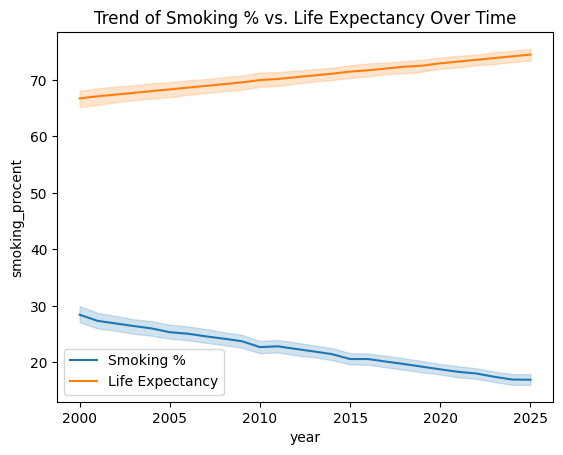

In [250]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.lineplot(x=df["year"], y=df["smoking_procent"], label="Smoking %")
sns.lineplot(x=df["year"], y=df["life_expectancy"], label="Life Expectancy")
plt.legend()
plt.title("Trend of Smoking % vs. Life Expectancy Over Time")
plt.show()


In [274]:
# Voeg GDP per day toe aan de lijst van onafhankelijke variabelen
X = df[[
    'kcal_per_day', 'obesity_procent', 'vegetables_kilograms_per_year',
    'fruits_kilograms_per_year', 'inactivity_procent', 'smoking_procent',
    'alcohol_in_units_per_capita', 'salt_intake_pd_median', 'gdp_usd_p_year'
]]

# Voeg constante toe voor het model
X = sm.add_constant(X)

# Afhankelijke variabele
y = df['life_expectancy']

# Pas de regressie toe
model = sm.OLS(y, X).fit()

# Resultaten tonen
print(model.summary())



                            OLS Regression Results                            
Dep. Variable:        life_expectancy   R-squared:                       0.654
Model:                            OLS   Adj. R-squared:                  0.653
Method:                 Least Squares   F-statistic:                     986.9
Date:                Thu, 03 Apr 2025   Prob (F-statistic):               0.00
Time:                        20:50:57   Log-Likelihood:                -14252.
No. Observations:                4706   AIC:                         2.852e+04
Df Residuals:                    4696   BIC:                         2.859e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

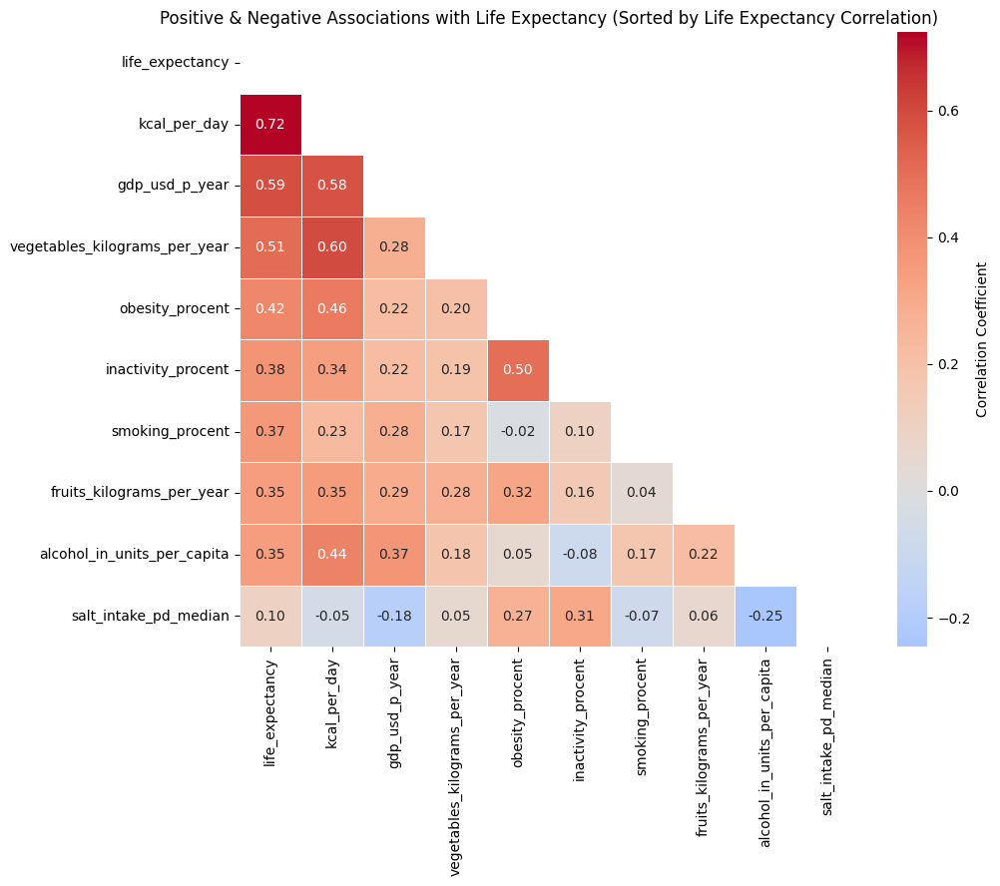

In [279]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Select relevant columns
columns = [
    'life_expectancy', "kcal_per_day", 'obesity_procent', 'vegetables_kilograms_per_year',
    'fruits_kilograms_per_year', 'inactivity_procent', 'smoking_procent',
    'alcohol_in_units_per_capita', 'salt_intake_pd_median', "gdp_usd_p_year"
]

# Compute correlation matrix
corr_matrix = df[columns].corr()

# Sort the correlations of each variable with 'life_expectancy'
life_expectancy_corr = corr_matrix['life_expectancy'].sort_values(ascending=False)

# Reorder columns based on correlation with life expectancy
sorted_columns = life_expectancy_corr.index

# Create the sorted correlation matrix
sorted_corr_matrix = corr_matrix[sorted_columns].loc[sorted_columns]

# Mask upper triangle (to avoid mirroring)
mask = np.triu(np.ones_like(sorted_corr_matrix, dtype=bool))

# Separate positive and negative correlations
plt.figure(figsize=(10, 8))
sns.heatmap(
    sorted_corr_matrix, mask=mask, annot=True, cmap="coolwarm", fmt=".2f",
    center=0, linewidths=0.5, cbar_kws={'label': 'Correlation Coefficient'}
)
plt.title("Positive & Negative Associations with Life Expectancy (Sorted by Life Expectancy Correlation)")
plt.show()


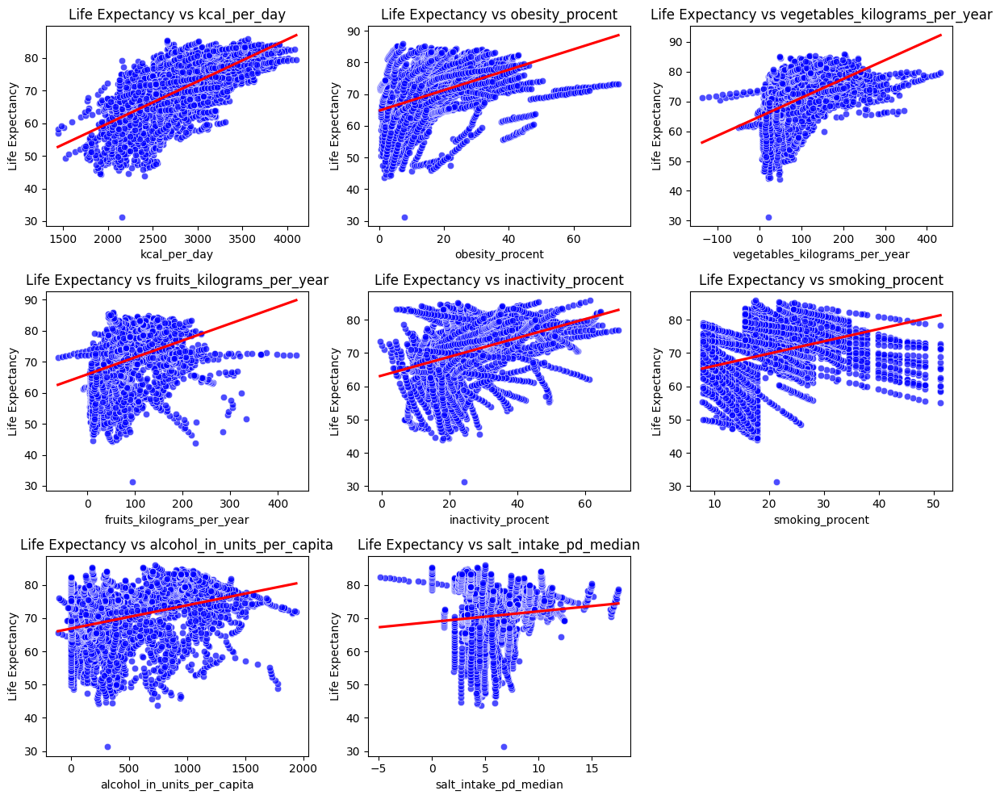

In [262]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select relevant columns for scatterplots
columns_to_plot = [
    "kcal_per_day", "obesity_procent", "vegetables_kilograms_per_year",
    "fruits_kilograms_per_year", "inactivity_procent", "smoking_procent",
    "alcohol_in_units_per_capita", "salt_intake_pd_median"
]

# Create scatterplots
plt.figure(figsize=(12, 10))
for i, col in enumerate(columns_to_plot, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(x=df[col], y=df["life_expectancy"], alpha=0.7, color="blue")
    sns.regplot(x=df[col], y=df["life_expectancy"], scatter=False, color="red", ci=None)
    plt.xlabel(col)
    plt.ylabel("Life Expectancy")
    plt.title(f"Life Expectancy vs {col}")

plt.tight_layout()
plt.show()


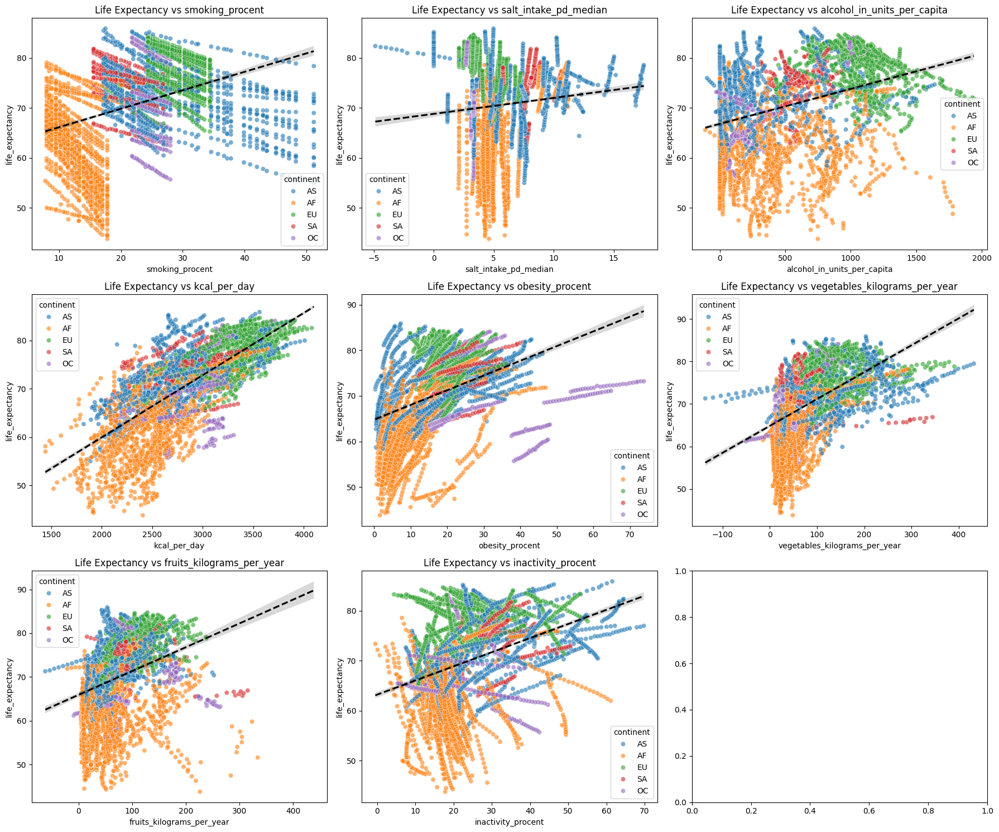

/Users/noachmeged/Documents/Ironhack/Project-Amazon/Flask/.venv/lib/python3.9/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


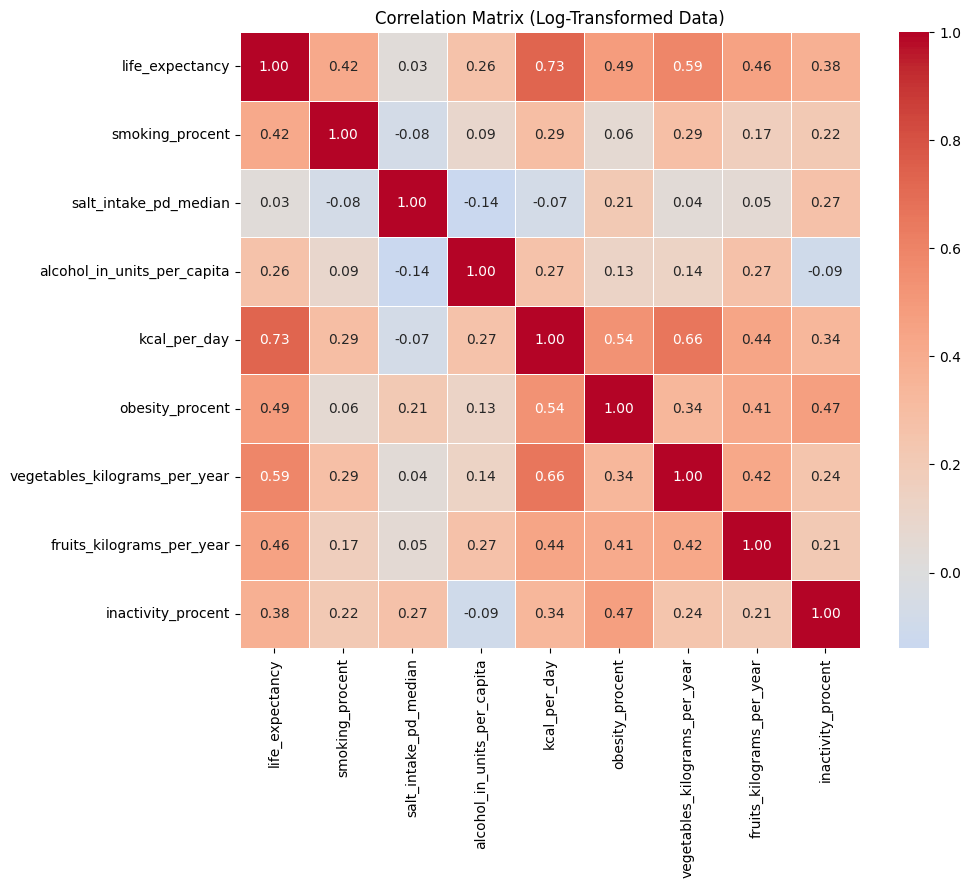

/var/folders/70/qw9qt2rd3c3_qj2hjz4wfvxm0000gn/T/ipykernel_8644/2676771142.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  quartile_summary[feature] = df_quartiles.groupby(f'{feature}_quartile')['life_expectancy'].mean()


{'smoking_procent': smoking_procent_quartile
 Q1    63.437748
 Q2    71.078858
 Q3    74.107137
 Q4    74.213511
 Name: life_expectancy, dtype: float64,
 'salt_intake_pd_median': salt_intake_pd_median_quartile
 Q1    74.266390
 Q2    64.289373
 Q3    69.971939
 Q4    73.788275
 Name: life_expectancy, dtype: float64,
 'alcohol_in_units_per_capita': alcohol_in_units_per_capita_quartile
 Q1    67.673854
 Q2    67.158963
 Q3    72.403833
 Q4    75.329652
 Name: life_expectancy, dtype: float64}

In [269]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Stap 1: Scatterplots met regressielijnen per continent
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
axes = axes.flatten()

scatter_features = ['smoking_procent', 'salt_intake_pd_median', 'alcohol_in_units_per_capita',
                    'kcal_per_day', 'obesity_procent', 'vegetables_kilograms_per_year',
                    'fruits_kilograms_per_year', 'inactivity_procent', "gdp"]

for i, feature in enumerate(scatter_features):
    if i >= len(axes):
        break
    sns.scatterplot(data=df, x=feature, y='life_expectancy', hue='continent', alpha=0.6, ax=axes[i])
    sns.regplot(data=df, x=feature, y='life_expectancy', scatter=False, ax=axes[i], color='black', line_kws={"linestyle": "dashed"})
    axes[i].set_title(f'Life Expectancy vs {feature}')

plt.tight_layout()
plt.show()

# Stap 2: Correlatiematrix met log-transformatie (voorkomt extreme waarden)
df_log = df.copy()
for col in scatter_features:
    df_log[col] = np.log1p(df_log[col])  # log1p voorkomt log(0) fouten

corr_matrix_log = df_log[['life_expectancy'] + scatter_features].corr()

# Plot heatmap met log-transformatie
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_log, annot=True, cmap="coolwarm", fmt=".2f", center=0, linewidths=0.5)
plt.title("Correlation Matrix (Log-Transformed Data)")
plt.show()

# Stap 3: Quartielanalyse voor roken, alcohol en zoutinname
quartile_features = ['smoking_procent', 'salt_intake_pd_median', 'alcohol_in_units_per_capita']
df_quartiles = df.copy()

# Kwantielen toewijzen
for feature in quartile_features:
    df_quartiles[f'{feature}_quartile'] = pd.qcut(df_quartiles[feature], q=4, labels=['Q1', 'Q2', 'Q3', 'Q4'])

# Gemiddelde levensverwachting per kwantiel per risicofactor
quartile_summary = {}
for feature in quartile_features:
    quartile_summary[feature] = df_quartiles.groupby(f'{feature}_quartile')['life_expectancy'].mean()

quartile_summary


In [281]:
import statsmodels.api as sm

# Maak een nieuwe kolom voor de interactie tussen roken en zoutinname
df['smoking_salt_interaction'] = df['smoking_procent'] * df['salt_intake_pd_median']

# Voeg andere relevante interactietermen toe (bijv. alcohol en zout)
df['alcohol_salt_interaction'] = df['alcohol_in_units_per_capita'] * df['salt_intake_pd_median']

# Definieer de onafhankelijke variabelen (inclusief interacties)
X = df[['kcal_per_day', 'obesity_procent', 'vegetables_kilograms_per_year', 
        'fruits_kilograms_per_year', 'inactivity_procent', 'smoking_procent', 
        'alcohol_in_units_per_capita', 'salt_intake_pd_median', 
        'smoking_salt_interaction', 'alcohol_salt_interaction','gdp_usd_p_year']]

# Voeg een constante toe voor de intercept
X = sm.add_constant(X)

# Afhankelijke variabele
y = df['life_expectancy']

# Fit het model met interactietermen
model = sm.OLS(y, X).fit()

# Toon de samenvatting van het model
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:        life_expectancy   R-squared:                       0.660
Model:                            OLS   Adj. R-squared:                  0.659
Method:                 Least Squares   F-statistic:                     829.1
Date:                Thu, 03 Apr 2025   Prob (F-statistic):               0.00
Time:                        20:55:09   Log-Likelihood:                -14211.
No. Observations:                4706   AIC:                         2.845e+04
Df Residuals:                    4694   BIC:                         2.852e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         